In [1]:
%load_ext autoreload 
%autoreload 2
import cv2
import json, os, cv2
from pathlib import Path
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import xarray as xr
import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')
#sys.path.append(r'C:\Users\nlab\Documents\GitHub\obstacle_avoidance\plots') # go to parent dir 
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from scipy.stats import gaussian_kde

from utils.base_functions import *

from streamline_clustering.clustering import *
from src.utils.auxiliary import flatten_series
from src.utils.path import find
from src.base import BaseInput
from plots.plots import plot_oa
from plots.plots2 import *
#from plots.plots import *
import warnings
warnings.filterwarnings('ignore')
from dipy.segment.clustering import QuickBundles
from streamline_clustering.svm_clasiffier import *


<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
def ts_lateral_error_to_target_port(df):
    for direction, direction_frame in df.groupby(['odd']):
        for ind,row in direction_frame.iterrows():
            if direction == 'right':
                nose_y = row['ts_nose_y_cm'].astype(float)
                port_y = np.nanmean([np.nanmean(row['leftportB_y_cm']),row['leftportT_y_cm']])
                lateral_error = []
                for i in nose_y:
                    err = np.abs(i -port_y)
                    lateral_error.append(err)
                lateral_error = np.array(lateral_error)        
                df.at[ind,'ts_lateral_error_to_target_port'] = lateral_error.astype(object) 
            else:
                nose_y = row['ts_nose_y_cm'].astype(float)
                port_y = np.nanmean([np.nanmean(row['rightportB_y_cm']),row['rightportT_y_cm']])
                lateral_error = []
                for i in nose_y:
                    err = np.abs(i -port_y)
                    lateral_error.append(err)
                lateral_error = np.array(lateral_error)        
                df.at[ind,'ts_lateral_error_to_target_port'] = lateral_error.astype(object) 
                
def compute_obstacle_tortuosity_distance_threshold(df,thresh):
    drop_nans_in_columns(df,'obstacle_ind')
    for ind,row in df.iterrows():
        nose_x = row.ts_nose_x_cm
        nose_y = row.ts_nose_y_cm
        try:
            distance_thresh = np.argwhere(row.ts_distance_from_edge>=thresh).max()
            obstacle_ind = int(row.obstacle_ind)
        except ValueError:
            continue
        try:
            thresh_tor, thresh_lin = compute_tortuosity(nose_x[distance_thresh:obstacle_ind],nose_y[distance_thresh:obstacle_ind])
            df.at[ind,'ob_tortuosity'+'_'+str(thresh)] =thresh_tor
            df.at[ind,'ob_linearity'+'_'+str(thresh)] = thresh_lin
            df.at[ind,'percent_change_ob_tortuosity'+'_'+str(thresh)] =(thresh_tor - row.ob_tortuosity) * 100
            df.at[ind,'percent_change_ob_linearity'+'_'+str(thresh)] = (thresh_lin - row.ob_linearity) * 100
        except IndexError:
            df.at[ind,'ob_tortuosity'+'_'+str(thresh)] =np.nan
            df.at[ind,'ob_linearity'+'_'+str(thresh)] = np.nan
            df.at[ind,'percent_change_ob_tortuosity'+'_'+str(thresh)] =np.nan
            df.at[ind,'percent_change_ob_linearity'+'_'+str(thresh)] = np.nan

In [ ]:
begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()

In [3]:
def calculate_obstalce_and_edge_vector_angle(df,thresh,thresh1):
    """only use long df"""
    for ind,row in df.iterrows():
        if row.obstacle_cluster == 0:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleBR_x_cm,row.gt_obstacleBR_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge<=thresh1).min()
                if distance_thresh == distance_thresh1:
                    continue
                else:

                    obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                    edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                    mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                    obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                    edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                    df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                    df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue

            
        elif row.obstacle_cluster == 1:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleBL_x_cm,row.gt_obstacleBL_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge<=thresh1).min()
                if distance_thresh == distance_thresh1:
                    continue
                else:

                    obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                    edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                    mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                    obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                    edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                    df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                    df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            
        elif row.obstacle_cluster == 4:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleTR_x_cm,row.gt_obstacleTR_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge<=thresh1).min()
                if distance_thresh == distance_thresh1:
                    continue
                else:

                    obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                    edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                    mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                    obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                    edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                    df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                    df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            
            
        elif row.obstacle_cluster == 5:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleTL_x_cm,row.gt_obstacleTL_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge<=thresh1).min()
                if distance_thresh == distance_thresh1:
                    continue
                else:

                    obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                    edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                    mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                    obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                    edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                    df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                    df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            

In [ ]:
def calculate_obstalce__angle(df,thresh):
    """only use long df"""
    for ind,row in df.iterrows():
        if row.obstacle_cluster == 0:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            spine_x, spine_y = row.ts_spine_x_cm.astype(float),row.ts_spine_y_cm.astype(float)
            edge_x,edge_y = row.gt_obstacleBR_x_cm,row.gt_obstacleBR_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                edge_vector = calculate_vector_between_points((spine_x[distance_thresh],spine_y[distance_thresh]),(edge_x,edge_y))
                mouse_vector=calculate_vector_between_points((spine_x[distance_thresh],spine_y[distance_thresh]),(nose_x[distance_thresh],nose_y[distance_thresh]))
                obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)] = obstacle_ang
                    
            except ValueError:
                continue

            
        elif row.obstacle_cluster == 1:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            spine_x, spine_y = row.ts_spine_x_cm.astype(float),row.ts_spine_y_cm.astype(float)
            edge_x,edge_y = row.gt_obstacleBL_x_cm,row.gt_obstacleBL_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                mouse_vector=calculate_vector_between_points((spine_x[distance_thresh],spine_y[distance_thresh]),(nose_x[distance_thresh],nose_y[distance_thresh]))
                obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)] = obstacle_ang
            except ValueError:
                continue
            
        elif row.obstacle_cluster == 4:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleTR_x_cm,row.gt_obstacleTR_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                if distance_thresh == distance_thresh1:
                    continue
                else:

                    obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                    edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                    mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                    obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                    edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                    df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                    df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            
            
        elif row.obstacle_cluster == 5:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleTL_x_cm,row.gt_obstacleTL_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge<=thresh).min()
                if distance_thresh == distance_thresh1:
                    continue
                else:

                    obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                    edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                    mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                    obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                    edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                    df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                    df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            

In [ ]:
compute_obstacle_tortuosity_distance_threshold(light,10)

In [4]:
light = pd.read_hdf(r"D:\obstacle_avoidance\recordings\data_h5\oa_df_04142024.h5")
head_body_angle(light)
get_ob_distance_from_mean_center(light)
lateral_error_open_corner(light)
ts_lateral_error_to_target_port(light)
compute_obstacle_tortuosity_distance_threshold(light,10)
ns_oa_long,ns_oa_short,ns_oa_middle = create_df_by_type_nostart(light)
oa_long,oa_short,oa_middle = create_df_by_type(light)


ow_oa_long,ow_oa_short,ow_oa_middle = create_df_by_type_out_ofway(light)

dark = pd.read_hdf(r"D:\obstacle_avoidance\recordings\data_h5\dark_oa_df_04142024.h5")
head_body_angle(dark)
get_ob_distance_from_mean_center(dark)
lateral_error_open_corner(dark)
ts_lateral_error_to_target_port(dark)
compute_obstacle_tortuosity_distance_threshold(dark,10)

ns_dark_long,ns_dark_short,ns_dark_middle = create_df_by_type_nostart(dark)
dark_long,dark_short,dark_middle = create_df_by_type(dark)

ow_dark_long,ow_dark_short,ow_dark_middle = create_df_by_type_out_ofway(dark)

In [6]:
for ind,row in dark_long.iterrows():
    if row.date == '071023':
        dark_long.at[ind,'skill'] = 'naive'
    elif row.date == '071123':
        dark_long.at[ind,'skill'] = 'early'
    elif row.date == '071223':
        dark_long.at[ind,'skill'] = 'middle'
    elif row.date == '071323':
        dark_long.at[ind,'skill'] = 'late'

2.5202694572302855 44.89505836273849


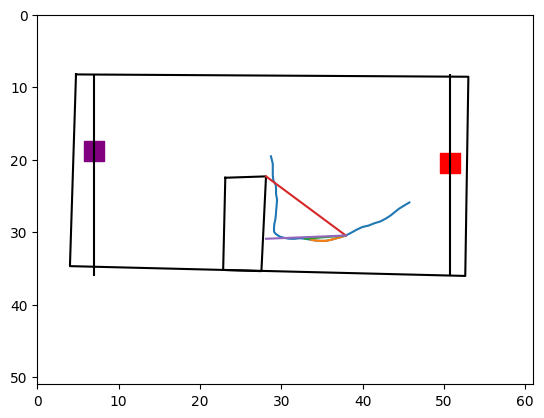

In [118]:
#dark_trail = dark_long.sample(1)
fig,ax = plt.subplots()
plot_arena_single(dark_trail,ax,obstacle=True)
nose_x = dark_trail.ts_nose_x_cm.to_numpy()[0]
nose_y = dark_trail.ts_nose_y_cm.to_numpy()[0]
edge_x,edge_y = dark_trail.gt_obstacleTR_x_cm.to_numpy()[0],dark_trail.gt_obstacleTR_y_cm.to_numpy()[0]
distance_thresh = np.argwhere(dark_trail.ts_distance_from_edge.to_numpy()[0]>=10).max()
distance_thresh2 = np.argwhere(dark_trail.ts_distance_from_edge.to_numpy()[0]>=5).max()
obstacle_ind = int(dark_trail.obstacle_ind)
ax.plot(dark_trail.obstacle_nose_x.to_numpy()[0],dark_trail.obstacle_nose_y.to_numpy()[0])
#ax.plot([dark_trail.obstacle_nose_x.to_numpy()[0][0],dark_trail.obstacle_nose_x.to_numpy()[0][-1]],[dark_trail.obstacle_nose_y.to_numpy()[0][0],dark_trail.obstacle_nose_y.to_numpy()[0][-1]])
ax.plot(nose_x[distance_thresh:distance_thresh2],nose_y[distance_thresh:distance_thresh2])
ax.plot([nose_x[distance_thresh],nose_x[distance_thresh2]],[nose_y[distance_thresh],nose_y[distance_thresh2]])
ax.plot([nose_x[distance_thresh],edge_x],[nose_y[distance_thresh],edge_y])
ax.plot([nose_x[distance_thresh],edge_x],[nose_y[distance_thresh],nose_y[distance_thresh2]])

obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh2]))
edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh2],nose_y[distance_thresh2]))
obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
print(obstacle_ang,edge_ang)



63.57856791007113 19.731716884228195


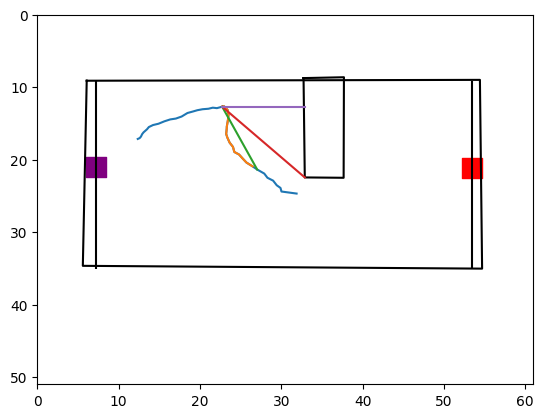

In [10]:
light_trail = oa_long.sample(1)
fig,ax = plt.subplots()
plot_arena_single(light_trail,ax,obstacle=True)
nose_x = light_trail.ts_nose_x_cm.to_numpy()[0]
nose_y = light_trail.ts_nose_y_cm.to_numpy()[0]
edge_x,edge_y = light_trail.gt_obstacleBL_x_cm.to_numpy()[0],light_trail.gt_obstacleBL_y_cm.to_numpy()[0]
distance_thresh = np.argwhere(light_trail.ts_distance_from_edge.to_numpy()[0]>=10).max()
distance_thresh2 = np.argwhere(light_trail.ts_distance_from_edge.to_numpy()[0]>=5).max()
obstacle_ind = int(light_trail.obstacle_ind)
ax.plot(light_trail.obstacle_nose_x.to_numpy()[0],light_trail.obstacle_nose_y.to_numpy()[0])
#ax.plot([light_trail.obstacle_nose_x.to_numpy()[0][0],light_trail.obstacle_nose_x.to_numpy()[0][-1]],[light_trail.obstacle_nose_y.to_numpy()[0][0],light_trail.obstacle_nose_y.to_numpy()[0][-1]])
ax.plot(nose_x[distance_thresh:distance_thresh2],nose_y[distance_thresh:distance_thresh2])
ax.plot([nose_x[distance_thresh],nose_x[distance_thresh2]],[nose_y[distance_thresh],nose_y[distance_thresh2]])
ax.plot([nose_x[distance_thresh],edge_x],[nose_y[distance_thresh],edge_y])
ax.plot([nose_x[distance_thresh],edge_x],[nose_y[distance_thresh],nose_y[distance_thresh]])

obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh2],nose_y[distance_thresh2]))
obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
print(obstacle_ang,edge_ang)

#ax.plot([light_trail.obstacle_nose_x.to_numpy()[0][distance_thresh],light_trail.obstacle_nose_x.to_numpy()[0][-1]],[light_trail.obstacle_nose_y.to_numpy()[0][distance_thresh],light_trail.obstacle_nose_y.to_numpy()[0][-1]])


In [7]:
data = pd.concat([oa_long,dark_long])
calculate_obstalce_and_edge_vector_angle(data,20,15)
calculate_obstalce_and_edge_vector_angle(data,15,10)
calculate_obstalce_and_edge_vector_angle(data,10,5)
compute_obstacle_tortuosity_distance_threshold(data,20)
compute_obstacle_tortuosity_distance_threshold(data,15)
compute_obstacle_tortuosity_distance_threshold(data,10)
compute_obstacle_tortuosity_distance_threshold(data,5)
data = data.drop(columns = ['level_0'])
data = data.reset_index()

In [8]:
edge_vector_df_all = data.melt(id_vars=['task','edge_vector_ang_20_15','edge_vector_ang_15_10','edge_vector_ang_10_5']).drop(columns=['variable','value'])

edge_vector_df_20_15 = edge_vector_df_all[['task','edge_vector_ang_20_15']]
edge_vector_df_20_15['type'] = 'edge_vector_ang_20_15'
edge_vector_df_20_15['value']=  edge_vector_df_20_15['edge_vector_ang_20_15']
edge_vector_df_20_15 = edge_vector_df_20_15.drop(columns=['edge_vector_ang_20_15'])

edge_vector_df_15_10 = edge_vector_df_all[['task','edge_vector_ang_15_10']]
edge_vector_df_15_10['type'] = 'edge_vector_ang_15_10'
edge_vector_df_15_10['value']=  edge_vector_df_15_10['edge_vector_ang_15_10']
edge_vector_df_15_10 = edge_vector_df_15_10.drop(columns=['edge_vector_ang_15_10'])

edge_vector_df_10_5 = edge_vector_df_all[['task','edge_vector_ang_10_5']]
edge_vector_df_10_5['type'] = 'edge_vector_ang_10_5'
edge_vector_df_10_5['value']=  edge_vector_df_10_5['edge_vector_ang_10_5']
edge_vector_df_10_5 = edge_vector_df_10_5.drop(columns=['edge_vector_ang_10_5'])

edge_vector_df = pd.concat([edge_vector_df_20_15,edge_vector_df_15_10,edge_vector_df_10_5])
edge_vector_df = edge_vector_df[edge_vector_df['value'].notna()]

In [9]:
obstacle_vector_df_all = data.melt(id_vars=['task','obstacle_vector_ang_20_15','obstacle_vector_ang_15_10','obstacle_vector_ang_10_5']).drop(columns=['variable','value'])

obstacle_vector_df_20_15 = obstacle_vector_df_all[['task','obstacle_vector_ang_20_15']]
obstacle_vector_df_20_15['type'] = 'obstacle_vector_ang_20_15'
obstacle_vector_df_20_15['value']=  obstacle_vector_df_20_15['obstacle_vector_ang_20_15']
obstacle_vector_df_20_15 = obstacle_vector_df_20_15.drop(columns=['obstacle_vector_ang_20_15'])

obstacle_vector_df_15_10 = obstacle_vector_df_all[['task','obstacle_vector_ang_15_10']]
obstacle_vector_df_15_10['type'] = 'obstacle_vector_ang_15_10'
obstacle_vector_df_15_10['value']=  obstacle_vector_df_15_10['obstacle_vector_ang_15_10']
obstacle_vector_df_15_10 = obstacle_vector_df_15_10.drop(columns=['obstacle_vector_ang_15_10'])

obstacle_vector_df_10_5 = obstacle_vector_df_all[['task','obstacle_vector_ang_10_5']]
obstacle_vector_df_10_5['type'] = 'obstacle_vector_ang_10_5'
obstacle_vector_df_10_5['value']=  obstacle_vector_df_10_5['obstacle_vector_ang_10_5']
obstacle_vector_df_10_5 = obstacle_vector_df_10_5.drop(columns=['obstacle_vector_ang_10_5'])

obstacle_vector_df = pd.concat([obstacle_vector_df_20_15,obstacle_vector_df_15_10,obstacle_vector_df_10_5])
obstacle_vector_df = obstacle_vector_df[obstacle_vector_df['value'].notna()]

(0.0, 60.0)

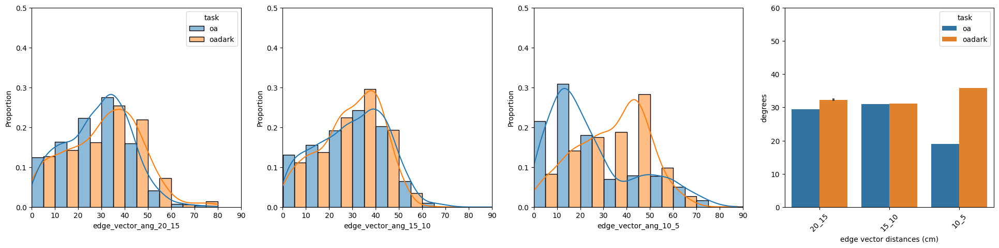

In [196]:
fig,ax = plt.subplots(1,4,figsize = (24,5),sharey=False)
for subplot in ax.reshape(-1):
    subplot.set_xlim([0,90])
    subplot.set_ylim([0,.5])
sns.histplot(data=data,x='edge_vector_ang_20_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =10,ax=ax[0])
sns.histplot(data=data,x='edge_vector_ang_15_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =10,ax=ax[1],legend=False)
sns.histplot(data=data,x='edge_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =10,ax=ax[2],legend=False)

sns.barplot(data=edge_vector_df ,x='type',y='value',hue = 'task',estimator='median',ax = ax[3],errorbar = 'se')
ax[3].set_ylim([0,90])
ax[3].set_xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'],rotation=45)
ax[3].set(ylabel = 'degrees',xlabel = 'edge vector distances (cm)')
#ax[3].set_xlabel('obstacle vector distances (cm)')
ax[3].set_ylim([0,60])







(0.0, 60.0)

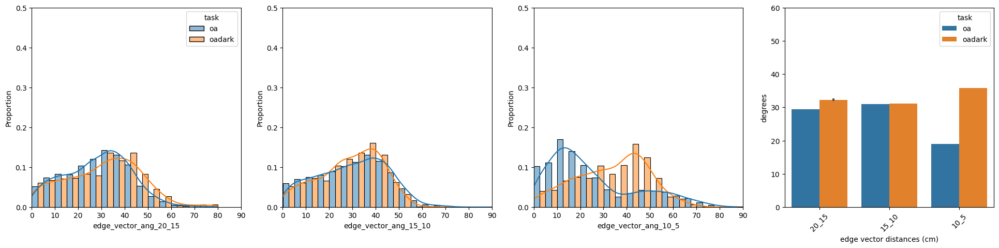

In [197]:
fig,ax = plt.subplots(1,4,figsize = (24,5),sharey=False)
for subplot in ax.reshape(-1):
    subplot.set_xlim([0,90])
    subplot.set_ylim([0,.5])
sns.histplot(data=data,x='edge_vector_ang_20_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =5,ax=ax[0])
sns.histplot(data=data,x='edge_vector_ang_15_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =5,ax=ax[1],legend=False)
sns.histplot(data=data,x='edge_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =5,ax=ax[2],legend=False)

sns.barplot(data=edge_vector_df ,x='type',y='value',hue = 'task',estimator='median',ax = ax[3],errorbar = 'se')
ax[3].set_ylim([0,90])
ax[3].set_xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'],rotation=45)
ax[3].set(ylabel = 'degrees',xlabel = 'edge vector distances (cm)')
#ax[3].set_xlabel('obstacle vector distances (cm)')
ax[3].set_ylim([0,60])



(0.0, 60.0)

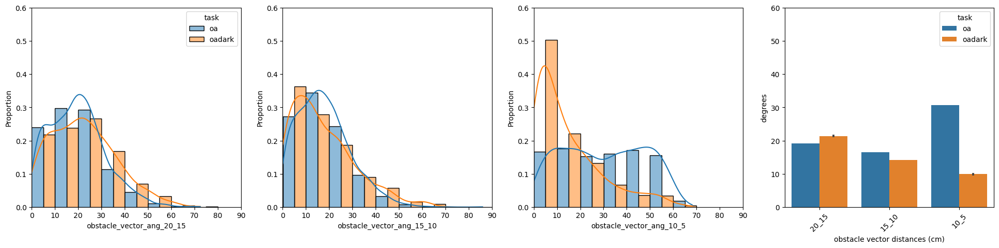

In [198]:
fig,ax = plt.subplots(1,4,figsize = (24,5),sharey=False)
for subplot in ax.reshape(-1):
    subplot.set_xlim([0,90])
    subplot.set_ylim([0,.6])
sns.histplot(data=data,x='obstacle_vector_ang_20_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =10,ax=ax[0])
sns.histplot(data=data,x='obstacle_vector_ang_15_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =10,ax=ax[1],legend=False)
sns.histplot(data=data,x='obstacle_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =10,ax=ax[2],legend=False)

sns.barplot(data=obstacle_vector_df ,x='type',y='value',hue = 'task',estimator='median',ax = ax[3],errorbar = 'se')
ax[3].set_ylim([0,90])
ax[3].set_xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'],rotation=45)
ax[3].set(ylabel = 'degrees',xlabel = 'obstacle vector distances (cm)')
#ax[3].set_xlabel('obstacle vector distances (cm)')
ax[3].set_ylim([0,60])


(0.0, 60.0)

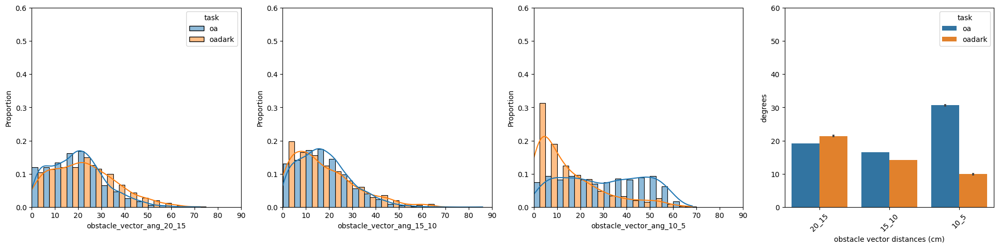

In [94]:
fig,ax = plt.subplots(1,4,figsize = (24,5),sharey=False)
for subplot in ax.reshape(-1):
    subplot.set_xlim([0,90])
    subplot.set_ylim([0,.6])
sns.histplot(data=data,x='obstacle_vector_ang_20_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =5,ax=ax[0])
sns.histplot(data=data,x='obstacle_vector_ang_15_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =5,ax=ax[1],legend=False)
sns.histplot(data=data,x='obstacle_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,binwidth =5,ax=ax[2],legend=False)

sns.barplot(data=obstacle_vector_df ,x='type',y='value',hue = 'task',estimator='median',ax = ax[3])
ax[3].set_ylim([0,90])
ax[3].set_xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'],rotation=45)
ax[3].set(ylabel = 'degrees',xlabel = 'obstacle vector distances (cm)')
#ax[3].set_xlabel('obstacle vector distances (cm)')
ax[3].set_ylim([0,60])


In [16]:


def resample(array,bins):
    """interpolate array across fake time bins"""
    fake_time = np.linspace(0,1,bins)
    xT = np.linspace(0,1,len(array))
    resampled_array = interp1d(xT, array, bounds_error=False)(fake_time)
    resampled_array = pd.Series(resampled_array)
    resampled_array.fillna(method='ffill', axis=0, inplace=True)
    resampled_array.fillna(method='bfill', axis=0, inplace=True)


    return resampled_array.to_numpy()

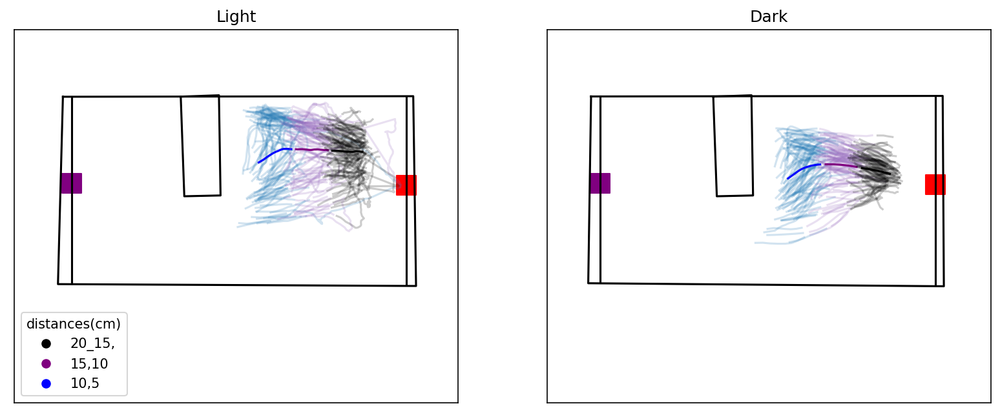

In [38]:
cluster = 0
all = data[ (data.obstacle_cluster == cluster)] 
test = data[(data.task == 'oa') & (data.obstacle_cluster == cluster) & (data.skill == 'naive')] 
trial = test.sample(100)
trial = drop_nans_in_columns(trial,'edge_vector_ang_20_15')
fig,ax = plt.subplots(1,2,figsize = (13,5),dpi=150)
plot_arena(trial,ax[0],obstacle=True)
#plot_arena(all,ax[1],obstacle=True)
trial_trajectories_x = []
trial_trajectories_y = []
ax[0].set_title('Light')
ax[1].set_title('Dark')

for subplot in ax:
    subplot.set_xticks([])
    subplot.set_yticks([]) 

for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=10).min(),np.argwhere(row.ts_distance_from_edge<=5).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:blue',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'blue')
trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=15).min(),np.argwhere(row.ts_distance_from_edge<=10).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:purple',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'purple')

trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'black',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'black')


test = data[(data.task == 'oa') & (data.obstacle_cluster == cluster)&(data.skill == 'late') ] 
trial = test.sample(100)
trial = drop_nans_in_columns(trial,'edge_vector_ang_20_15')
plot_arena(all,ax[1],obstacle=True)
#plot_orginal_obstacle(trial,ax[1],cluster)

trial_trajectories_x = []
trial_trajectories_y = []

for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=10).min(),np.argwhere(row.ts_distance_from_edge<=5).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end]+3,row.obstacle_nose_y[begining:end]+3,c = 'tab:blue',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0)+3,np.nanmean(trial_trajectories_y,axis=0)+3,c = 'blue')
trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=15).min(),np.argwhere(row.ts_distance_from_edge<=10).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end]+3,row.obstacle_nose_y[begining:end]+3,c = 'tab:purple',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0)+3,np.nanmean(trial_trajectories_y,axis=0)+3,c = 'purple')

trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end]+3,row.obstacle_nose_y[begining:end]+3,c = 'black',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0)+3,np.nanmean(trial_trajectories_y,axis=0)+3,c = 'black')



markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['black','purple','blue']]

ax[0].legend( markers,['20_15,','15,10','10,5'] ,numpoints=1,title = 'distances(cm)')



<AxesSubplot: xlabel='arenaTL_x_cm', ylabel='Count'>

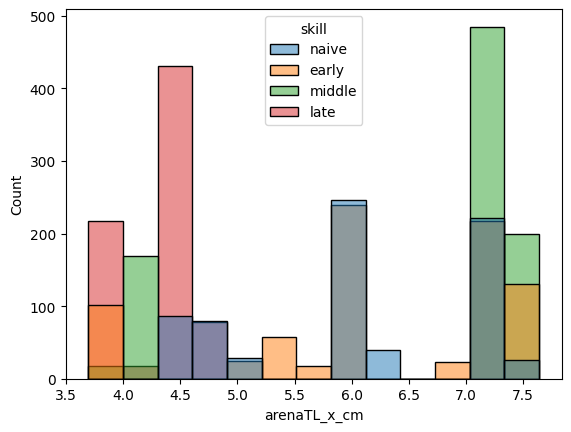

In [34]:
sns.histplot(data =data,x ='arenaTL_x_cm' ,hue= 'skill')

<AxesSubplot: xlabel='arenaTL_y_cm', ylabel='Count'>

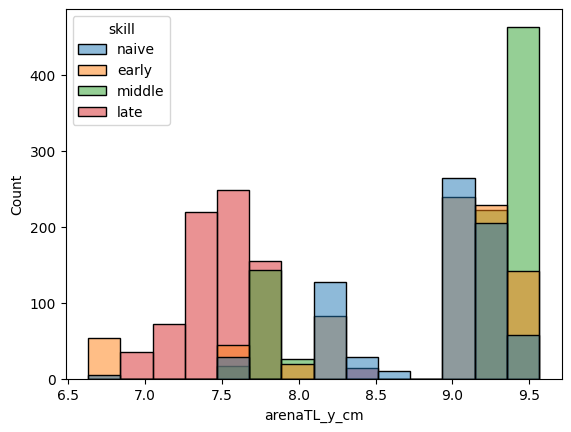

In [32]:
sns.histplot(data =data,x ='arenaTL_y_cm' ,hue= 'skill')

In [28]:
data.groupby[('skill')]['arenaTL_x_cm']

TypeError: 'method' object is not subscriptable

In [30]:
data.groupby(['skill'])[['arenaTL_x_cm',
    'arenaTR_x_cm','arenaBR_x_cm',
    'arenaBL_x_cm',
    'arenaTL_x_cm']].unique()

AttributeError: 'DataFrameGroupBy' object has no attribute 'unique'

In [24]:
print(pd.unique(data[['arenaTL_x_cm',
    'arenaTR_x_cm','arenaBR_x_cm',
    'arenaBL_x_cm',
    'arenaTL_x_cm']]))

ValueError: could not broadcast input array from shape (3464,5) into shape (3464,)

In [346]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
0,18,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,NaN,NaN,1.599672,0.625128,-4.875132,1.848786,1.054086,0.948689,-59.433783,34.204927
1,29,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,NaN,NaN,1.018079,0.982242,-63.790150,37.837011,1.016752,0.983524,-63.922911,37.965265
2,40,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,-78.624265,41.503922,1.032414,0.968604,-79.211426,42.051677,1.036111,0.965148,-78.841764,41.706100
3,42,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,NaN,NaN,1.063013,0.940722,-1.312910,1.147695,1.146501,0.872219,7.035882,-5.702619
4,55,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,NaN,NaN,1.582075,0.632081,2.975108,-1.211416,1.059907,0.943479,-49.241650,29.928321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3459,3329,104.0,56379.593830,56381.863283,"[56379.602316, 56379.618956, 56379.635532, 563...","[20281, 20282, 20283, 20284, 20285, 20286, 202...","[89.63011169433594, 89.10157012939453, 89.6400...","[261.7398681640625, 261.56158447265625, 260.80...","[103.79507446289062, 102.26407623291016, 101.1...","[256.8754577636719, 257.3447265625, 256.452667...",...,NaN,NaN,1.013291,0.986884,-2.005440,1.915271,1.001227,0.998775,-3.211820,3.104369
3460,3357,136.0,56477.680960,56480.421286,"[56477.686118, 56477.703129, 56477.720486, 564...","[26164, 26165, 26166, 26167, 26168, 26169, 261...","[90.63539123535156, 90.03893280029297, 89.9907...","[258.1434020996094, 258.5754089355469, 258.836...","[105.1650619506836, 104.66145324707031, 104.58...","[254.54054260253906, 254.675537109375, 254.388...",...,NaN,NaN,1.007080,0.992970,-1.398796,1.360304,1.001229,0.998772,-1.983830,1.940513
3461,3369,150.0,56526.595417,56529.200768,"[56526.603148, 56526.61984, 56526.636633, 5652...","[29098, 29099, 29100, 29101, 29102, 29103, 291...","[90.00463104248047, 89.25779724121094, 89.2131...","[260.19158935546875, 260.1805114746094, 260.24...","[106.48261260986328, 105.2131576538086, 104.83...","[254.4982452392578, 254.9815216064453, 254.789...",...,NaN,NaN,1.009816,0.990280,-0.761281,0.740967,1.001315,0.998686,-1.611292,1.581610
3462,3377,160.0,56557.064166,56559.95

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

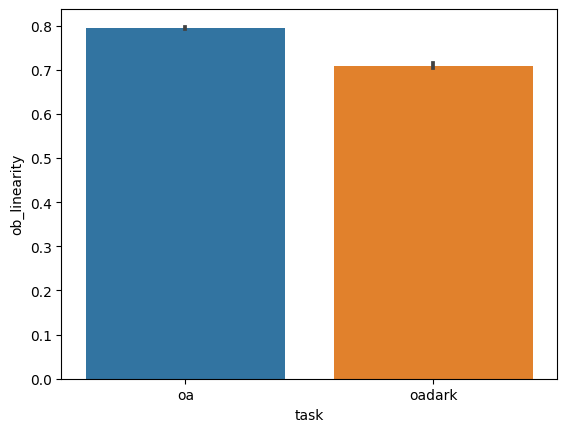

In [200]:

sns.barplot(data=data ,x='task',y='ob_linearity',estimator='median',errorbar = 'se')

In [302]:
ob_lin_df_all = data.melt(id_vars=['task','ob_linearity_20','ob_linearity_15','ob_linearity_10','ob_linearity_5']).drop(columns=['variable','value'])

ob_lin_df_20 = ob_lin_df_all[['task','ob_linearity_20']]
ob_lin_df_20['type'] = 'ob_linearity_20'
ob_lin_df_20['value']=  ob_lin_df_20['ob_linearity_20']
ob_lin_df_20 = ob_lin_df_20.drop(columns=['ob_linearity_20'])

ob_lin_df_15 = ob_lin_df_all[['task','ob_linearity_15']]
ob_lin_df_15['type'] = 'ob_linearity_15'
ob_lin_df_15['value']=  ob_lin_df_15['ob_linearity_15']
ob_lin_df_15 = ob_lin_df_15.drop(columns=['ob_linearity_15'])

ob_lin_df_10 = ob_lin_df_all[['task','ob_linearity_10']]
ob_lin_df_10['type'] = 'ob_linearity_10'
ob_lin_df_10['value']=  ob_lin_df_10['ob_linearity_10']
ob_lin_df_10 = ob_lin_df_10.drop(columns=['ob_linearity_10'])

#ob_lin_df_5 = ob_lin_df_all[['task','ob_linearity_5']]
#b_lin_df_5['type'] = 'ob_linearity_5'
#b_lin_df_5['value']=  ob_lin_df_5['ob_linearity_5']
#b_lin_df_5 = ob_lin_df_5.drop(columns=['ob_linearity_5'])

ob_lin_df = pd.concat([ob_lin_df_20,ob_lin_df_15,ob_lin_df_10])
ob_lin_df = ob_lin_df[ob_lin_df['value'].notna()]

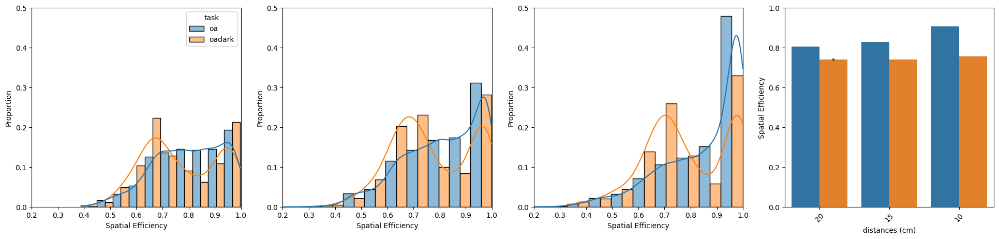

In [303]:
fig,ax = plt.subplots(1,4,figsize = (24,5),sharey=False)
for subplot in ax.reshape(-1):
    subplot.set_xlim([.2,1])
    subplot.set_ylim([0,.5])
    subplot.set(xlabel = 'Spatial Efficiency')
sns.histplot(data=data,x='ob_linearity_20',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,ax=ax[0],bins = 10)
sns.histplot(data=data,x='ob_linearity_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,ax=ax[1],legend=False,bins = 10)
sns.histplot(data=data,x='ob_linearity_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,ax=ax[2],legend=False,bins = 10)

sns.barplot(data=ob_lin_df ,x='type',y='value',hue = 'task',estimator='median',ax = ax[3],errorbar = 'se' )
#ax[3].set_ylim([0,90])
ax[3].set_xticks(ticks = [0,1,2], labels=['20','15','10'],rotation=45)
ax[3].set(ylabel = 'Spatial Efficiency',xlabel = 'distances (cm)')

ax[3].set_ylim([0,1])
ax[3].legend_.remove()



<AxesSubplot: xlabel='task', ylabel='edge_vector_ang_10_5'>

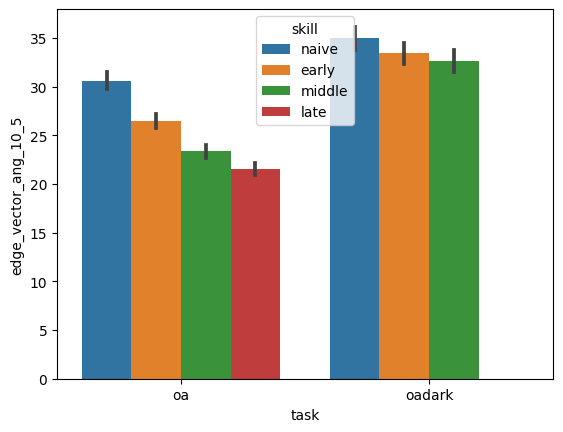

In [306]:
sns.barplot(data=data, x="task", y="edge_vector_ang_10_5", hue="skill",errorbar = 'se' )

<AxesSubplot: xlabel='task', ylabel='obstacle_vector_ang_10_5'>

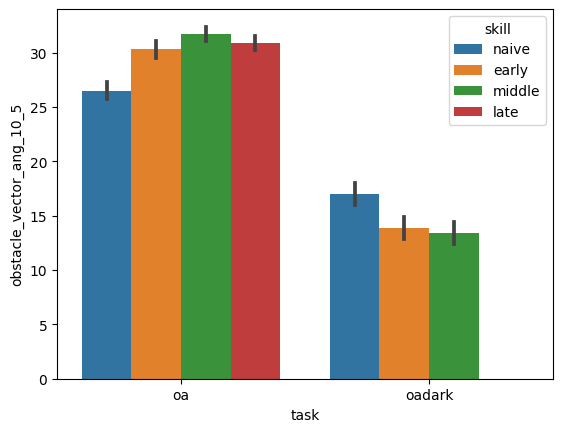

In [307]:

sns.barplot(data=data, x="task", y="obstacle_vector_ang_10_5", hue="skill",errorbar = 'se' )

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

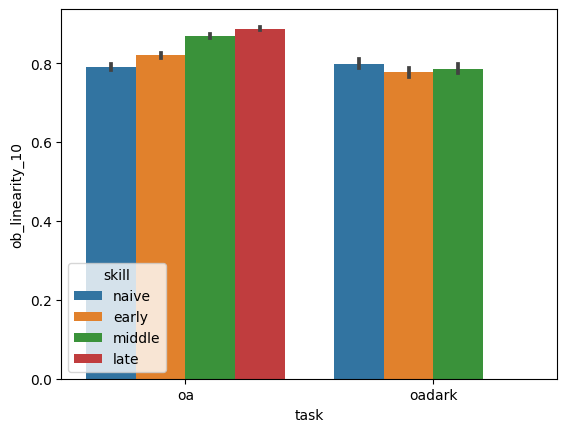

In [308]:
sns.barplot(data=data, x="task", y="ob_linearity_10", hue="skill",errorbar = 'se' )

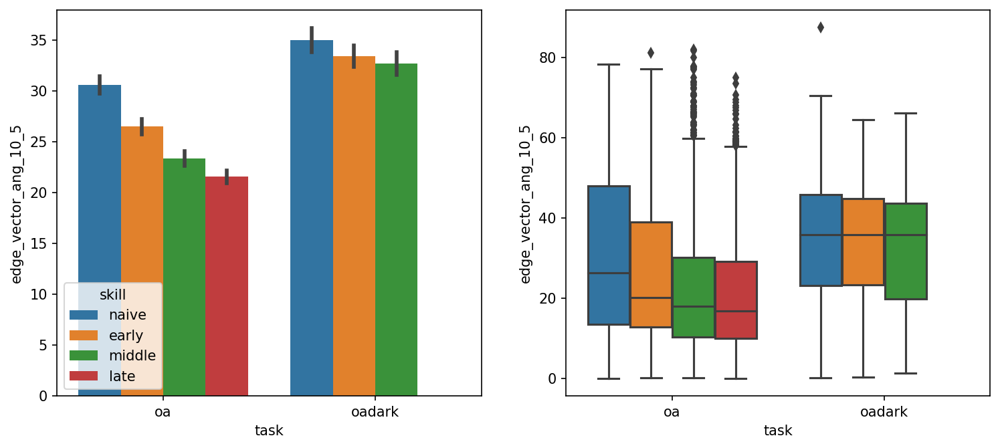

In [344]:
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=False,dpi = 150)
sns.barplot(data=data, x="task", y="edge_vector_ang_10_5", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="edge_vector_ang_10_5", hue="skill",ax = ax[1])
ax[1].legend_.remove()

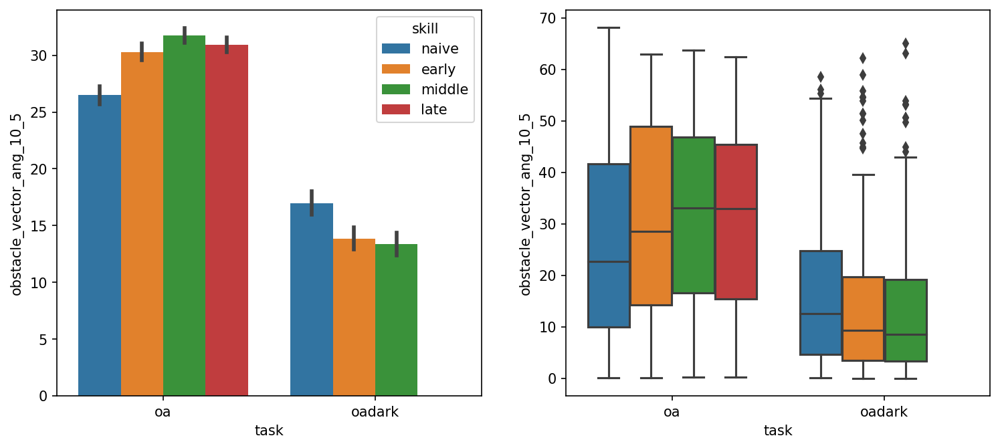

In [345]:
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=False,dpi = 150)
sns.barplot(data=data, x="task", y="obstacle_vector_ang_10_5", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="obstacle_vector_ang_10_5", hue="skill",ax = ax[1])
ax[1].legend_.remove()

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

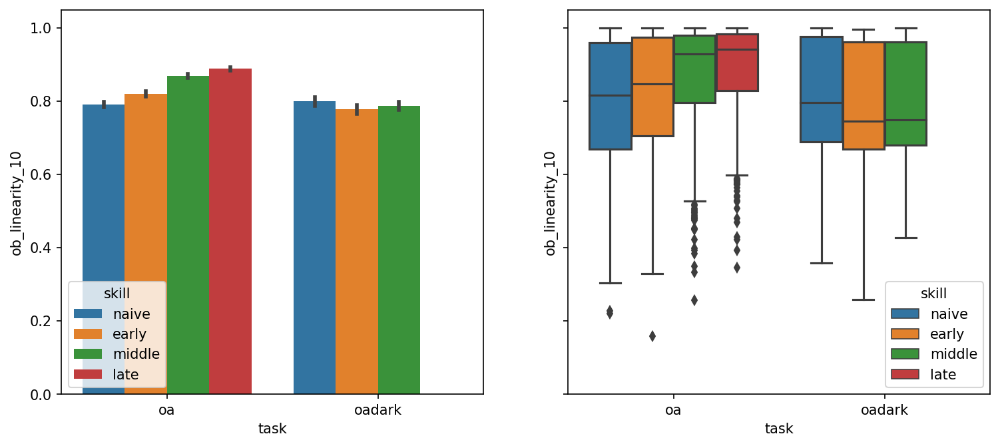

In [317]:
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=True,dpi = 150)
sns.barplot(data=data, x="task", y="ob_linearity_10", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="ob_linearity_10", hue="skill",ax = ax[1])
ax[1].legend_.remove()

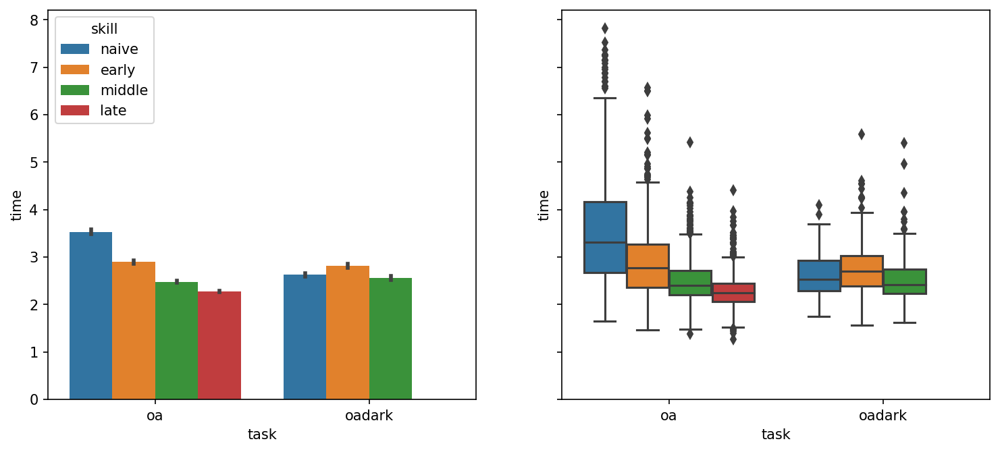

In [333]:
data = pd.concat([oa_long,dark_long])
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=True,dpi = 150)
sns.barplot(data=data, x="task", y="time", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="time", hue="skill",ax = ax[1])
ax[1].legend_.remove()

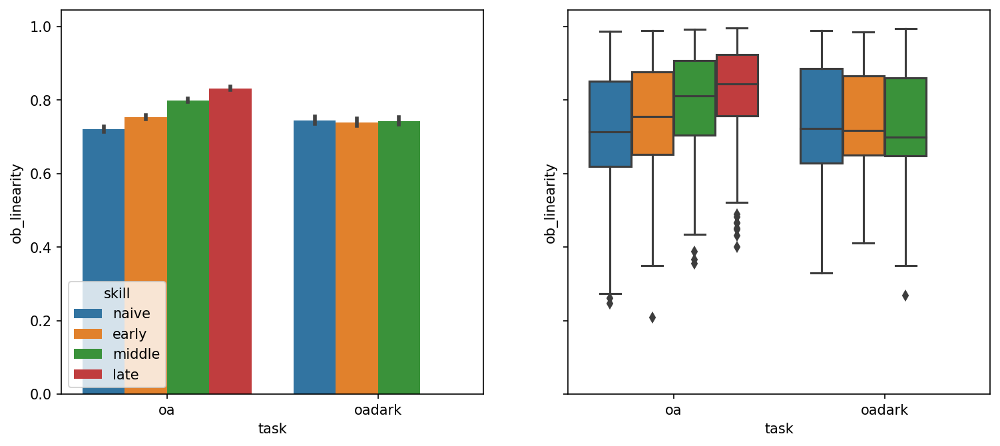

In [314]:
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=True,dpi = 150)
sns.barplot(data=data, x="task", y="ob_linearity", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="ob_linearity", hue="skill",ax = ax[1])
ax[1].legend_.remove()


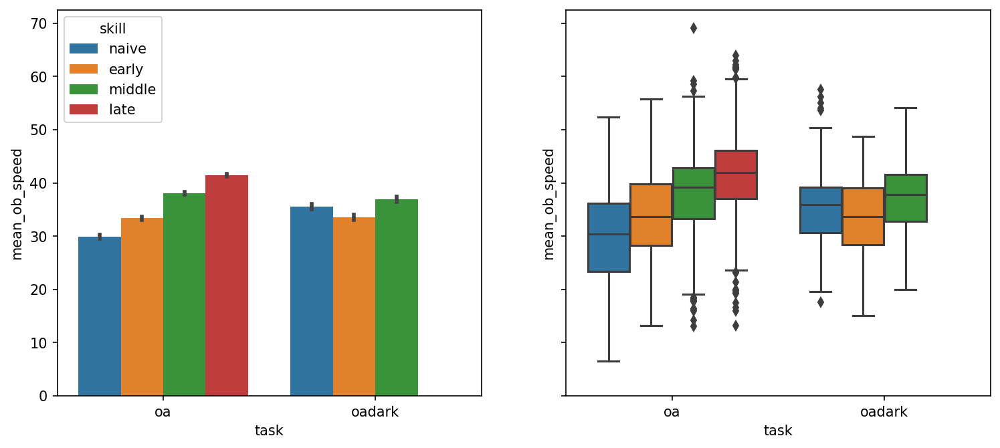

In [315]:

data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = np.nanmean(row.ts_speed[:int(row.obstacle_ind)])
    data.at[ind,'mean_ob_speed'] = ob_distance
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=True,dpi = 150)
sns.barplot(data=data, x="task", y="mean_ob_speed", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="mean_ob_speed", hue="skill",ax = ax[1])
ax[1].legend_.remove()


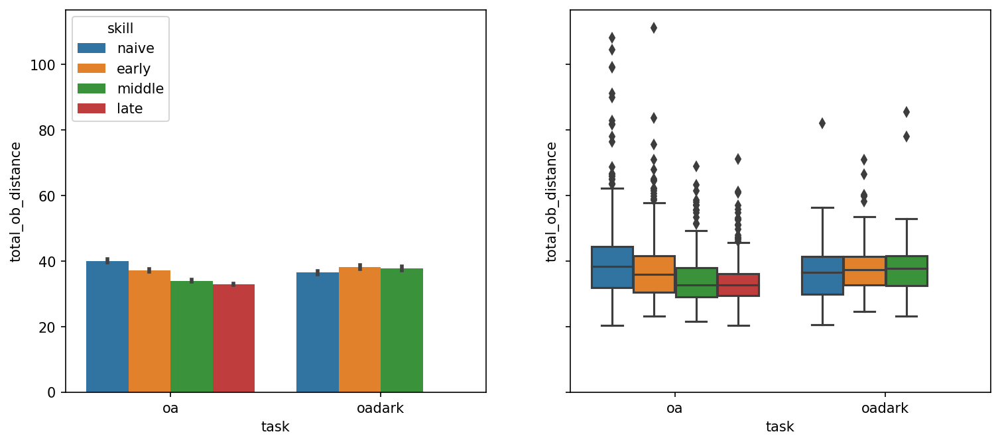

In [316]:

data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = sum(row.ts_distance[:int(row.obstacle_ind)])
    data.at[ind,'total_ob_distance'] = ob_distance
fig,ax = plt.subplots(1,2,figsize = (12,5),sharey=True,dpi = 150)
sns.barplot(data=data, x="task", y="total_ob_distance", hue="skill",errorbar = 'se' ,ax = ax[0])
sns.boxplot(data=data, x="task", y="total_ob_distance", hue="skill",ax = ax[1])
ax[1].legend_.remove()


Text(0.5, 0.98, 'Dark')

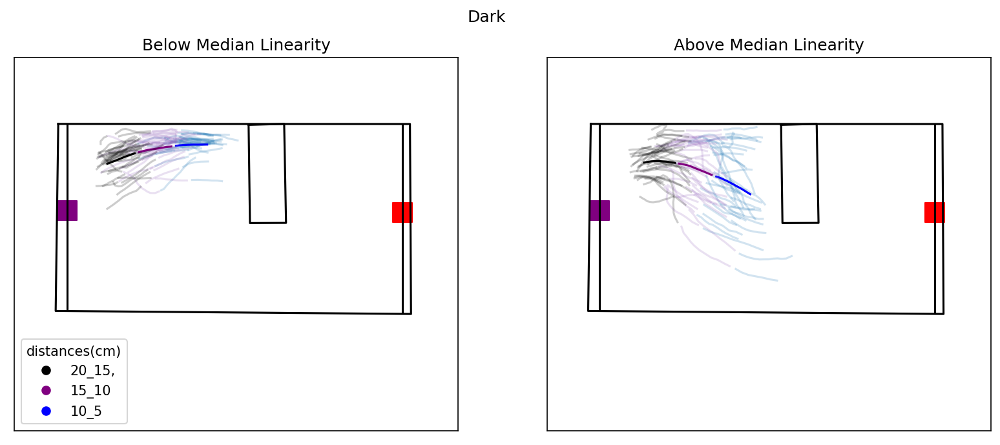

In [291]:
cluster = 1
all = data[ (data.obstacle_cluster == cluster)] 
lin_med = data[data.task=='oadark'].ob_linearity.median()

test = data[(data.task == 'oadark') & (data.ob_linearity < lin_med)& (data.obstacle_cluster == cluster)] 
trial = test.sample(40)
trial = drop_nans_in_columns(trial,'edge_vector_ang_20_15')
fig,ax = plt.subplots(1,2,figsize = (13,5),dpi=150)
plot_arena(all,ax[0],obstacle=True)
plot_arena(all,ax[1],obstacle=True)
trial_trajectories_x = []
trial_trajectories_y = []
ax[0].set_title('Below Median Linearity')
ax[1].set_title('Above Median Linearity')

for subplot in ax:
    subplot.set_xticks([])
    subplot.set_yticks([]) 

for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=10).min(),np.argwhere(row.ts_distance_from_edge<=5).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:blue',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'blue')
trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=15).min(),np.argwhere(row.ts_distance_from_edge<=10).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:purple',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'purple')

trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'black',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'black')


test = data[(data.task == 'oadark') & (data.ob_linearity > lin_med)& (data.obstacle_cluster == cluster)] 
trial = test
trial = drop_nans_in_columns(trial,'edge_vector_ang_20_15')

trial_trajectories_x = []
trial_trajectories_y = []

for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=10).min(),np.argwhere(row.ts_distance_from_edge<=5).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:blue',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'blue')
trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=15).min(),np.argwhere(row.ts_distance_from_edge<=10).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:purple',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'purple')

trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'black',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'black')



markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['black','purple','blue']]

ax[0].legend( markers,['20_15,','15_10','10_5'] ,numpoints=1,title = 'distances(cm)')

fig.suptitle('Dark')


Text(0.5, 0.98, 'Light')

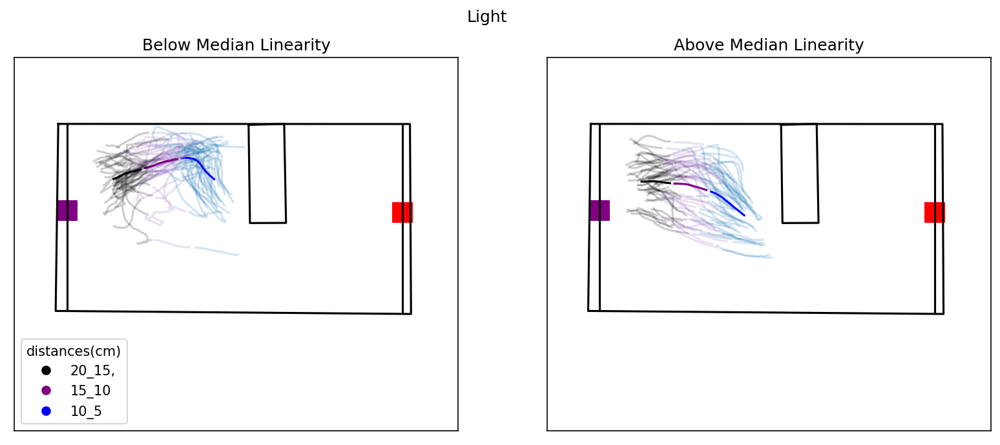

In [292]:
cluster = 1
all = data[ (data.obstacle_cluster == cluster)] 
lin_med = data[data.task=='oa'].ob_linearity.median()

test = data[(data.task == 'oa') & (data.ob_linearity < lin_med)& (data.obstacle_cluster == cluster)] 
trial = test.sample(50)
trial = drop_nans_in_columns(trial,'edge_vector_ang_20_15')
fig,ax = plt.subplots(1,2,figsize = (13,5),dpi=150)
plot_arena(all,ax[0],obstacle=True)
plot_arena(all,ax[1],obstacle=True)
trial_trajectories_x = []
trial_trajectories_y = []
ax[0].set_title('Below Median Linearity')
ax[1].set_title('Above Median Linearity')

for subplot in ax:
    subplot.set_xticks([])
    subplot.set_yticks([]) 

for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=10).min(),np.argwhere(row.ts_distance_from_edge<=5).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:blue',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'blue')
trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=15).min(),np.argwhere(row.ts_distance_from_edge<=10).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:purple',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'purple')

trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()
    if begining == end:
        continue
    else:
        ax[0].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'black',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[0].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'black')


test = data[(data.task == 'oa') & (data.ob_linearity > lin_med)& (data.obstacle_cluster == cluster)] 
trial = test.sample(50)
trial = drop_nans_in_columns(trial,'edge_vector_ang_20_15')

trial_trajectories_x = []
trial_trajectories_y = []

for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=10).min(),np.argwhere(row.ts_distance_from_edge<=5).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:blue',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'blue')
trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=15).min(),np.argwhere(row.ts_distance_from_edge<=10).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'tab:purple',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'purple')

trial_trajectories_x = []
trial_trajectories_y = []
for ind,row in trial.iterrows():
    begining,end = np.argwhere(row.ts_distance_from_edge<=20).min(),np.argwhere(row.ts_distance_from_edge<=15).min()
    if begining == end:
        continue
    else:
        ax[1].plot(row.obstacle_nose_x[begining:end],row.obstacle_nose_y[begining:end],c = 'black',alpha = .2)
        trial_trajectories_x.append(resample(row.obstacle_nose_x[begining:end],50))
        trial_trajectories_y.append(resample(row.obstacle_nose_y[begining:end],50))
trial_trajectories_x = np.stack(trial_trajectories_x)
trial_trajectories_y = np.stack(trial_trajectories_y)
ax[1].plot(np.nanmean(trial_trajectories_x,axis=0),np.nanmean(trial_trajectories_y,axis=0),c = 'black')



markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['black','purple','blue']]

ax[0].legend( markers,['20_15,','15_10','10_5'] ,numpoints=1,title = 'distances(cm)')
fig.suptitle('Light')


In [281]:
lin_med = data[data.task=='oa'].ob_linearity_10.median()
test = data[(data.task == 'oa') & (data.ob_linearity_10 > lin_med)] 
test.count()/len(data[(data.task == 'oa')])

level_0                           0.498786
index                             0.493236
first_poke                        0.498786
second_poke                       0.498786
trial_timestamps                  0.498786
                                    ...   
percent_change_ob_linearity_15    0.498439
ob_tortuosity_5                   0.457510
ob_linearity_5                    0.457510
percent_change_ob_tortuosity_5    0.457510
percent_change_ob_linearity_5     0.457510
Length: 264, dtype: float64

In [266]:
test = data[(data.task == 'oa') & (data.ob_linearity < lin_med)] 
test.count()/len(data[(data.task == 'oa')])

level_0                           0.498439
index                             0.493236
first_poke                        0.498439
second_poke                       0.498439
trial_timestamps                  0.498439
                                    ...   
percent_change_ob_linearity_15    0.497399
ob_tortuosity_5                   0.485605
ob_linearity_5                    0.485605
percent_change_ob_tortuosity_5    0.485605
percent_change_ob_linearity_5     0.485605
Length: 264, dtype: float64

In [272]:
lin_med = data[data.task=='oadark'].ob_linearity.median()
test = data[(data.task == 'oadark') & (data.ob_linearity > lin_med)] 
test.count()/len(data[(data.task == 'oadark')])

level_0                           0.499139
index                             0.499139
first_poke                        0.499139
second_poke                       0.499139
trial_timestamps                  0.499139
                                    ...   
percent_change_ob_linearity_15    0.497418
ob_tortuosity_5                   0.385542
ob_linearity_5                    0.385542
percent_change_ob_tortuosity_5    0.385542
percent_change_ob_linearity_5     0.385542
Length: 264, dtype: float64

In [264]:
test = data[(data.task == 'oadark') & (data.ob_linearity > lin_med)] 
test.count()/len(data[(data.task == 'oadark')])

level_0                           0.345955
index                             0.345955
first_poke                        0.345955
second_poke                       0.345955
trial_timestamps                  0.345955
                                    ...   
percent_change_ob_linearity_15    0.345955
ob_tortuosity_5                   0.258176
ob_linearity_5                    0.258176
percent_change_ob_tortuosity_5    0.258176
percent_change_ob_linearity_5     0.258176
Length: 264, dtype: float64

In [261]:
test = data[(data.task == 'oadark') & (data.ob_linearity > lin_med)] 
test.groupby(['consecutive']).count()/len(data[(data.task == 'oadark')])

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
consecutive,,,,,,,,,,,,,,,,,,,,,
1.0,0.163511,0.163511,0.163511,0.163511,0.163511,0.163511,0.163511,0.163511,0.163511,0.163511,...,0.094664,0.094664,0.163511,0.163511,0.163511,0.163511,0.117040,0.117040,0.117040,0.117040
2.0,0.182444,0.182444,0.182444,0.182444,0.182444,0.182444,0.182444,0.182444,0.182444,0.182444,...,0.111876,0.111876,0.182444,0.182444,0.182444,0.182444,0.141136,0.141136,0.141136,0.141136


In [254]:
test = data[(data.task == 'oadark') & (data.ob_linearity < lin_med)] 
test.groupby(['consecutive']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
consecutive,,,,,,,,,,,,,,,,,,,,,
1.0,233,233,233,233,233,233,233,233,233,233,...,112,112,233,233,233,233,211,211,211,211
2.0,147,147,147,147,147,147,147,147,147,147,...,86,86,146,146,146,146,133,133,133,133


In [247]:
test = data[(data.task == 'oadark') & (data.ob_linearity < lin_med)& (data.obstacle_cluster == 1)] 
test.groupby(['consecutive']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
consecutive,,,,,,,,,,,,,,,,,,,,,
1.0,49,49,49,49,49,49,49,49,49,49,...,26,26,49,49,49,49,46,46,46,46
2.0,32,32,32,32,32,32,32,32,32,32,...,24,24,32,32,32,32,32,32,32,32


([<matplotlib.axis.XTick at 0x1ea3d914160>,
 [Text(0, 0, '20'), Text(1, 0, '15'), Text(2, 0, '10'), Text(3, 0, '5')])

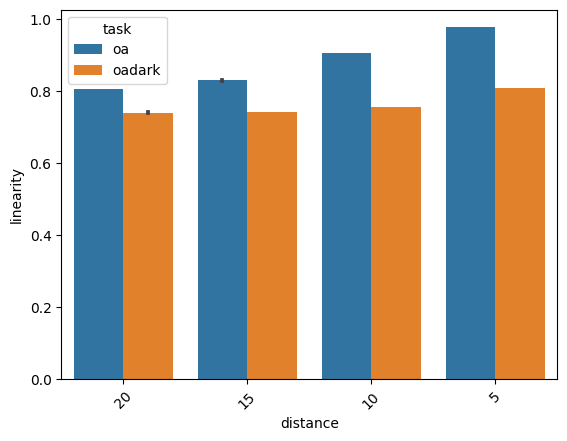

In [207]:

sns.barplot(data=ob_lin_df ,x='type',y='value',hue = 'task',estimator='median',errorbar = 'se')
plt.xticks(rotation=45)
plt.ylabel('linearity')
plt.xlabel('distance')
plt.xticks(ticks = [0,1,2,3], labels=['20','15','10','5'])

([<matplotlib.axis.XTick at 0x12393a2a880>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

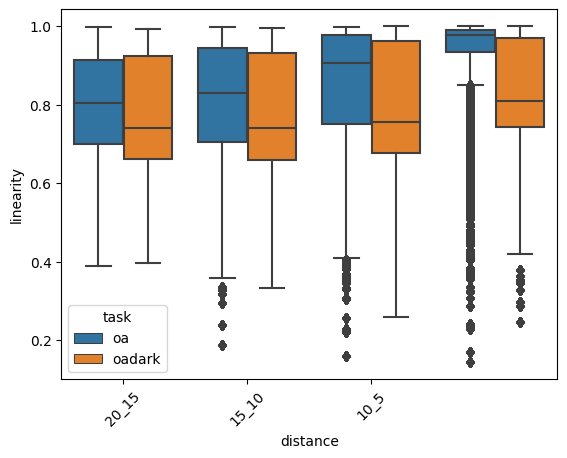

In [77]:

sns.boxplot(data=ob_lin_df ,x='type',y='value',hue = 'task')
plt.xticks(rotation=45)
plt.ylabel('linearity')
plt.xlabel('distance')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])

([<matplotlib.axis.XTick at 0x125d69c7100>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

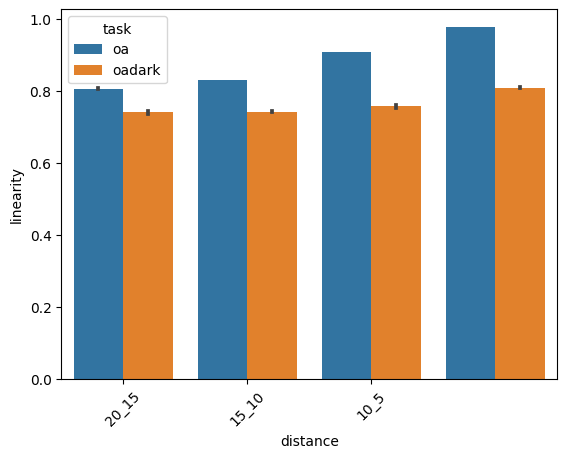

In [78]:

sns.barplot(data=ob_lin_df ,x='type',y='value',hue = 'task',estimator='median')
plt.xticks(rotation=45)
plt.ylabel('linearity')
plt.xlabel('distance')
plt.xticks(ticks = [0,1,2], labels=[' ','15_10','10_5'])

<AxesSubplot: xlabel='task', ylabel='obstacle_vector_ang_10_5'>

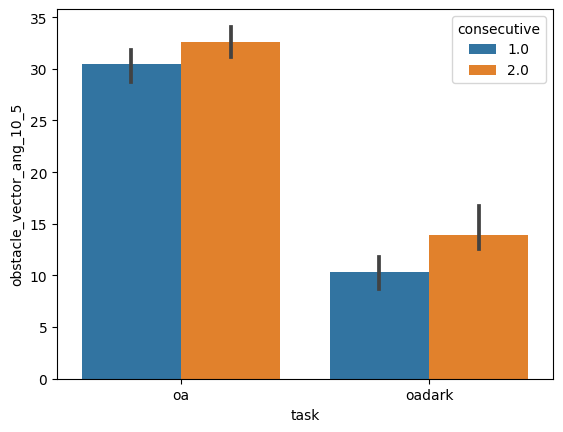

In [39]:

sns.barplot(data=data ,x='task',y='obstacle_vector_ang_10_5',estimator='median',hue='consecutive')

In [354]:
data.task

0       oa
1       oa
2       oa
3       oa
4       oa
        ..
3459    oa
3460    oa
3461    oa
3462    oa
3463    oa
Name: task, Length: 3464, dtype: object

In [353]:
data.gt_obstacleBR_x_cm

0       29.375844
1       29.653871
2       29.161694
3       29.089564
4       28.885600
          ...    
3459    34.962575
3460    35.099707
3461    35.905919
3462    34.623501
3463    34.381131
Name: gt_obstacleBR_x_cm, Length: 3464, dtype: float64

In [362]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,skill,ts_head_body_angle,mean_center_x,mean_center_y,distance_from_mean_center,ts_lateral_error_to_target_port,ob_tortuosity_10,ob_linearity_10,percent_change_ob_tortuosity_10,percent_change_ob_linearity_10
18,19,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,naive,"[157.03191035768336, 160.6752657827071, 155.26...",25.643248,15.862820,0.997439,"[7.053168420527934, 7.313772759461646, 7.51374...",1.166560,0.857221,-48.186364,25.058111
29,30,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,naive,"[100.49752401897445, 111.18866325786432, 132.7...",25.643248,15.862820,1.033280,"[5.418002339556118, 5.666461405809718, 5.77270...",1.008053,0.992011,-64.792768,38.813956
40,41,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,naive,"[133.78762360590784, 131.58603159981288, 136.6...",25.643248,15.862820,0.496675,"[0.6689760986460023, 0.6631478828115931, 0.663...",1.032358,0.968656,-79.217029,42.056934
42,43,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,naive,"[154.00533502169654, 152.60534413942756, 155.6...",25.643248,15.862820,0.474120,"[6.982522017137882, 7.137387559696453, 7.30714...",1.086644,0.920264,1.050195,-0.898076
55,56,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,naive,"[146.88197706409758, 152.67478768193592, 154.4...",25.643248,15.862820,0.487887,"[7.168966925752924, 7.251540813091665, 7.29835...",1.618867,0.617716,6.654267,-2.647932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3434,42,50.0,57150.526950,57152.837286,"[57150.528294, 57150.54446, 57150.561203, 5715...","[[10210, 10211, 10212, 10213, 10214, 10215, 10...","[673.3612670898438, 673.8580932617188, 673.656...","[264.01666259765625, 264.2102966308594, 263.90...","[661.3118896484375, 662.4511108398438, 663.108...","[253.42176818847656, 253.42535400390625, 253.2...",...,late,"[147.17987011995896, 149.2549138779083, 153.74...",22.961090,14.840085,0.709287,"[7.304785437963135, 7.222490180457189, 7.01293...",1.170321,0.854466,-5.719619,3.981386
3445,54,64.0,57197.438374,57199.683200,"[57197.444185, 57197.46094, 57197.478336, 5719...","[[13024, 13025, 13026, 13027, 13028, 13029, 13...","[673.3800048828125, 674.2169799804688, 674.595...","[263.21209716796875, 262.29937744140625, 261.8...","[662.841796875, 664.31396484375, 665.293640136...","[251.55636596679688, 250.9287872314453, 250.30...",...,late,"[158.6985685516897, 155.651387084128, 158.7678...",22.

<AxesSubplot: xlabel='gt_obstacleBR_y_cm', ylabel='Count'>

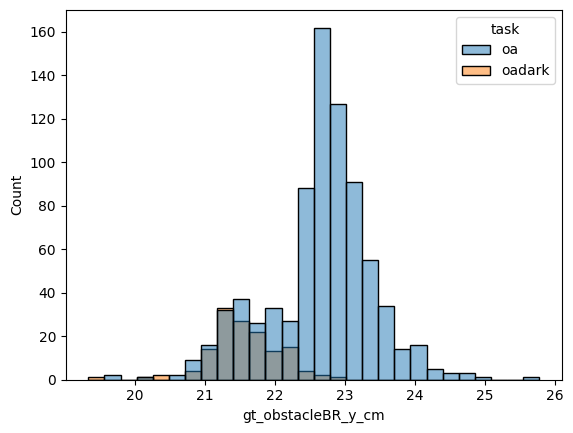

In [365]:
data = pd.concat([oa_long[oa_long.obstacle_cluster == 0],dark_long[dark_long.obstacle_cluster == 0]])
data = data.drop(columns = ['level_0'])
data = data.reset_index()
sns.histplot(data =data , x = 'gt_obstacleBR_y_cm',hue= 'task')

<AxesSubplot: xlabel='rightportB_y_cm', ylabel='Count'>

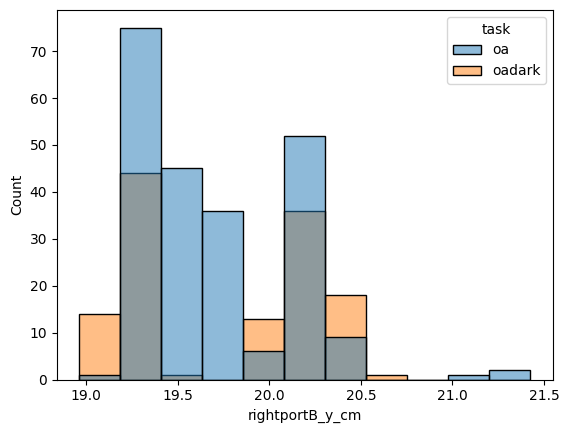

In [369]:
data = pd.concat([oa_long[oa_long.obstacle_cluster == 0],dark_long[dark_long.obstacle_cluster == 0]])
data = data.drop(columns = ['level_0'])
data = data.reset_index()
sns.histplot(data =data , x = 'rightportB_y_cm',hue= 'task')

<AxesSubplot: xlabel='arenaBR_x_cm', ylabel='Count'>

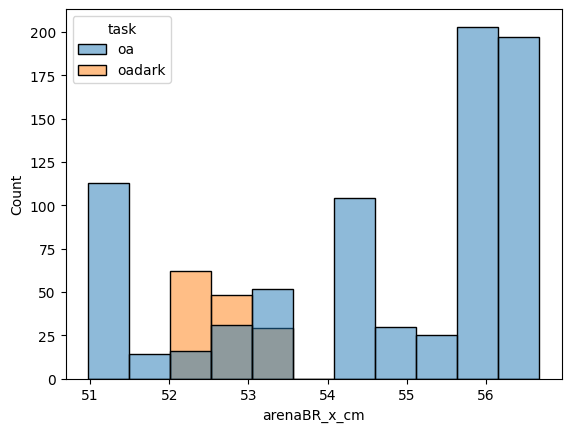

In [371]:
data = pd.concat([oa_long[oa_long.obstacle_cluster == 0],dark_long[dark_long.obstacle_cluster == 0]])
data = data.drop(columns = ['level_0'])
data = data.reset_index()
sns.histplot(data =data , x = 'arenaBR_x_cm',hue= 'task')

<AxesSubplot: xlabel='rightportT_y_cm', ylabel='Count'>

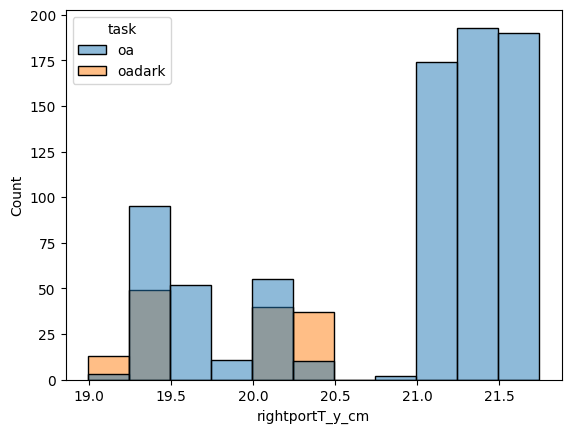

In [372]:
data = pd.concat([oa_long[oa_long.obstacle_cluster == 0],dark_long[dark_long.obstacle_cluster == 0]])
data = data.drop(columns = ['level_0'])
data = data.reset_index()
sns.histplot(data =data , x = 'rightportT_y_cm',hue= 'task')

<AxesSubplot: xlabel='task', ylabel='edge_vector_ang_10_5'>

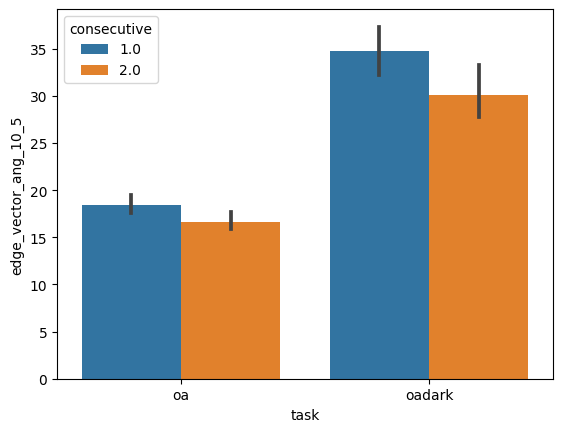

In [38]:

sns.barplot(data=data ,x='task',y='edge_vector_ang_10_5',estimator='median',hue='consecutive')

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

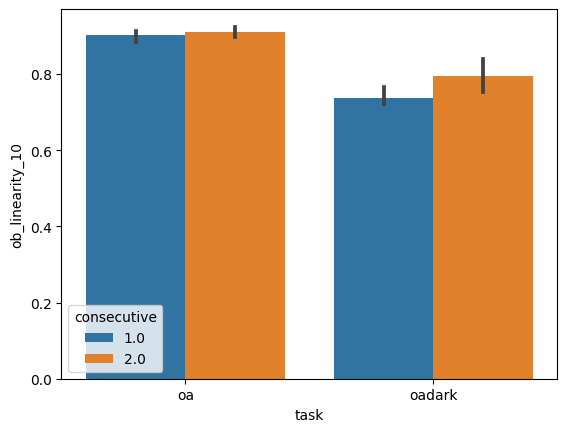

In [79]:

sns.barplot(data=data ,x='task',y='ob_linearity_10',estimator='median',hue='consecutive')

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

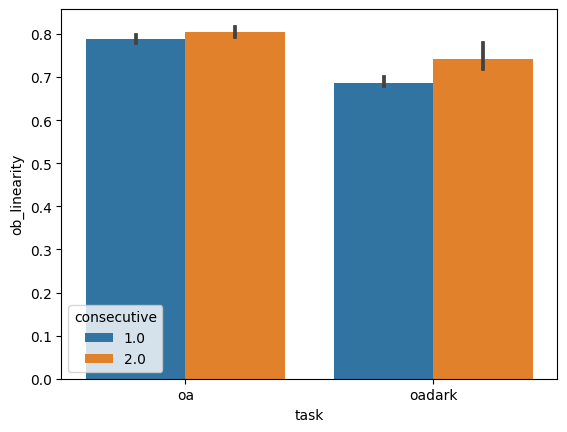

In [33]:

sns.barplot(data=data ,x='task',y='ob_linearity',estimator='median',hue='consecutive')

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

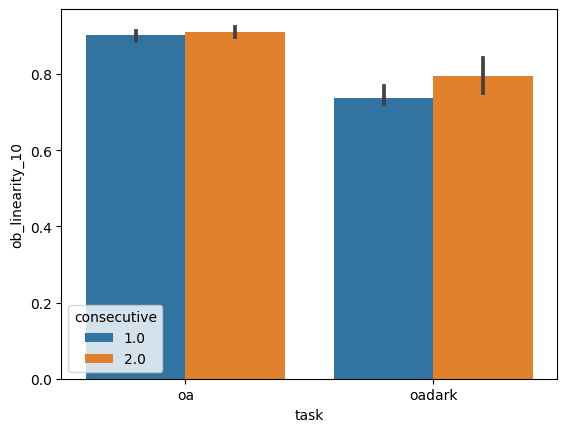

In [16]:

sns.barplot(data=data ,x='task',y='ob_linearity_10',estimator='median',hue='consecutive')

In [ ]:

sns.barplot(data=data ,x='task',y='ob_linearity_10',estimator='median',hue='consecutive')

In [34]:
data.groupby(['task']).ob_linearity_10.median()

task
oa        0.906380
oadark    0.756096
Name: ob_linearity_10, dtype: float64

data.groupby(['task']).ob_linearity_10.median()

In [27]:
data.task.unique()

array(['oa', 'oadark'], dtype=object)

In [32]:
data[(data.ob_linearity>=.7) & (data.task=='oadark') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
2755,104,128.0,65254.802496,65257.100441,"[65254.811904, 65254.82967, 65254.845337, 6525...","[[20890, 20891, 20892, 20893, 20894, 20895, 20...","[678.9105224609375, 679.2843627929688, 679.790...","[279.708984375, 279.2736511230469, 279.5119018...","[668.1917114257812, 668.8549194335938, 669.192...","[269.84759521484375, 269.7736511230469, 269.70...",...,NaN,NaN,1.313439,0.761360,-3.439816,1.943069,1.168236,0.855991,-17.960047,11.406159
2756,106,130.0,65259.591321,65261.852249,"[65259.597004, 65259.613811, 65259.630272, 652...","[[21177, 21178, 21179, 21180, 21181, 21182, 21...","[679.621826171875, 680.6426391601562, 680.6400...","[278.71343994140625, 280.1790771484375, 280.20...","[664.0305786132812, 666.2093505859375, 666.901...","[272.3042907714844, 272.97845458984375, 271.56...",...,NaN,NaN,1.008768,0.991308,-0.954701,0.929380,1.003082,0.996927,-1.523295,1.491300
2757,153,7.0,64370.529152,64373.101606,"[64370.529331, 64370.546214, 64370.562534, 643...","[[3375, 3376, 3377, 3378, 3379, 3380, 3381, 33...","[676.2831420898438, 676.4638671875, 677.122985...","[274.9940185546875, 276.37493896484375, 277.12...","[666.485107421875, 665.1891479492188, 666.6427...","[262.389404296875, 267.18701171875, 268.091949...",...,NaN,NaN,1.031067,0.969869,-0.403451,0.378025,NaN,NaN,NaN,NaN
2758,155,9.0,64375.776512,64378.172940,"[64375.781017, 64375.797696, 64375.814374, 643...","[[3690, 3691, 3692, 3693, 3694, 3695, 3696, 36...","[675.8781127929688, 676.2967529296875, 676.733...","[275.0614929199219, 275.76239013671875, 277.34...","[665.19287109375, 665.4569091796875, 666.26269...","[262.6256408691406, 266.82958984375, 268.40533...",...,NaN,NaN,1.028598,0.972197,-0.553594,0.520438,1.006913,0.993134,-2.722086,2.614164
2759,187,49.0,64484.485260,64486.828531,"[64484.486144, 64484.501964, 64484.518976, 644...","[[10210, 10211, 10212, 10213, 10214, 10215, 10...","[677.36962890625, 677.9742431640625, 678.46307...","[275.5122375488281, 275.1109619140625, 275.002...","[665.2806396484375, 666.5759887695312, 667.602...","[267.919677734375, 266.9582824707031, 266.6418...",...,0.034372,-0.030827,1.034743,0.966423,-2.102027,1.924150,1.001996,0.998008,-5.376786,5.082649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2874,2417,47.0,64955.564876,64957.805619,"[64955.579084, 64955.595123, 64955.611904, 649...","[[7290, 7291, 7292, 7293, 7294, 7295, 7296, 72...","[675.2340087890625, 676.0880126953125, 676.694...","[264.02093505859375, 264.3594665527344, 264.35...","[660.21435546875, 661.7744140625, 663.35015869...","[259.0963134765625, 258.5150451660156, 257.973...",...,0.174068,-0.150682,1.087526,0.919519,1.359284,-1.163841,1.001095,0.998906,-7.283805,6.774948
2875,2437,75.0,65018.206208,65020.471372,"[65018.21678, 65018.233587, 65018.250688, 6501...","[[11047, 11048, 11049, 11050, 11051, 11052, 11...","[675.6465454101562, 676.9046020507812, 677.612...","[264.4767150878906, 264.207275390625, 264.5780...","[663.08447265625, 664.8650512695312, 665.98101...","[257.4133605957031, 257.191650390625, 256.3525...",...,-3.014979,1.558502,1.349487,0.741022,-5.654601,2.980148,1.161780,0.860748,-24.425325,14.952752
2879,2499,165.0,65248.777139,65251.042304,"[65248.779648, 65248.796326, 65248.813952, 652...","[[24876, 24877, 24878, 24879, 24880, 24881, 24...","[676.8641357421875, 677.3535766601562, 677.554...","[265.45166015625, 264.89825439453125, 265.1371...","[665.2172241210938, 666.0318603515625, 666.419...","[254.73951721191406, 254.65127563476562, 254.5...",...,-2.022665,1.205765,1.237221,0.808263,-6.811384,4.217611,1.049812,0.952552,-25.552284,18.646470
2880,2501,167.0

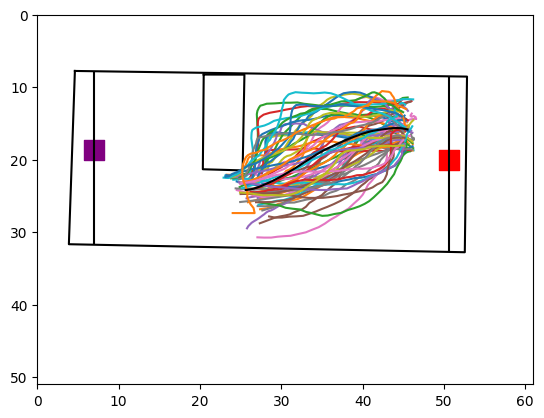

In [124]:
trial = data[(data.ob_linearity>=.75) & (data.task=='oadark') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)]
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

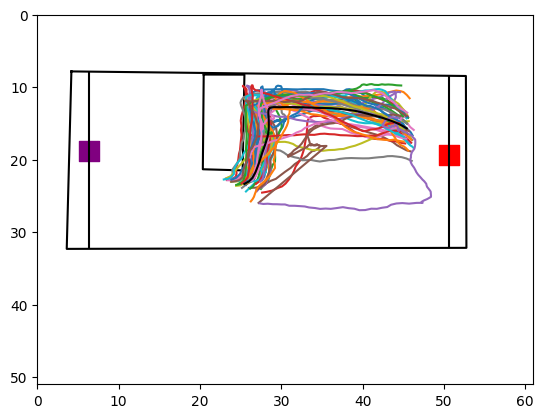

In [125]:
trial = data[(data.ob_linearity<=.75) & (data.task=='oadark') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)]
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

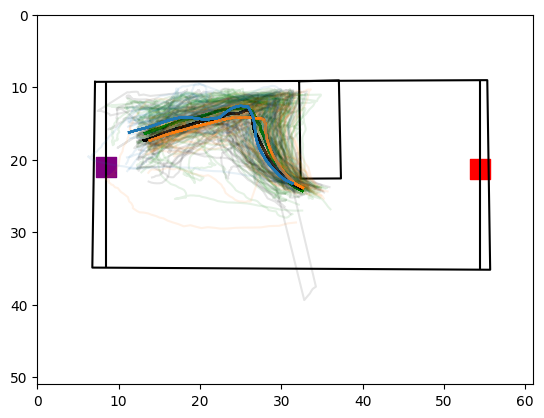

In [187]:
data = pd.concat([oa_long,dark_long])
trial = data[(data.ob_linearity<=.7) & (data.task=='oa') & (data.obstacle_cluster==1)]
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
for skill,skill_df in trial.groupby(['skill']):
    if skill == 'naive':
        naive_mean_x = get_mean_of_df(skill_df,'obstacle_nose_x',bins=50)
        naive_mean_y = get_mean_of_df(skill_df,'obstacle_nose_y',bins=50)
    elif skill == 'early':
        early_mean_x = get_mean_of_df(skill_df,'obstacle_nose_x',bins=50)
        early_mean_y = get_mean_of_df(skill_df,'obstacle_nose_y',bins=50)
    elif  skill == 'middle':
        middle_mean_x = get_mean_of_df(skill_df,'obstacle_nose_x',bins=50)
        middle_mean_y = get_mean_of_df(skill_df,'obstacle_nose_y',bins=50)
    elif skill == 'late':
        late_mean_x = get_mean_of_df(skill_df,'obstacle_nose_x',bins=50)
        late_mean_y = get_mean_of_df(skill_df,'obstacle_nose_y',bins=50)


for ind,row in trial.iterrows():
    if row.skill == 'late':
        ax.plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .1)
        ax.plot(late_mean_x,late_mean_y,c = 'tab:blue')
    elif row.skill == 'middle':
        ax.plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:orange',alpha = .1)
        ax.plot(middle_mean_x,middle_mean_y,c = 'tab:orange')
    elif row.skill == 'early':
        ax.plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'black',alpha = .1)
        ax.plot(early_mean_x,early_mean_y,c = 'black')
    elif row.skill == 'naive':
        ax.plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'green',alpha = .1)
        ax.plot(naive_mean_x,naive_mean_y,c = 'green')

In [14]:
data[(data.ob_linearity<=.7) & (data.task=='oadark')]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
2752,53,66.0,65097.199846,65099.960704,"[65097.207782, 65097.224345, 65097.240947, 650...","[[11437, 11438, 11439, 11440, 11441, 11442, 11...","[678.9861450195312, 679.6188354492188, 681.046...","[277.9176330566406, 279.289306640625, 280.8138...","[664.2655029296875, 665.99169921875, 666.56518...","[271.77880859375, 270.9521179199219, 271.41848...",...,NaN,NaN,1.244762,0.803367,-20.556784,11.386815,1.020634,0.979783,-42.969557,29.028470
2754,102,126.0,65250.034355,65252.934464,"[65250.043571, 65250.060441, 65250.078195, 652...","[[20604, 20605, 20606, 20607, 20608, 20609, 20...","[675.2449340820312, 677.4585571289062, 677.907...","[274.2185363769531, 276.8466491699219, 277.667...","[659.5665893554688, 662.8560791015625, 663.970...","[272.2059631347656, 271.63519287109375, 271.34...",...,NaN,NaN,1.519270,0.658211,-18.841040,7.262117,1.402511,0.713007,-30.517003,12.741751
2766,281,25.0,65623.387264,65626.811865,"[65623.389862, 65623.406617, 65623.423347, 656...","[[5903, 5904, 5905, 5906, 5907, 5908, 5909, 59...","[679.2344360351562, 679.6560668945312, 679.499...","[279.1588134765625, 278.88214111328125, 278.80...","[667.80322265625, 668.990966796875, 669.099853...","[269.3964538574219, 269.03863525390625, 269.04...",...,NaN,NaN,1.433828,0.697434,-12.921641,5.765663,1.359027,0.735821,-20.401756,9.604354
2772,434,73.0,66313.178534,66315.509414,"[66313.189478, 66313.206464, 66313.223884, 663...","[[11992, 11993, 11994, 11995, 11996, 11997, 11...","[680.1268920898438, 680.0867919921875, 679.803...","[272.00421142578125, 271.8930969238281, 271.69...","[666.0840454101562, 666.3616943359375, 666.432...","[266.8224792480469, 266.63433837890625, 266.42...",...,-1.593396,0.684180,1.387489,0.720726,-14.657649,6.886375,1.174205,0.851640,-35.986084,19.977754
2773,436,75.0,66317.320064,66319.552524,"[66317.324428, 66317.342156, 66317.357747, 663...","[[12240, 12241, 12242, 12243, 12244, 12245, 12...","[680.4310302734375, 680.95361328125, 681.71643...","[274.58392333984375, 274.3250427246094, 273.90...","[666.2256469726562, 667.8980712890625, 669.223...","[269.5686950683594, 267.5016174316406, 266.878...",...,-0.734479,0.315727,1.483352,0.674149,-4.554994,2.008465,1.155716,0.865264,-37.318499,21.119974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3428,2773,47.0,58252.162956,58253.875366,"[58252.172774, 58252.189952, 58252.20622, 5825...","[8739, 8740, 8741, 8742, 8743, 8744, 8745, 874...","[85.4266128540039, 87.34008026123047, 86.89811...","[261.7656555175781, 262.88958740234375, 265.59...","[91.96292877197266, 94.74280548095703, 98.2351...","[257.6587829589844, 256.87139892578125, 260.09...",...,NaN,NaN,1.390623,0.719102,-10.608156,5.096761,1.161149,0.861216,-33.555539,19.308121
3429,2783,59.0,58284.241510,58286.769433,"[58284.250803, 58284.267686, 58284.284518, 582...","[10663, 10664, 10665, 10666, 10667, 10668, 106...","[87.75959014892578, 86.99541473388672, 86.5253...","[260.9606018066406, 261.192138671875, 260.8676...","[101.29974365234375, 99.75284576416016, 98.431...","[256.0437316894531, 256.8573913574219, 257.122...",...,NaN,NaN,1.484657,0.673556,-3.171170,1.408604,1.265592,0.790144,-25.077651,13.067381
3430,2786,65.0,58310.359923,58312.854592,"[58310.360256, 58310.376601, 58310.39406, 5831...","[12229, 12230, 12231, 12232, 12233, 12234, 122...","[86.841064453125, 86.9388427734375, 86.4898529...","[257.9836730957031, 258.0146179199219, 257.881...","[104.91130065917969, 103.79759979248047, 102.6...","[253.5960235595703, 253.80740356445312, 254.47...",...,NaN,NaN,1.620359,0.617147,0.843753,-0.323043,1.412750,0.707839,-19.917165,8.746175
343

In [ ]:
data.groupby(['skill']).count()

In [16]:
data[(data.ob_linearity<=.7) ].groupby(['task']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
task,,,,,,,,,,,,,,,,,,,,,
oa,813,806,813,813,813,813,813,813,813,813,...,337,337,812,812,812,812,781,781,781,781
oadark,279,279,279,279,279,279,279,279,279,279,...,146,146,279,279,279,279,260,260,260,260


In [18]:
data[(data.ob_linearity>=.7) ].groupby(['task']).count()/data.groupby(['task']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
task,,,,,,,,,,,,,,,,,,,,,
oa,0.715227,0.716444,0.715227,0.715227,0.715227,0.715227,0.715227,0.715227,0.715227,0.715227,...,0.710978,0.710978,0.716324,0.716324,0.716324,0.716324,0.713660,0.713660,0.713920,0.713920
oadark,0.519793,0.519793,0.519793,0.519793,0.519793,0.519793,0.519793,0.519793,0.519793,0.519793,...,0.540881,0.540881,0.518966,0.518966,0.518966,0.518966,0.473684,0.473684,0.473684,0.473684


In [17]:
data[(data.ob_linearity<=.7) ].groupby(['task']).count()/data.groupby(['task']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
task,,,,,,,,,,,,,,,,,,,,,
oa,0.281998,0.283204,0.281998,0.281998,0.281998,0.281998,0.281998,0.281998,0.281998,0.281998,...,0.289022,0.289022,0.282631,0.282631,0.282631,0.282631,0.285245,0.285245,0.285349,0.285349
oadark,0.480207,0.480207,0.480207,0.480207,0.480207,0.480207,0.480207,0.480207,0.480207,0.480207,...,0.459119,0.459119,0.481034,0.481034,0.481034,0.481034,0.526316,0.526316,0.526316,0.526316


In [165]:
data.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,go_linearity,ts_head_body_angle,mean_center_x,mean_center_y,distance_from_mean_center,ts_lateral_error_to_target_port,ob_tortuosity_10,ob_linearity_10,percent_change_ob_tortuosity_10,percent_change_ob_linearity_10
skill,,,,,,,,,,,,,,,,,,,,,
early,811,811,811,811,811,811,811,811,811,811,...,811,811,811,811,811,811,811,811,811,811
late,743,743,743,743,743,743,743,743,743,743,...,742,743,743,743,743,743,742,742,742,742
middle,871,871,871,871,871,871,871,871,871,871,...,871,871,871,871,871,871,870,870,870,870
naive,726,689,726,726,726,726,726,726,726,726,...,704,726,726,726,726,726,715,715,715,715


In [11]:
data[(data.ob_linearity>=.7) & (data.task=='oa')].groupby(['skill']).count()/data.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
skill,,,,,,,,,,,,,,,,,,,,,
early,0.483354,0.483354,0.483354,0.483354,0.483354,0.483354,0.483354,0.483354,0.483354,0.483354,...,0.430693,0.430693,0.484549,0.484549,0.484549,0.484549,0.491391,0.491391,0.491391,0.491391
late,0.853297,0.853297,0.853297,0.853297,0.853297,0.853297,0.853297,0.853297,0.853297,0.853297,...,0.887324,0.887324,0.854054,0.854054,0.854054,0.854054,0.850350,0.850350,0.850350,0.850350
middle,0.599311,0.599311,0.599311,0.599311,0.599311,0.599311,0.599311,0.599311,0.599311,0.599311,...,0.471125,0.471125,0.598851,0.598851,0.598851,0.598851,0.597786,0.597786,0.597786,0.597786
naive,0.384298,0.371553,0.384298,0.384298,0.384298,0.384298,0.384298,0.384298,0.384298,0.384298,...,0.426513,0.426513,0.385576,0.385576,0.385576,0.385576,0.399376,0.399376,0.400000,0.400000


In [12]:
data[(data.ob_linearity<=.7) & (data.task=='oa')].groupby(['skill']).count()/data.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
skill,,,,,,,,,,,,,,,,,,,,,
early,0.268804,0.268804,0.268804,0.268804,0.268804,0.268804,0.268804,0.268804,0.268804,0.268804,...,0.264851,0.264851,0.268232,0.268232,0.268232,0.268232,0.276821,0.276821,0.276821,0.276821
late,0.145357,0.145357,0.145357,0.145357,0.145357,0.145357,0.145357,0.145357,0.145357,0.145357,...,0.112676,0.112676,0.145946,0.145946,0.145946,0.145946,0.149650,0.149650,0.149650,0.149650
middle,0.187141,0.187141,0.187141,0.187141,0.187141,0.187141,0.187141,0.187141,0.187141,0.187141,...,0.158055,0.158055,0.187356,0.187356,0.187356,0.187356,0.194342,0.194342,0.194342,0.194342
naive,0.338843,0.346880,0.338843,0.338843,0.338843,0.338843,0.338843,0.338843,0.338843,0.338843,...,0.363112,0.363112,0.341193,0.341193,0.341193,0.341193,0.361934,0.361934,0.362500,0.362500


In [167]:
data[(data.ob_linearity>=.7) & (data.task=='oadark')].groupby(['skill']).count()/data.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,go_linearity,ts_head_body_angle,mean_center_x,mean_center_y,distance_from_mean_center,ts_lateral_error_to_target_port,ob_tortuosity_10,ob_linearity_10,percent_change_ob_tortuosity_10,percent_change_ob_linearity_10
skill,,,,,,,,,,,,,,,,,,,,,
early,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,...,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470,0.129470
late,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
middle,0.105626,0.105626,0.105626,0.105626,0.105626,0.105626,0.105626,0.105626,0.105626,0.105626,...,0.105626,0.105626,0.105626,0.105626,0.105626,0.105626,0.105747,0.105747,0.105747,0.105747
naive,0.144628,0.152395,0.144628,0.144628,0.144628,0.144628,0.144628,0.144628,0.144628,0.144628,...,0.149148,0.144628,0.144628,0.144628,0.144628,0.144628,0.144056,0.144056,0.144056,0.144056


In [166]:
data[(data.ob_linearity<=.7) & (data.task=='oadark')].groupby(['skill']).count()/data.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,go_linearity,ts_head_body_angle,mean_center_x,mean_center_y,distance_from_mean_center,ts_lateral_error_to_target_port,ob_tortuosity_10,ob_linearity_10,percent_change_ob_tortuosity_10,percent_change_ob_linearity_10
skill,,,,,,,,,,,,,,,,,,,,,
early,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,...,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372,0.118372
late,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
middle,0.107922,0.107922,0.107922,0.107922,0.107922,0.107922,0.107922,0.107922,0.107922,0.107922,...,0.107922,0.107922,0.107922,0.107922,0.107922,0.107922,0.108046,0.108046,0.108046,0.108046
naive,0.122590,0.129173,0.122590,0.122590,0.122590,0.122590,0.122590,0.122590,0.122590,0.122590,...,0.126420,0.122590,0.122590,0.122590,0.122590,0.122590,0.124476,0.124476,0.124476,0.124476


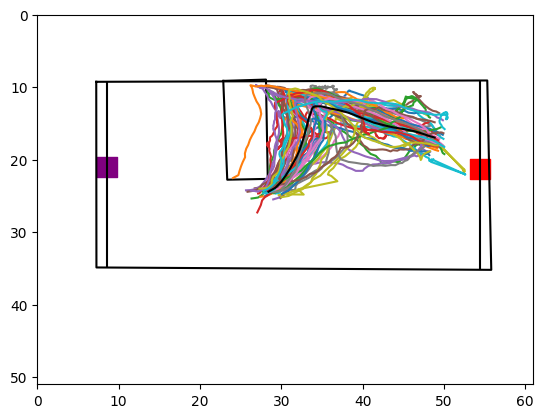

In [159]:
data = pd.concat([oa_long,dark_long])
trial = data[(data.ob_linearity<=.7) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

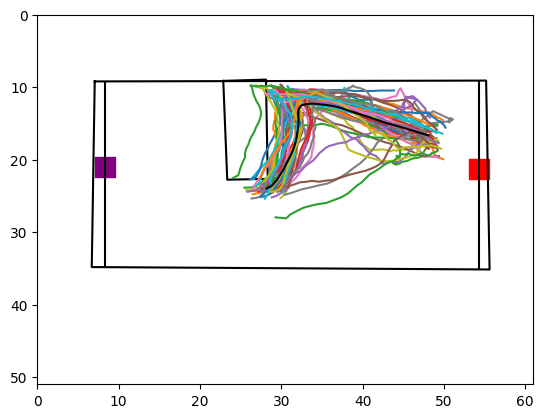

In [37]:
trial = data[(data.edge_vector_ang_10_5>=40) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

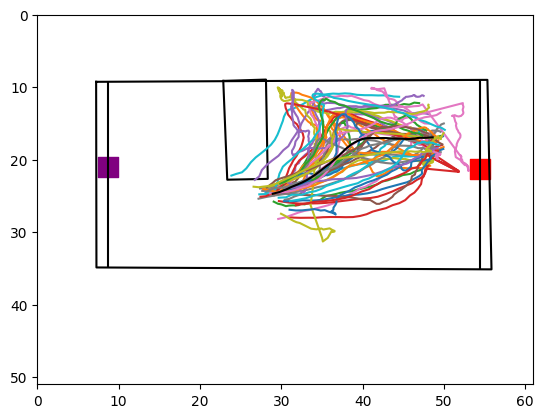

In [36]:
trial = data[(data.edge_vector_ang_10_5<=40) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

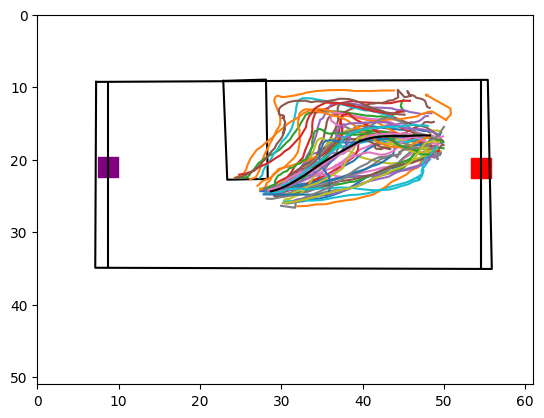

In [22]:
trial = data[(data.ob_linearity>=.7) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

In [236]:
data.groupby(['task']).ob_linearity_5.median()

task
oa        0.976659
oadark    0.808585
Name: ob_linearity_5, dtype: float64

In [235]:
data.groupby(['task']).ob_linearity.median()

task
oa        0.794739
oadark    0.708860
Name: ob_linearity, dtype: float64

In [238]:
data.groupby(['task']).ob_linearity_20.median()

task
oa        0.805279
oadark    0.740207
Name: ob_linearity_20, dtype: float64

In [234]:
data.groupby(['task']).ob_linearity_10.median()

task
oa        0.906380
oadark    0.756096
Name: ob_linearity_10, dtype: float64

<AxesSubplot: xlabel='task', ylabel='ob_linearity_15'>

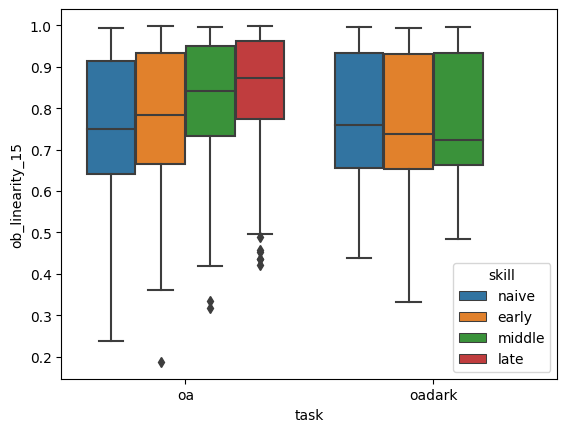

In [226]:

sns.boxplot(data=data ,x='task',y='ob_linearity_15',hue = 'skill')

([<matplotlib.axis.XTick at 0x25853934d30>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

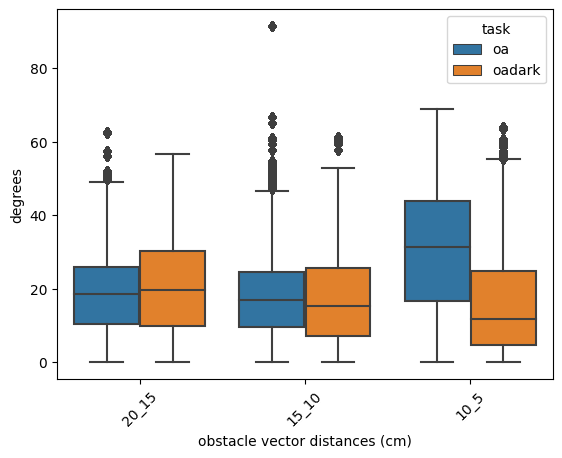

In [10]:

sns.boxplot(data=obstacle_vector_df ,x='type',y='value',hue = 'task')
plt.xticks(rotation=45)
plt.ylabel('degrees')
plt.xlabel('obstacle vector distances (cm)')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])


([<matplotlib.axis.XTick at 0x253ab0da070>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

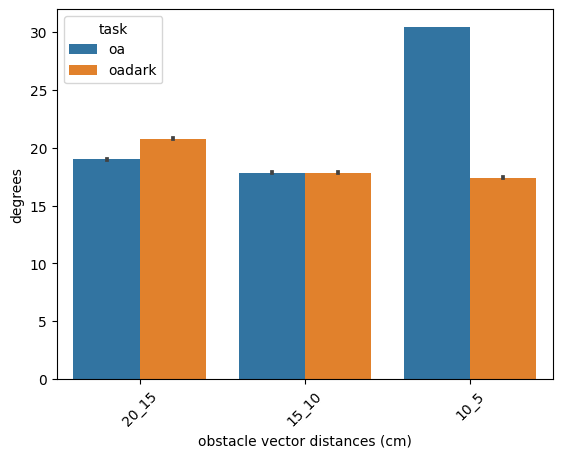

In [241]:

sns.barplot(data=obstacle_vector_df ,x='type',y='value',hue = 'task',errorbar='se')
plt.xticks(rotation=45)
plt.ylabel('degrees')
plt.xlabel('obstacle vector distances (cm)')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])

([<matplotlib.axis.XTick at 0x253af2328b0>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

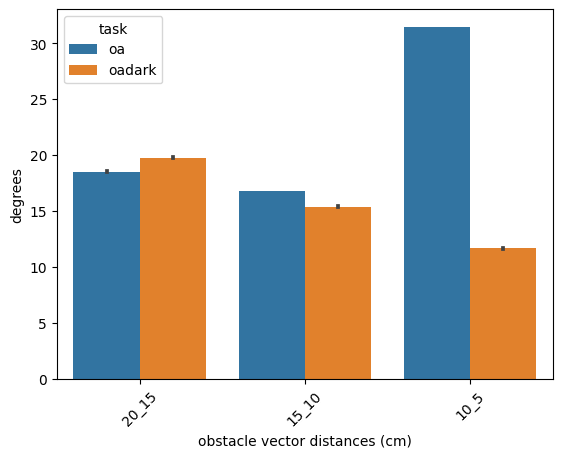

In [242]:

sns.barplot(data=obstacle_vector_df ,x='type',y='value',hue = 'task',errorbar='se',estimator='median')
plt.xticks(rotation=45)
plt.ylabel('degrees')
plt.xlabel('obstacle vector distances (cm)')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])

([<matplotlib.axis.XTick at 0x257cd8665e0>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

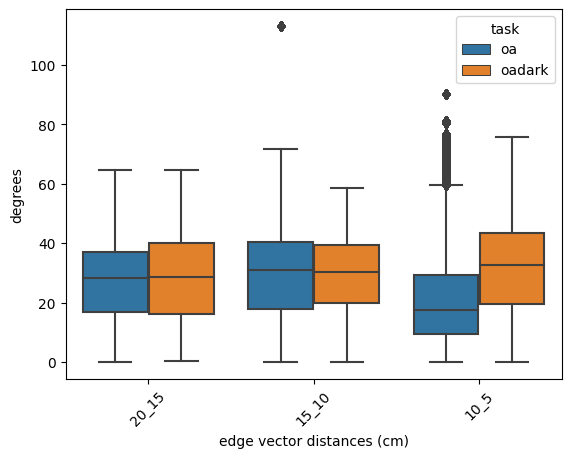

In [11]:

sns.boxplot(data=edge_vector_df ,x='type',y='value',hue = 'task')
plt.xticks(rotation=45)
plt.ylabel('degrees')
plt.xlabel('edge vector distances (cm)')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])


In [ ]:

sns.boxplot(data=edge_vector_df ,x='type',y='value',hue = 'task')
plt.xticks(rotation=45)
plt.ylabel('degrees')
plt.xlabel('edge vector distances (cm)')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])

In [49]:
ob_lin_df_all = data.melt(id_vars=['task','ob_linearity_5','ob_linearity_5','ob_linearity_5','ob_linearity_5']).drop(columns=['variable','value'])

ob_lin_df_5 = ob_lin_df_all[['task','ob_linearity_5']]
ob_lin_df_5['type'] = 'ob_linearity_5'
ob_lin_df_5['value']=  ob_lin_df_5['ob_linearity_5']
ob_lin_df_5 = ob_lin_df_5.drop(columns=['ob_linearity_5'])

In [50]:
ob_lin_df_20

,task,type,value
0,oa,ob_linearity_20,NaN
1,oa,ob_linearity_20,NaN
2,oa,ob_linearity_20,0.963126
3,oa,ob_linearity_20,NaN
4,oa,ob_linearity_20,NaN
...,...,...,...
876387,oa,ob_linearity_20,NaN
876388,oa,ob_linearity_20,NaN
876389,oa,ob_linearity_20,NaN
876390,oa,ob_linearity_20,NaN


In [12]:
data = pd.concat([oa_long,dark_long])
compute_obstacle_tortuosity_distance_threshold(data,20)
compute_obstacle_tortuosity_distance_threshold(data,15)
compute_obstacle_tortuosity_distance_threshold(data,10)
compute_obstacle_tortuosity_distance_threshold(data,5)

In [13]:
ob_lin_df_all = data.melt(id_vars=['task','ob_linearity_20','ob_linearity_15','ob_linearity_10','ob_linearity_5']).drop(columns=['variable','value'])

ob_lin_df_20 = ob_lin_df_all[['task','ob_linearity_20']]
ob_lin_df_20['type'] = 'ob_linearity_20'
ob_lin_df_20['value']=  ob_lin_df_20['ob_linearity_20']
ob_lin_df_20 = ob_lin_df_20.drop(columns=['ob_linearity_20'])

ob_lin_df_15 = ob_lin_df_all[['task','ob_linearity_15']]
ob_lin_df_15['type'] = 'ob_linearity_15'
ob_lin_df_15['value']=  ob_lin_df_15['ob_linearity_15']
ob_lin_df_15 = ob_lin_df_15.drop(columns=['ob_linearity_15'])

ob_lin_df_10 = ob_lin_df_all[['task','ob_linearity_10']]
ob_lin_df_10['type'] = 'ob_linearity_10'
ob_lin_df_10['value']=  ob_lin_df_10['ob_linearity_10']
ob_lin_df_10 = ob_lin_df_10.drop(columns=['ob_linearity_10'])

ob_lin_df_5 = ob_lin_df_all[['task','ob_linearity_5']]
ob_lin_df_5['type'] = 'ob_linearity_5'
ob_lin_df_5['value']=  ob_lin_df_5['ob_linearity_5']
ob_lin_df_5 = ob_lin_df_5.drop(columns=['ob_linearity_5'])

ob_lin_df = pd.concat([ob_lin_df_20,ob_lin_df_15,ob_lin_df_10,ob_lin_df_5])
ob_lin_df = ob_lin_df[ob_lin_df['value'].notna()]

<AxesSubplot: xlabel='value', ylabel='Proportion'>

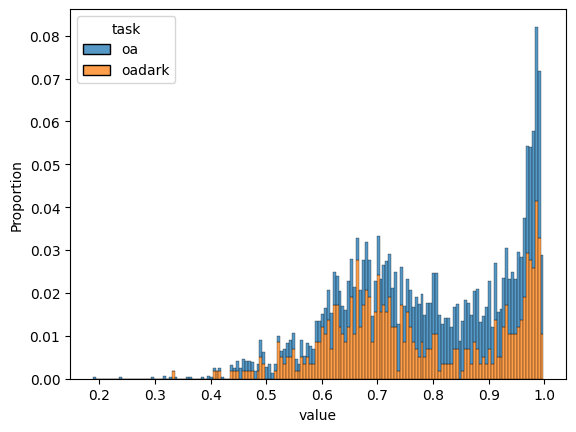

In [29]:

sns.histplot(data=ob_lin_df_15,x='value',hue = 'task', multiple="stack",common_norm=False,stat='proportion')

In [35]:
data = data.drop(columns = ['level_0'])
data = data.reset_index()

<AxesSubplot: xlabel='ob_linearity_20', ylabel='Proportion'>

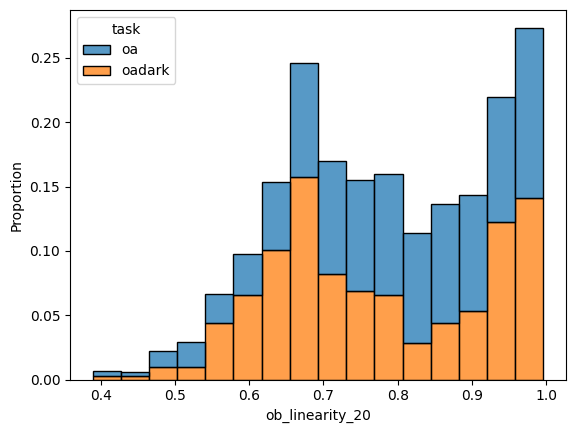

In [40]:

sns.histplot(data=data,x='ob_linearity_20',hue = 'task', multiple="stack",common_norm=False,stat='proportion')

In [46]:
data.obstacle_vector_ang_10_5

18      63.549709
29       9.253725
40       0.505687
42      20.047254
55      45.477758
          ...    
3329    10.755561
3357     9.006778
3369    17.169524
3377    27.038912
3400     1.921997
Name: obstacle_vector_ang_10_5, Length: 3464, dtype: float64

<AxesSubplot: xlabel='edge_vector_ang_10_5', ylabel='Proportion'>

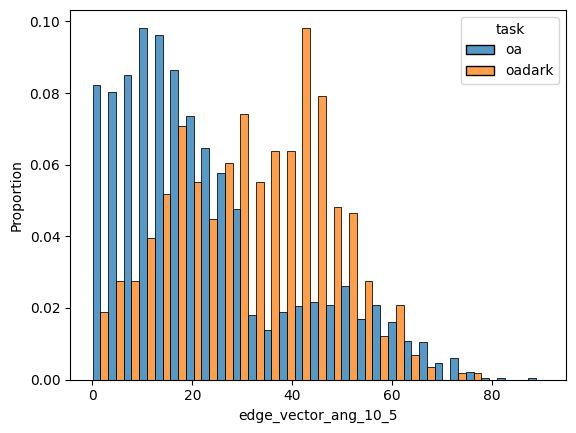

In [54]:

sns.histplot(data=data,x='edge_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion')

<AxesSubplot: xlabel='edge_vector_ang_20_15', ylabel='Proportion'>

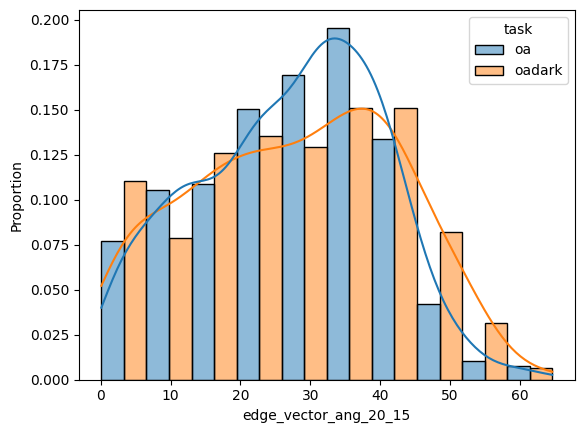

In [80]:

sns.histplot(data=data,x='edge_vector_ang_20_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='edge_vector_ang_15_10', ylabel='Proportion'>

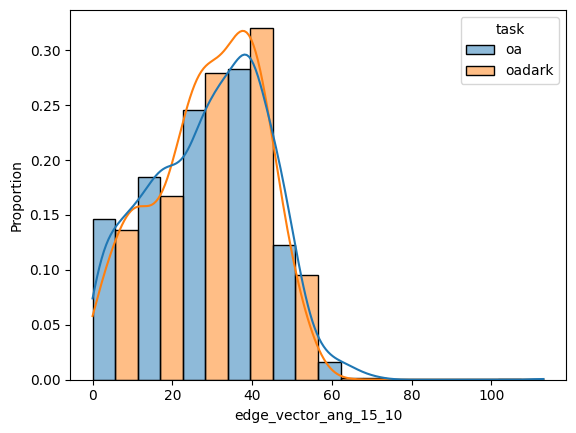

In [79]:

sns.histplot(data=data,x='edge_vector_ang_15_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='edge_vector_ang_10_5', ylabel='Proportion'>

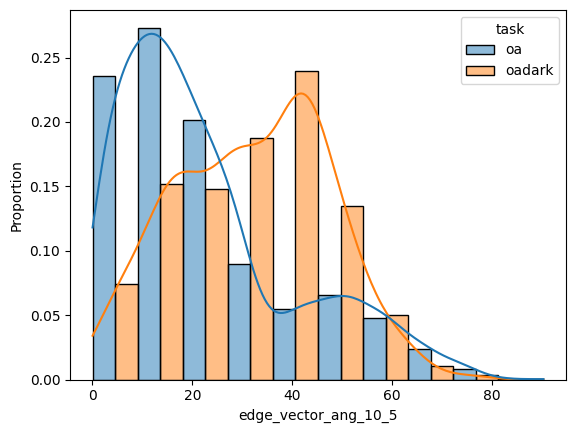

In [81]:

sns.histplot(data=data,x='edge_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

In [163]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
0,18,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,NaN,NaN,1.599672,0.625128,-4.875132,1.848786,1.054086,0.948689,-59.433783,34.204927
1,29,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,NaN,NaN,1.018079,0.982242,-63.790150,37.837011,1.016752,0.983524,-63.922911,37.965265
2,40,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,-78.624265,41.503922,1.032414,0.968604,-79.211426,42.051677,1.036111,0.965148,-78.841764,41.706100
3,42,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,NaN,NaN,1.063013,0.940722,-1.312910,1.147695,1.146501,0.872219,7.035882,-5.702619
4,55,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,NaN,NaN,1.582075,0.632081,2.975108,-1.211416,1.059907,0.943479,-49.241650,29.928321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3459,3329,104.0,56379.593830,56381.863283,"[56379.602316, 56379.618956, 56379.635532, 563...","[20281, 20282, 20283, 20284, 20285, 20286, 202...","[89.63011169433594, 89.10157012939453, 89.6400...","[261.7398681640625, 261.56158447265625, 260.80...","[103.79507446289062, 102.26407623291016, 101.1...","[256.8754577636719, 257.3447265625, 256.452667...",...,NaN,NaN,1.013291,0.986884,-2.005440,1.915271,1.001227,0.998775,-3.211820,3.104369
3460,3357,136.0,56477.680960,56480.421286,"[56477.686118, 56477.703129, 56477.720486, 564...","[26164, 26165, 26166, 26167, 26168, 26169, 261...","[90.63539123535156, 90.03893280029297, 89.9907...","[258.1434020996094, 258.5754089355469, 258.836...","[105.1650619506836, 104.66145324707031, 104.58...","[254.54054260253906, 254.675537109375, 254.388...",...,NaN,NaN,1.007080,0.992970,-1.398796,1.360304,1.001229,0.998772,-1.983830,1.940513
3461,3369,150.0,56526.595417,56529.200768,"[56526.603148, 56526.61984, 56526.636633, 5652...","[29098, 29099, 29100, 29101, 29102, 29103, 291...","[90.00463104248047, 89.25779724121094, 89.2131...","[260.19158935546875, 260.1805114746094, 260.24...","[106.48261260986328, 105.2131576538086, 104.83...","[254.4982452392578, 254.9815216064453, 254.789...",...,NaN,NaN,1.009816,0.990280,-0.761281,0.740967,1.001315,0.998686,-1.611292,1.581610
3462,3377,160.0,56557.064166,56559.95

In [166]:
trial.obstacle_nose_x.to_numpy[

TypeError: 'method' object is not subscriptable

In [214]:
get_mean_of_df(trial,'obstacle_nose_x',bins=50)

array([48.65134348, 48.22095344, 47.78822299, 47.34900991, 46.91612999,
       46.48978601, 46.0538215 , 45.61460375, 45.15774504, 44.70795318,
       44.30551864, 43.92405275, 43.53160489, 43.10519115, 42.66320866,
       42.2463788 , 41.84903653, 41.49363526, 41.15851519, 40.86457473,
       40.61676802, 40.35918462, 40.09984584, 39.88357521, 39.67702401,
       39.47552913, 39.28310867, 39.10098256, 38.90354864, 38.71835258,
       38.53356578, 38.32588724, 38.08677294, 37.83345954, 37.54338974,
       37.19635766, 36.83018117, 36.4287628 , 35.99898974, 35.5562974 ,
       35.05033826, 34.52652794, 33.90502958, 33.27074341, 32.63336295,
       31.99628736, 31.32044062, 30.58250865, 29.8169271 , 28.99471493])

In [222]:
trial.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
skill,,,,,,,,,,,,,,,,,,,,,
early,19,19,19,19,19,19,19,19,19,19,...,9,9,19,19,19,19,18,18,18,18
late,6,6,6,6,6,6,6,6,6,6,...,2,2,6,6,6,6,6,6,6,6
middle,13,13,13,13,13,13,13,13,13,13,...,4,4,13,13,13,13,13,13,13,13
naive,12,12,12,12,12,12,12,12,12,12,...,8,8,12,12,12,12,11,11,11,11


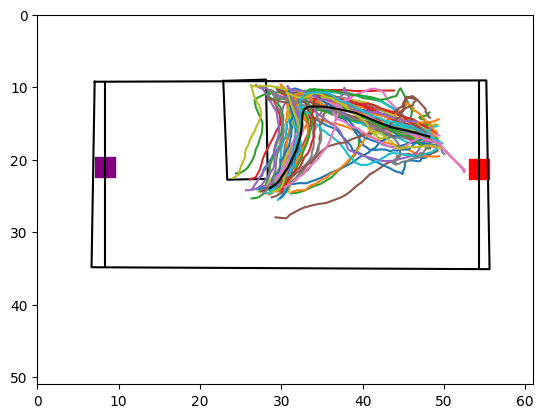

In [221]:
trial = data[(data.edge_vector_ang_10_5>=40) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

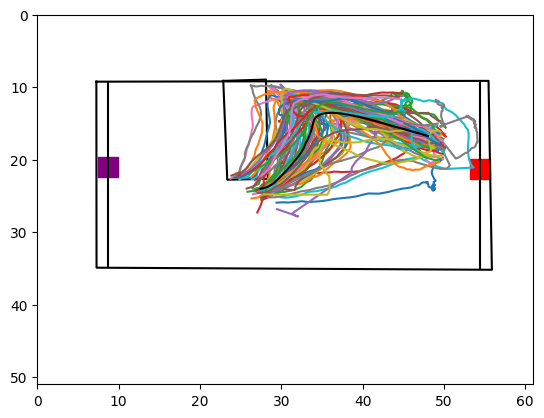

In [143]:
trial = data[(data.linearity<=.7) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)]
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

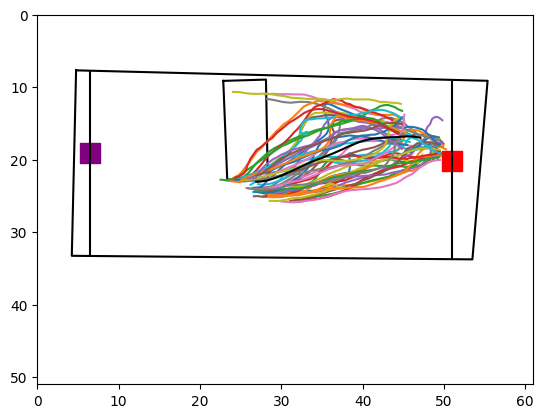

In [142]:
trial = data[(data.linearity>=.7) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)]
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

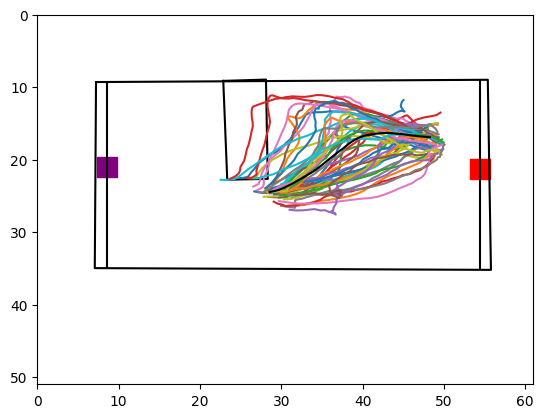

In [230]:
trial = data[(data.ob_linearity>=.7) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

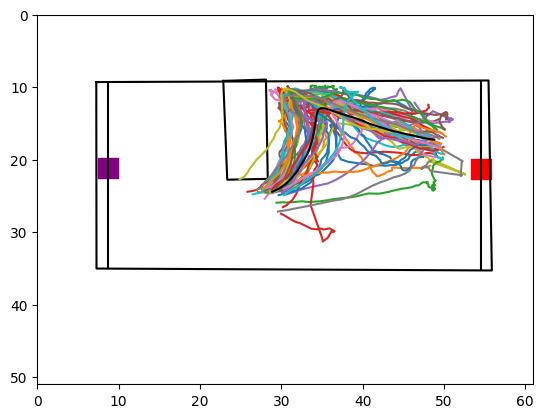

In [229]:
trial = data[(data.ob_linearity<=.7) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

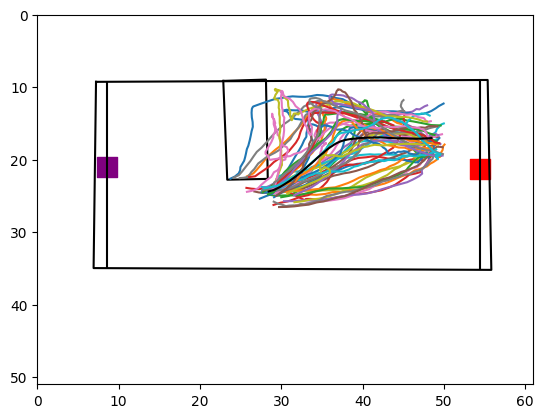

In [223]:
trial = data[(data.edge_vector_ang_10_5<=40) & (data.task=='oa') & (data.obstacle_cluster==0)&(data['distance_from_mean_center']<=2)].sample(50)
fig,ax = plt.subplots()
plot_arena(trial,ax,obstacle=True)
mean_x = get_mean_of_df(trial,'obstacle_nose_x',bins=50)
mean_y = get_mean_of_df(trial,'obstacle_nose_y',bins=50)

for ind,row in trial.iterrows():
    ax.plot(row.obstacle_nose_x,row.obstacle_nose_y)
ax.plot(mean_x,mean_y,c = 'black')

In [224]:
trial.groupby(['skill']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
skill,,,,,,,,,,,,,,,,,,,,,
early,15,15,15,15,15,15,15,15,15,15,...,8,8,15,15,15,15,15,15,15,15
late,6,6,6,6,6,6,6,6,6,6,...,3,3,6,6,6,6,6,6,6,6
middle,17,17,17,17,17,17,17,17,17,17,...,8,8,17,17,17,17,17,17,17,17
naive,11,11,11,11,11,11,11,11,11,11,...,8,8,11,11,11,11,11,11,11,11


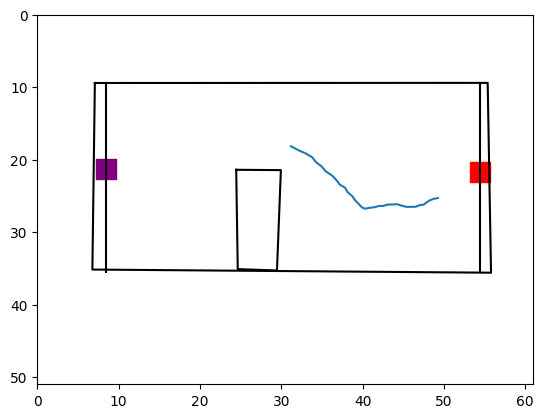

In [204]:
trial = data[(data.edge_vector_ang_10_5<=40) & (data.task=='oa')].sample(1)
fig,ax = plt.subplots()
plot_arena_single(trial,ax,obstacle=True)
ax.plot(trial.obstacle_nose_x.to_numpy()[0],trial.obstacle_nose_y.to_numpy()[0])

<AxesSubplot: xlabel='obstacle_vector_ang_20_15', ylabel='Proportion'>

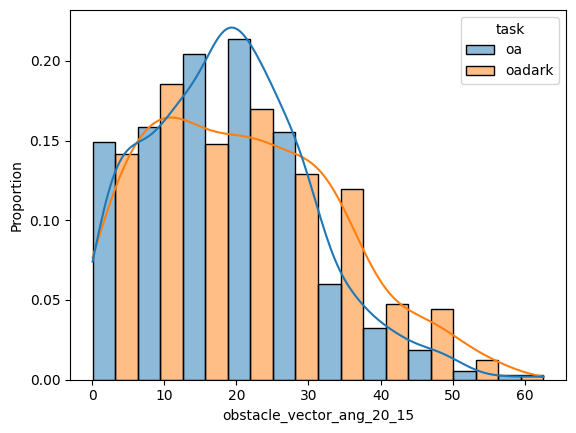

In [75]:

sns.histplot(data=data,x='obstacle_vector_ang_20_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='obstacle_vector_ang_15_10', ylabel='Proportion'>

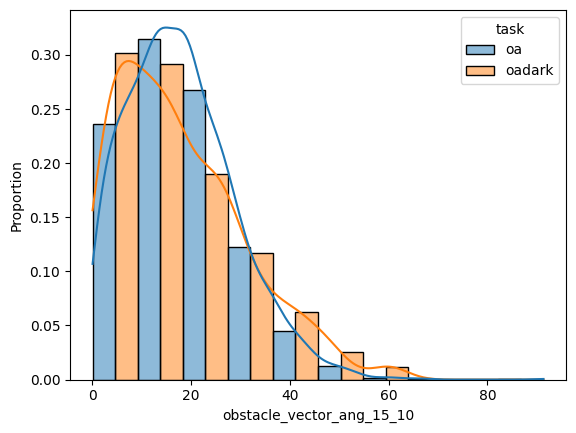

In [76]:

sns.histplot(data=data,x='obstacle_vector_ang_15_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='obstacle_vector_ang_10_5', ylabel='Proportion'>

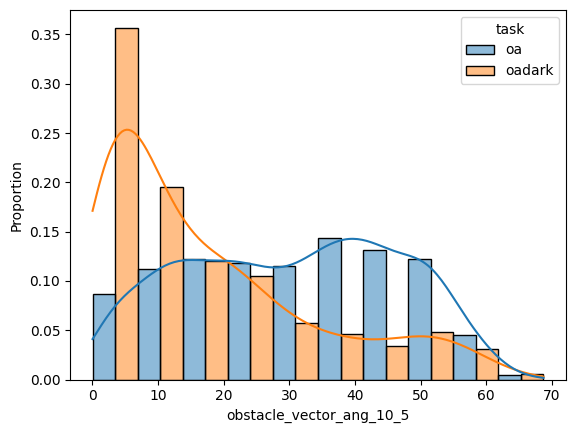

In [78]:

sns.histplot(data=data,x='obstacle_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='ob_linearity_15', ylabel='Proportion'>

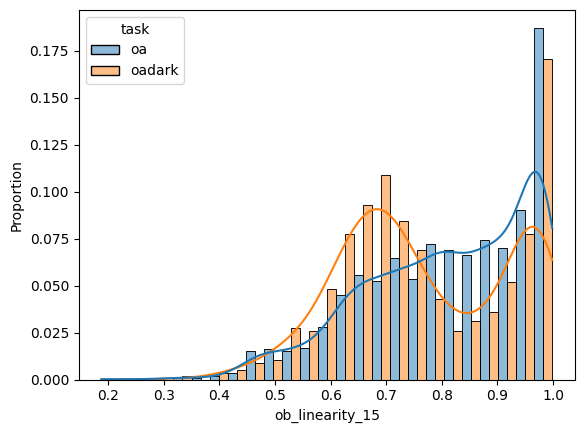

In [69]:

sns.histplot(data=data,x='ob_linearity_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True)

<AxesSubplot: xlabel='ob_linearity_10', ylabel='Proportion'>

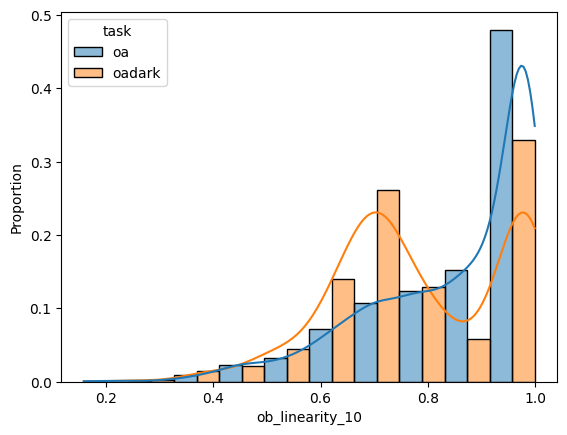

In [82]:
sns.histplot(data=data,x='ob_linearity_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='ob_linearity_10', ylabel='Proportion'>

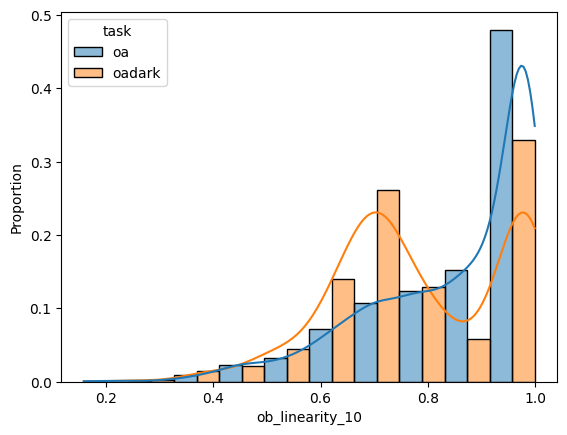

In [19]:
sns.histplot(data=data,x='ob_linearity_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='go_linearity', ylabel='Proportion'>

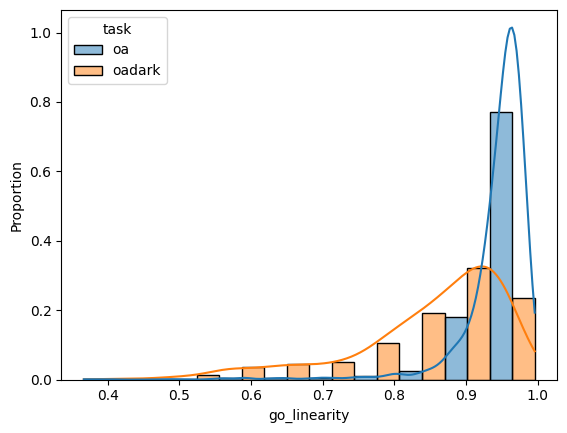

In [84]:
sns.histplot(data=data,x='go_linearity',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='linearity', ylabel='Proportion'>

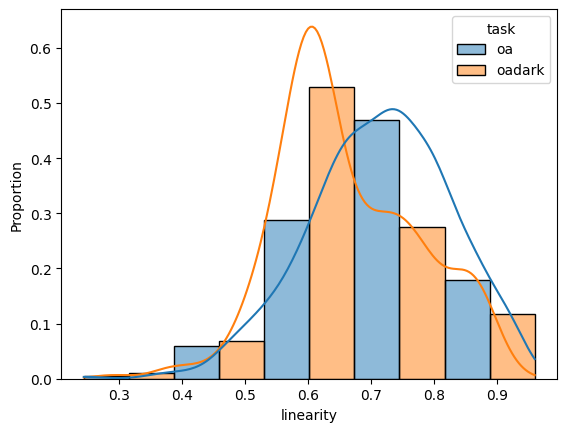

In [140]:
sns.histplot(data=data,x='linearity',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=5)

<AxesSubplot: xlabel='ob_linearity_15', ylabel='Proportion'>

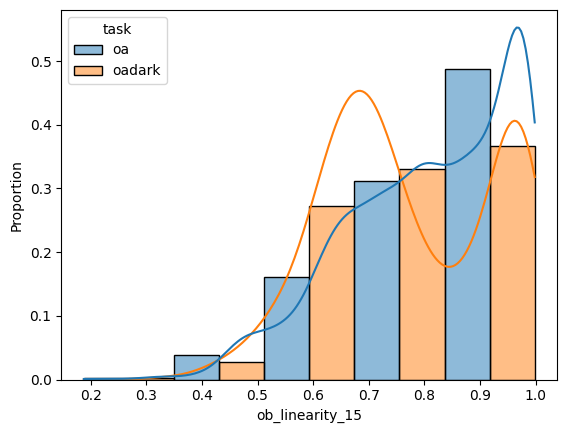

In [145]:
sns.histplot(data=data,x='ob_linearity_15',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=5)

In [147]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
0,18,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,NaN,NaN,1.599672,0.625128,-4.875132,1.848786,1.054086,0.948689,-59.433783,34.204927
1,29,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,NaN,NaN,1.018079,0.982242,-63.790150,37.837011,1.016752,0.983524,-63.922911,37.965265
2,40,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,-78.624265,41.503922,1.032414,0.968604,-79.211426,42.051677,1.036111,0.965148,-78.841764,41.706100
3,42,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,NaN,NaN,1.063013,0.940722,-1.312910,1.147695,1.146501,0.872219,7.035882,-5.702619
4,55,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,NaN,NaN,1.582075,0.632081,2.975108,-1.211416,1.059907,0.943479,-49.241650,29.928321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3459,3329,104.0,56379.593830,56381.863283,"[56379.602316, 56379.618956, 56379.635532, 563...","[20281, 20282, 20283, 20284, 20285, 20286, 202...","[89.63011169433594, 89.10157012939453, 89.6400...","[261.7398681640625, 261.56158447265625, 260.80...","[103.79507446289062, 102.26407623291016, 101.1...","[256.8754577636719, 257.3447265625, 256.452667...",...,NaN,NaN,1.013291,0.986884,-2.005440,1.915271,1.001227,0.998775,-3.211820,3.104369
3460,3357,136.0,56477.680960,56480.421286,"[56477.686118, 56477.703129, 56477.720486, 564...","[26164, 26165, 26166, 26167, 26168, 26169, 261...","[90.63539123535156, 90.03893280029297, 89.9907...","[258.1434020996094, 258.5754089355469, 258.836...","[105.1650619506836, 104.66145324707031, 104.58...","[254.54054260253906, 254.675537109375, 254.388...",...,NaN,NaN,1.007080,0.992970,-1.398796,1.360304,1.001229,0.998772,-1.983830,1.940513
3461,3369,150.0,56526.595417,56529.200768,"[56526.603148, 56526.61984, 56526.636633, 5652...","[29098, 29099, 29100, 29101, 29102, 29103, 291...","[90.00463104248047, 89.25779724121094, 89.2131...","[260.19158935546875, 260.1805114746094, 260.24...","[106.48261260986328, 105.2131576538086, 104.83...","[254.4982452392578, 254.9815216064453, 254.789...",...,NaN,NaN,1.009816,0.990280,-0.761281,0.740967,1.001315,0.998686,-1.611292,1.581610
3462,3377,160.0,56557.064166,56559.95

<AxesSubplot: xlabel='edge_vector_ang_10_5', ylabel='Proportion'>

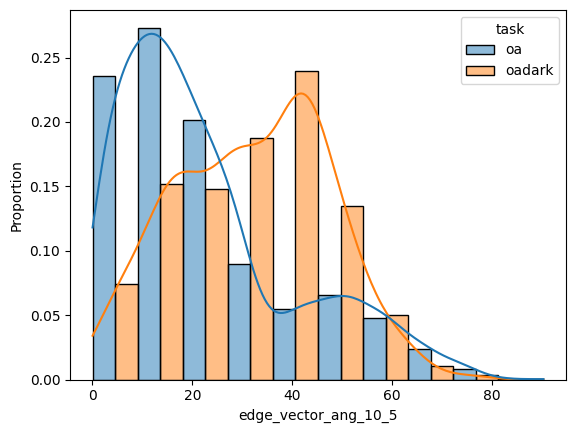

In [146]:

sns.histplot(data=data,x='edge_vector_ang_10_5',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=10)

<AxesSubplot: xlabel='ob_linearity_10', ylabel='Proportion'>

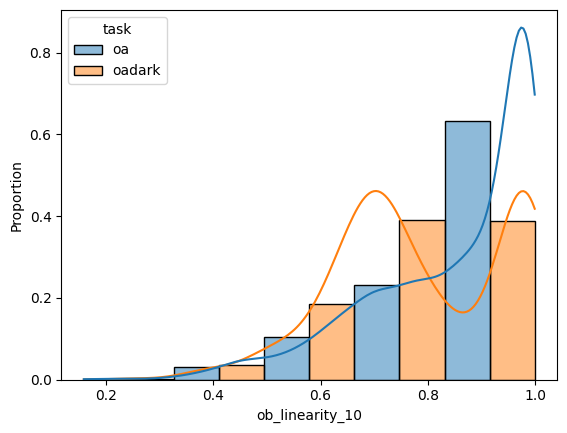

In [144]:
sns.histplot(data=data,x='ob_linearity_10',hue = 'task', multiple="dodge",common_norm=False,stat='proportion',kde = True,bins=5)

<AxesSubplot: xlabel='ob_linearity', ylabel='Proportion'>

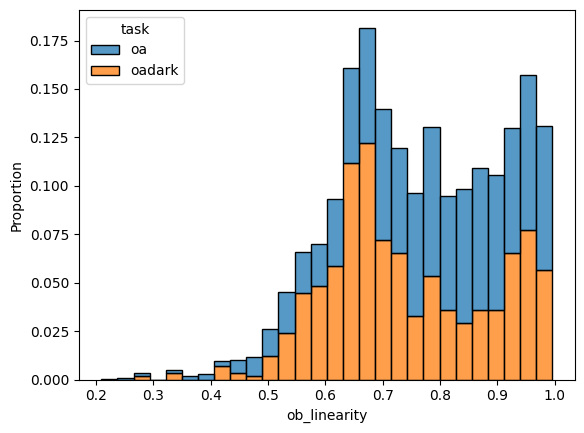

In [36]:

sns.histplot(data=data,x='ob_linearity',hue = 'task', multiple="stack",common_norm=False,stat='proportion')

<AxesSubplot: xlabel='value', ylabel='Proportion'>

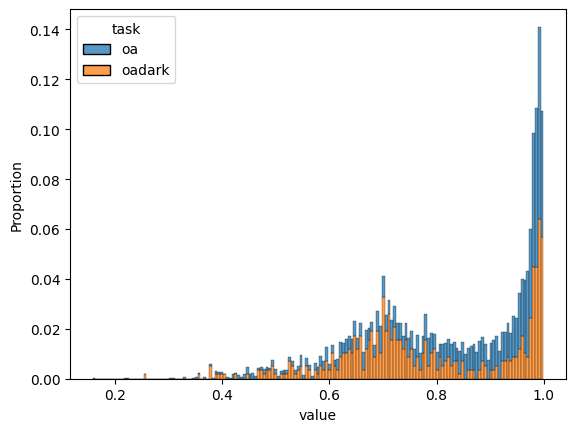

In [30]:

sns.histplot(data=ob_lin_df_10,x='value',hue = 'task', multiple="stack",common_norm=False,stat='proportion')

([<matplotlib.axis.XTick at 0x1643124d400>,
 [Text(0, 0, '20_15'), Text(1, 0, '15_10'), Text(2, 0, '10_5')])

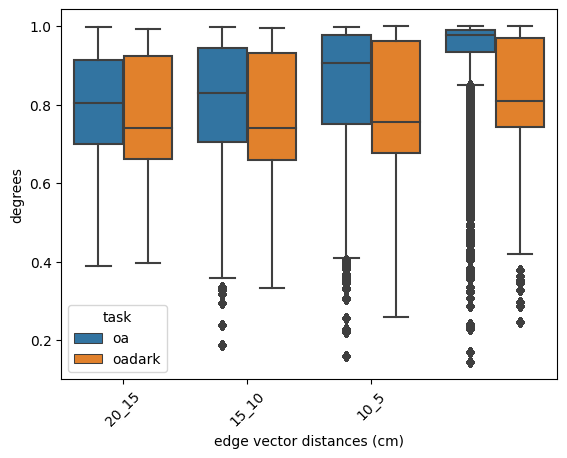

In [91]:

sns.boxplot(data=ob_lin_df ,x='type',y='value',hue = 'task')
plt.xticks(rotation=45)
plt.ylabel('degrees')
plt.xlabel('edge vector distances (cm)')
plt.xticks(ticks = [0,1,2], labels=['20_15','15_10','10_5'])

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

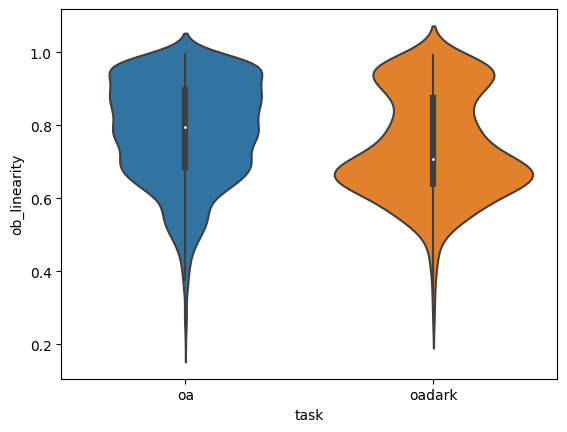

In [149]:
sns.violinplot(data=data, x = 'task',y = 'ob_linearity')

<AxesSubplot: xlabel='task', ylabel='linearity'>

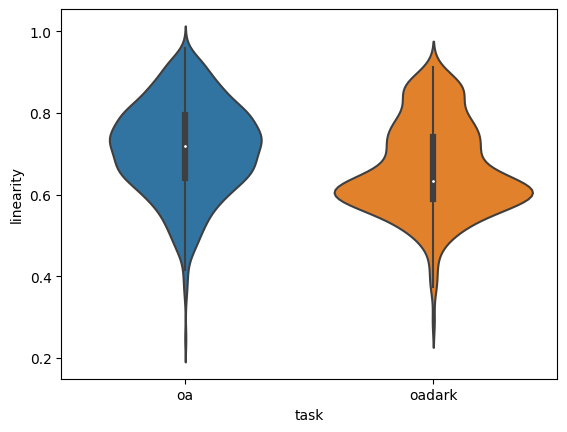

In [148]:
sns.violinplot(data=data, x = 'task',y = 'linearity')

<AxesSubplot: xlabel='task', ylabel='go_linearity'>

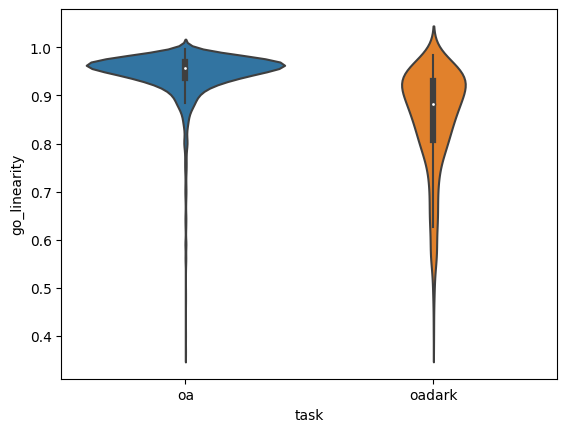

In [65]:
sns.violinplot(data=data, x = 'task',y = 'go_linearity')

In [83]:
#data = data.drop(columns=['level_0'])
data.reset_index(inplace=True)

In [82]:
data

,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,percent_change_ob_tortuosity_20,percent_change_ob_linearity_20,ob_tortuosity_15,ob_linearity_15,percent_change_ob_tortuosity_15,percent_change_ob_linearity_15,ob_tortuosity_5,ob_linearity_5,percent_change_ob_tortuosity_5,percent_change_ob_linearity_5
18,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...","[676.0281372070312, 676.703857421875, 677.3984...",...,NaN,NaN,1.599672,0.625128,-4.875132,1.848786,1.054086,0.948689,-59.433783,34.204927
29,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...","[670.802734375, 672.84228515625, 675.552612304...",...,NaN,NaN,1.018079,0.982242,-63.790150,37.837011,1.016752,0.983524,-63.922911,37.965265
40,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...","[672.5169677734375, 674.3436279296875, 675.742...",...,-78.624265,41.503922,1.032414,0.968604,-79.211426,42.051677,1.036111,0.965148,-78.841764,41.706100
42,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...","[677.0445556640625, 678.287353515625, 679.4829...",...,NaN,NaN,1.063013,0.940722,-1.312910,1.147695,1.146501,0.872219,7.035882,-5.702619
55,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...","[674.6488037109375, 676.0101318359375, 678.280...",...,NaN,NaN,1.582075,0.632081,2.975108,-1.211416,1.059907,0.943479,-49.241650,29.928321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3329,104.0,56379.593830,56381.863283,"[56379.602316, 56379.618956, 56379.635532, 563...","[20281, 20282, 20283, 20284, 20285, 20286, 202...","[89.63011169433594, 89.10157012939453, 89.6400...","[261.7398681640625, 261.56158447265625, 260.80...","[103.79507446289062, 102.26407623291016, 101.1...","[256.8754577636719, 257.3447265625, 256.452667...","[97.25967407226562, 96.65650177001953, 96.1992...",...,NaN,NaN,1.013291,0.986884,-2.005440,1.915271,1.001227,0.998775,-3.211820,3.104369
3357,136.0,56477.680960,56480.421286,"[56477.686118, 56477.703129, 56477.720486, 564...","[26164, 26165, 26166, 26167, 26168, 26169, 261...","[90.63539123535156, 90.03893280029297, 89.9907...","[258.1434020996094, 258.5754089355469, 258.836...","[105.1650619506836, 104.66145324707031, 104.58...","[254.54054260253906, 254.675537109375, 254.388...","[98.38204193115234, 97.76766204833984, 97.2310...",...,NaN,NaN,1.007080,0.992970,-1.398796,1.360304,1.001229,0.998772,-1.983830,1.940513
3369,150.0,56526.595417,56529.200768,"[56526.603148, 56526.61984, 56526.636633, 5652...","[29098, 29099, 29100, 29101, 29102, 2910

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

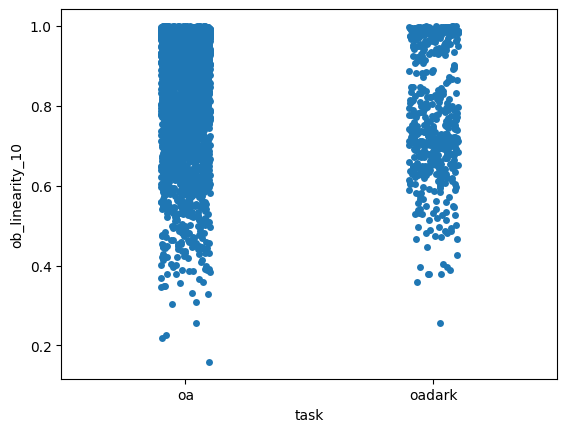

In [89]:
sns.stripplot(data=data,x = 'task',y = 'ob_linearity_10')

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

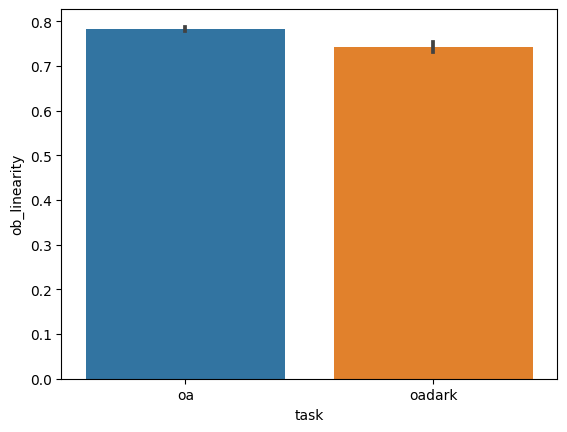

In [245]:
sns.barplot(data=data, x = 'task',y = 'ob_linearity',estimator = 'mean')

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

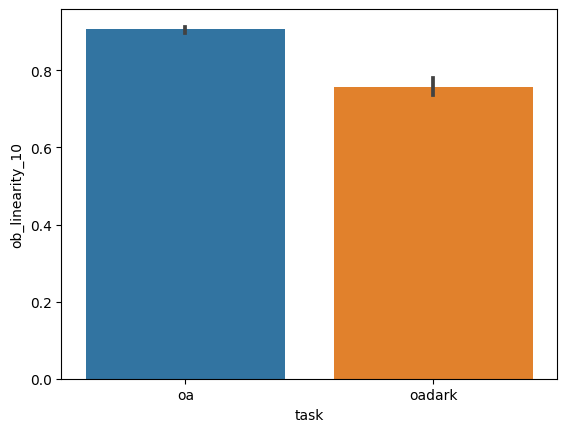

In [246]:
sns.barplot(data=data, x = 'task',y = 'ob_linearity_10',estimator = 'median')

<AxesSubplot: >

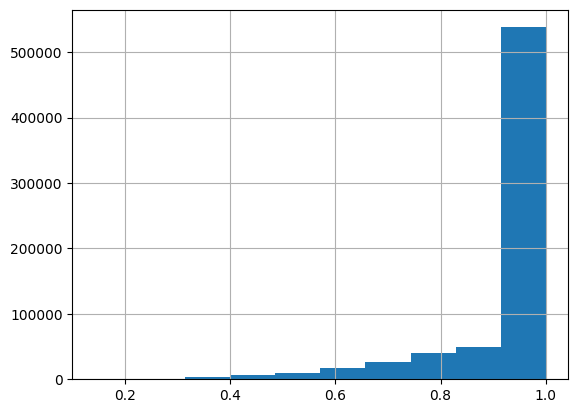

In [55]:
ob_lin_df_5[ob_lin_df_5.task == 'oa'].value.hist()

<AxesSubplot: xlabel='task', ylabel='edge_vector_ang_20_15'>

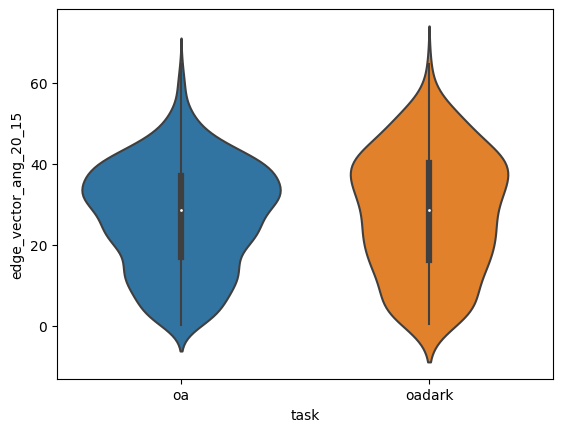

In [172]:
sns.violinplot(data=data ,x='task',y='edge_vector_ang_20_15',common_norm=True)

<AxesSubplot: xlabel='task', ylabel='edge_vector_ang_15_10'>

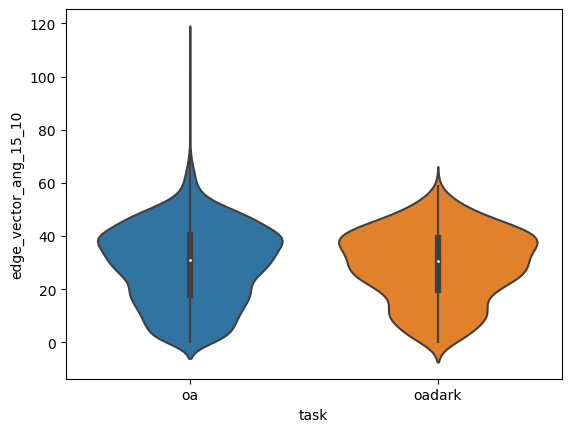

In [173]:
sns.violinplot(data=data ,x='task',y='edge_vector_ang_15_10',common_norm=True)

<AxesSubplot: xlabel='task', ylabel='edge_vector_ang_10_5'>

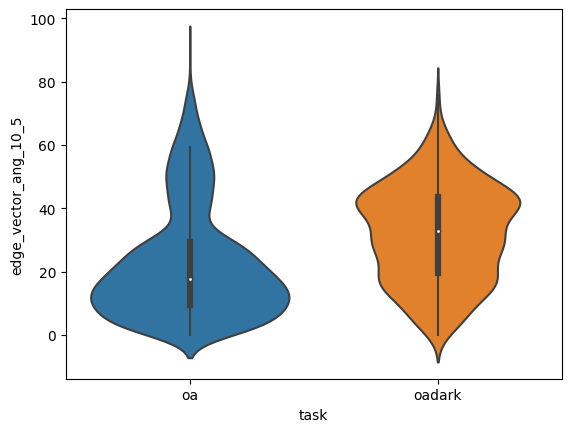

In [174]:
sns.violinplot(data=data ,x='task',y='edge_vector_ang_10_5',common_norm=True)

<AxesSubplot: xlabel='task', ylabel='edge_vector_ang_10_5'>

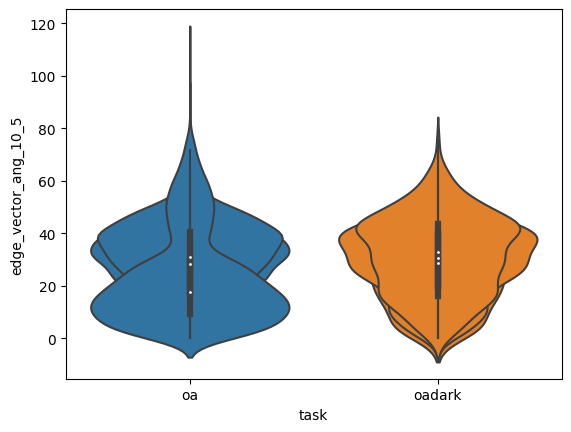

In [150]:
sns.violinplot(data=data ,x='task',y='edge_vector_ang_20_15',common_norm=True)
sns.violinplot(data=data ,x='task',y='edge_vector_ang_15_10',common_norm=True)
sns.violinplot(data=data ,x='task',y='edge_vector_ang_10_5',common_norm=True)

<AxesSubplot: xlabel='task', ylabel='obstacle_vector_ang_10_5'>

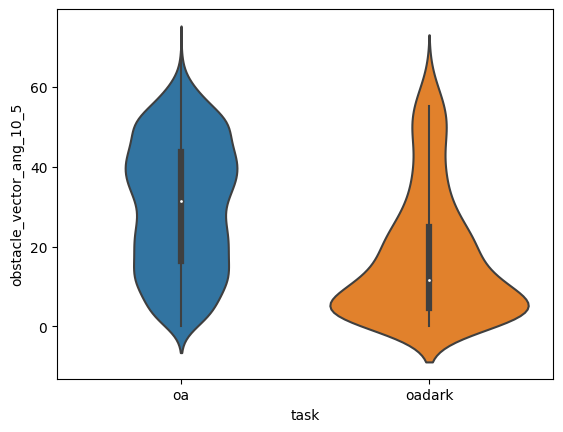

In [122]:
sns.violinplot(data=data ,x='task',y='obstacle_vector_ang_10_5',common_norm=True)

In [143]:
def calculate_obstalce_and_edge_vector_angle(df,thresh,thresh1):
    """only use long df"""
    for ind,row in df.iterrows():
        if row.obstacle_cluster == 0:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleBR_x_cm,row.gt_obstacleBR_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge>=thresh).max()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge>=thresh1).max()
                obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue

            
        elif row.obstacle_cluster == 1:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleBL_x_cm,row.gt_obstacleBL_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge>=thresh).max()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge>=thresh1).max()
                obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            
        elif row.obstacle_cluster == 4:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleTR_x_cm,row.gt_obstacleTR_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge>=thresh).max()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge>=thresh1).max()
                obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            
            
        elif row.obstacle_cluster == 5:
            nose_x = row.ts_nose_x_cm
            nose_y = row.ts_nose_y_cm
            edge_x,edge_y = row.gt_obstacleTL_x_cm,row.gt_obstacleTL_y_cm
            try:
                distance_thresh = np.argwhere(row.ts_distance_from_edge>=thresh).max()
                distance_thresh1 = np.argwhere(row.ts_distance_from_edge>=thresh1).max()
                obstacle_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,nose_y[distance_thresh]))
                edge_vector = calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(edge_x,edge_y))
                mouse_vector=calculate_vector_between_points((nose_x[distance_thresh],nose_y[distance_thresh]),(nose_x[distance_thresh1],nose_y[distance_thresh1]))
                obstacle_rad,obstacle_ang = angle_between_vectors(mouse_vector,obstacle_vector)
                edge_rad,edge_ang =angle_between_vectors(mouse_vector,edge_vector)
                df.at[ind,'obstacle_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = obstacle_ang
                df.at[ind,'edge_vector_ang'+'_'+str(thresh)+'_'+str(thresh1)] = edge_ang
            except ValueError:
                continue
            
            

In [9]:
def by_start_obstalce_average(df,title):
        #savepath = "D:/obstacle_avoidance/recordings"
        #savepath_session = os.path.join(*[savepath,'figures'])
        #savepath_session = os.path.join(*[savepath,str(pd.unique(df.date).item()),str(pd.unique(df.animal).item()),str(pd.unique(df.task).item())])
        #pdf = PdfPages(os.path.join((savepath_session), str(date)+ 'by_' +'_start_'+'obstacle' + 'consecutive.pdf'))
        key='Start'
        fig = plt.figure(constrained_layout=False, figsize=(16, 10),dpi=90)
        fig.suptitle(key + ' '+ 'and ' +'obstacle position' + ' ' + title)
        spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


        """Right"""
        panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
        ax1 = fig.add_subplot(panel_1[0,0])
        plot_arena(df,ax1)
        ax2 = fig.add_subplot(panel_1[0,1])
        plot_arena(df,ax2)
        ax2.set_title('right')
        ax3 = fig.add_subplot(panel_1[1,0])
        plot_arena(df,ax3)
        ax4 = fig.add_subplot(panel_1[1,1])
        plot_arena(df,ax4)
        ax5 = fig.add_subplot(panel_1[2,0])
        plot_arena(df,ax5)
        ax6 = fig.add_subplot(panel_1[2,1])
        plot_arena(df,ax6)

        right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]
        for subplot in right_axs:
          subplot.set_xticks([])
          subplot.set_yticks([]) 


        """Left """
        panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
        ax7 = fig.add_subplot(panel_2[0,0])
        plot_arena(df,ax7)
        ax8 = fig.add_subplot(panel_2[0,1])
        plot_arena(df,ax8)
        ax8.set_title('left')
        ax9 = fig.add_subplot(panel_2[1,0])
        plot_arena(df,ax9)
        ax10 = fig.add_subplot(panel_2[1,1])
        plot_arena(df,ax10)
        ax11= fig.add_subplot(panel_2[2,0])
        plot_arena(df,ax11)
        ax12 = fig.add_subplot(panel_2[2,1])
        plot_arena(df,ax12)

        left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
        for subplot in left_axs:
          subplot.set_xticks([])
          subplot.set_yticks([]) 





        """ plot trials"""
        right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
        left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

        for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                #cluster_frame = cluster_frame.sample(num_sample)
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                left_obstacle_axis = left_obstacle_dict.get(cluster)
                plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
                plot_obstacle(cluster_frame,left_obstacle_axis,cluster)
                right_obstacle_axis.set_title(str(cluster))
                left_obstacle_axis.set_title(str(cluster))
                for start, start_frame in cluster_frame.groupby(['start']):
                     if direction == 'right':
                         if start == 'bottom':
                              if cluster in [2,3]:
                                   sample_df = start_frame.sample(25)
                                   for ind,row in sample_df.iterrows():
                                        right_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:orange',alpha = .3)
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'black')
                                   
                                   
                                                                                                                    
                              else:     
                                   sample_df = start_frame.sample(25)
                                   for ind,row in sample_df.iterrows():
                                        right_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:orange',alpha = .3)
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'black')
                                   
                     
                         if start == 'top':
                              if cluster in [2,3]:
                                   sample_df = start_frame.sample(25)
                                   for ind,row in sample_df.iterrows():
                                        right_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:blue',alpha =.3)
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'tab:red')
                                   
                                   
                              else:
                                   sample_df = start_frame.sample(25) 
                                   for ind,row in sample_df.iterrows():
                                        right_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:blue',alpha =.3)    
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'tab:red')
                                   
                                   
           
                               
                     if direction == 'left':
                         if start == 'bottom':
                              if cluster in [2,3]:
                                   sample_df = start_frame.sample(25)
                                   for ind,row in sample_df.iterrows():
                                        left_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:orange',alpha = .3)
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'black')
                                   
                                   
                                                                                                                    
                              else:     
                                   sample_df = start_frame.sample(25)
                                   for ind,row in sample_df.iterrows():
                                        left_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:orange',alpha = .3)
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'black')
                                   
                         
                         if start == 'top':
                              if cluster in [2,3]:
                                   sample_df = start_frame.sample(25)
                                   for ind,row in sample_df.iterrows():
                                        left_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:blue',alpha =.3)
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'tab:red')
                                   
                                   
                              else:
                                   sample_df = start_frame.sample(25) 
                                   for ind,row in sample_df.iterrows():
                                        left_obstacle_axis.plot(row.ts_nose_x_cm,row.ts_nose_y_cm,c = 'tab:blue',alpha =.3)    
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'tab:red')
        markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['tab:orange','tab:blue']]
        ax1.legend(markers, ['bottom','top'], numpoints=1,title = 'right')  
        ax7.legend(markers, ['bottom','top'], numpoints=1,title = 'left')
                                 

In [94]:
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['tab:orange','tab:blue']]
ax1.legend(markers, ['top','bottom'], numpoints=1,title = 'right')
ax7.legend(markers, ['top','bottom'], numpoints=1,title = 'left')

NameError: name 'create_color_dict_from_list' is not defined

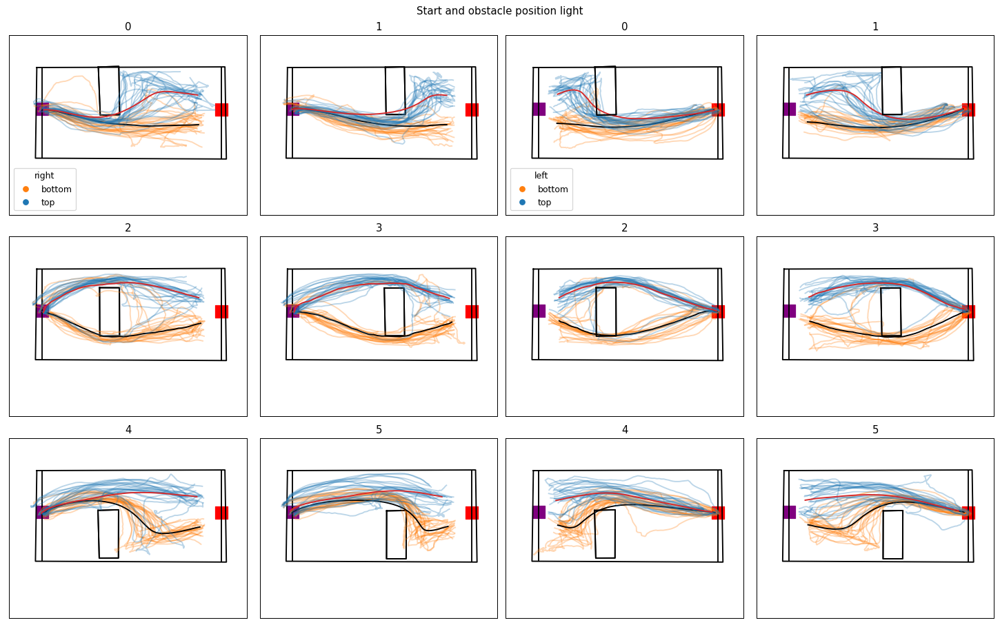

In [108]:
data = light[light.distance_from_mean_center<=3]
by_start_obstalce_average(data,'light')

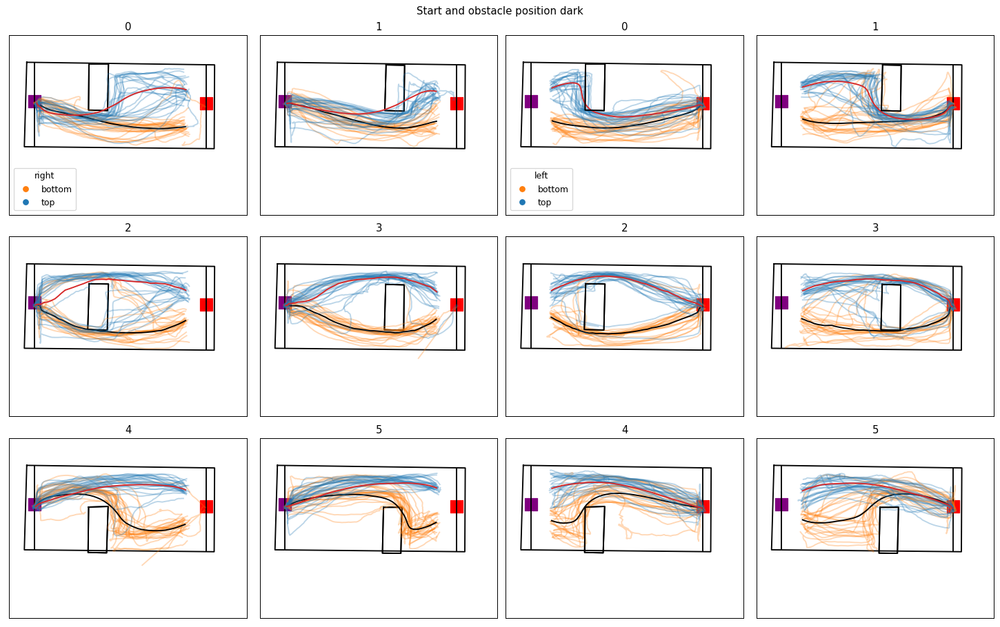

In [109]:
data = dark[dark.distance_from_mean_center<=3]
by_start_obstalce_average(data,'dark')

In [ ]:
for subplot in ax:
for subplot in ax:
    print()

In [ ]:
go_mean_x, go_mean_y= get_mean_of_df(trial_df,'goal_nose_x',50) , get_mean_of_df(trial_df,'goal_nose_y',50)
ax[0,0].plot(go_mean_x,go_mean_y,c ='black')

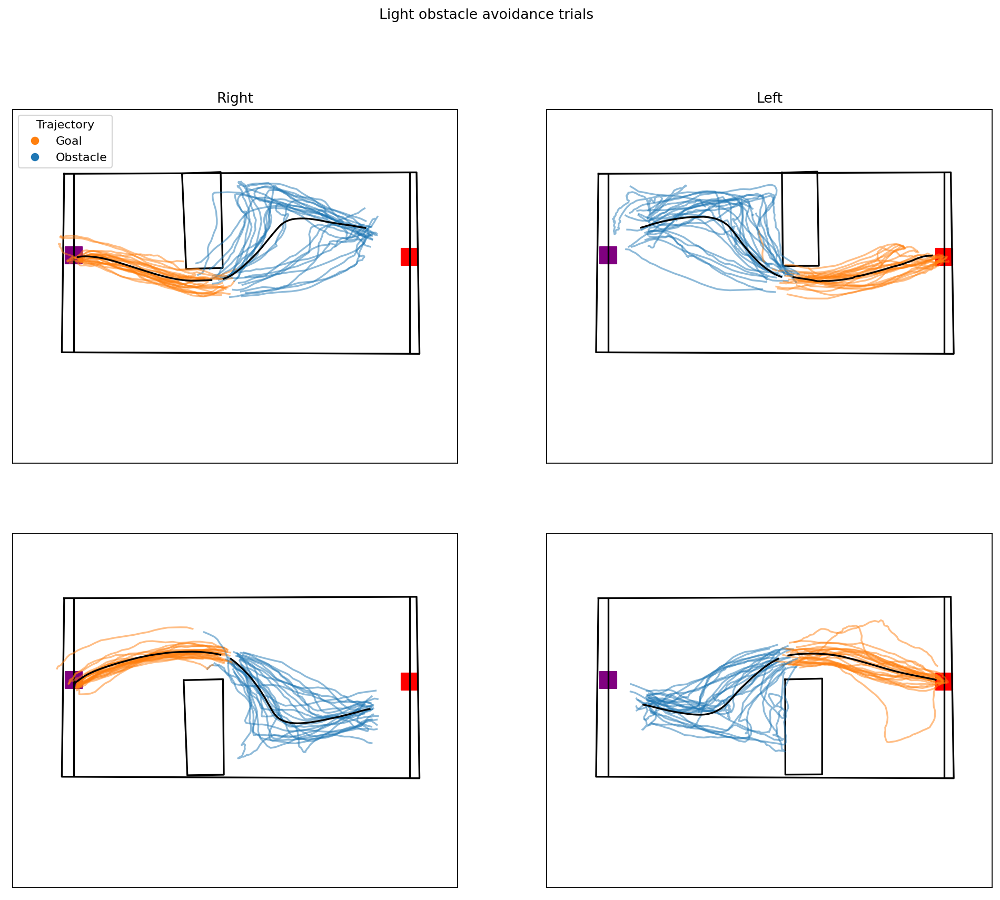

In [294]:
data = oa_long[oa_long.distance_from_mean_center<=3]
fig,ax = plt.subplots(2,2,figsize = (15,12),dpi = 160)

fig.suptitle('Light obstacle avoidance trials' )

ax[0,0].set_title('Right')
ax[0,1].set_title('Left')

plot_arena(data,ax[0,0])
plot_arena(data,ax[0,1])
plot_arena(data,ax[1,0])
plot_arena(data,ax[1,1])
for subplot in ax.reshape(-1):
    subplot.set_xticks([])
    subplot.set_yticks([]) 

for cluster,cluster_df in data.groupby(['obstacle_cluster']):
    if cluster == 0:
        plot_orginal_obstacle(cluster_df,ax[0,0],cluster)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[0,0].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[0,0].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(cluster_df,'goal_nose_x',50) , get_mean_of_df(cluster_df,'goal_nose_y',50)
        ax[0,0].plot(go_mean_x,go_mean_y,c ='black')
            
    elif cluster == 1:
        plot_orginal_obstacle(cluster_df,ax[0,1],cluster)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[0,1].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[0,1].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[0,1].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(trial_df,'goal_nose_x',50) , get_mean_of_df(trial_df,'goal_nose_y',50)
        ax[0,1].plot(go_mean_x,go_mean_y,c ='black')
    elif cluster == 4:
        plot_orginal_obstacle(cluster_df,ax[1,0],4)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[1,0].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[1,0].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[1,0].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(cluster_df,'goal_nose_x',50) , get_mean_of_df(cluster_df,'goal_nose_y',50)
        ax[1,0].plot(go_mean_x,go_mean_y,c ='black')
        
    elif cluster == 5:
        plot_orginal_obstacle(cluster_df,ax[1,1],5)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[1,1].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[1,1].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[1,1].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(cluster_df,'goal_nose_x',50) , get_mean_of_df(cluster_df,'goal_nose_y',50)
        ax[1,1].plot(go_mean_x,go_mean_y,c ='black')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['tab:orange','tab:blue']]
ax[0,0].legend(markers, ['Goal','Obstacle'], numpoints=1,title = 'Trajectory',loc = 'upper left')

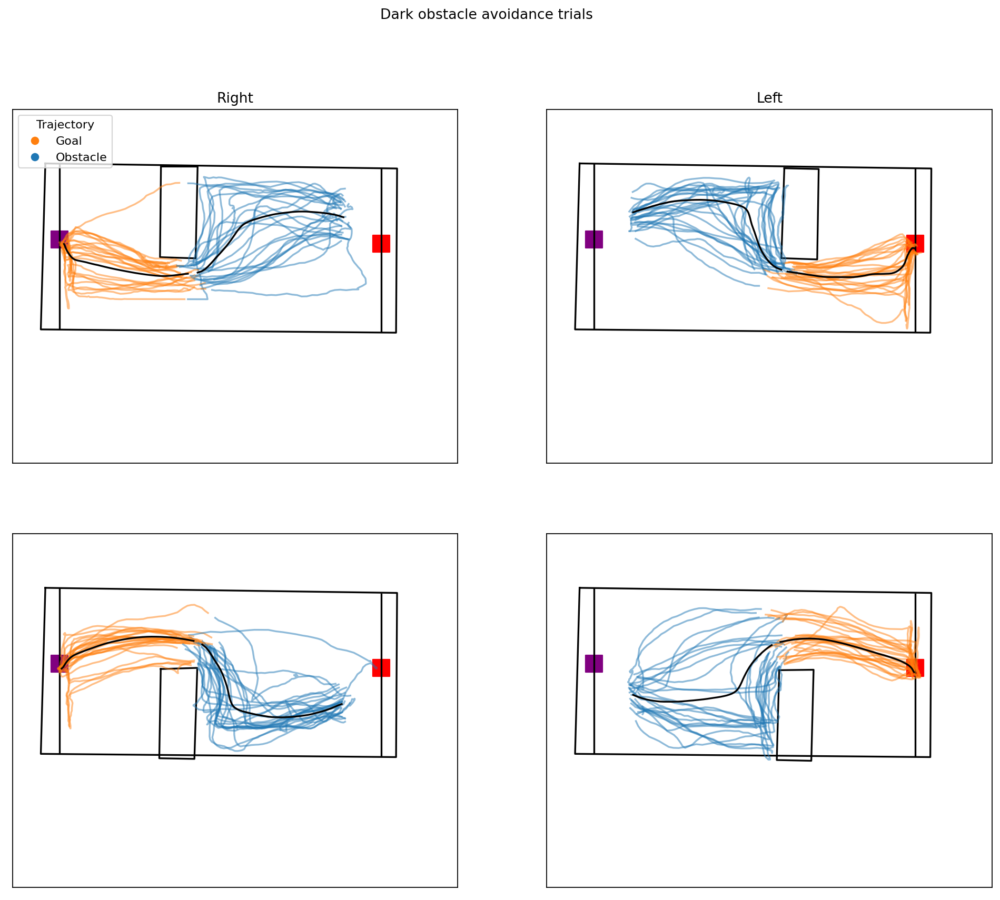

In [295]:
data = dark_long[dark_long.distance_from_mean_center<=3]
fig,ax = plt.subplots(2,2,figsize = (15,12),dpi = 160)

fig.suptitle('Dark obstacle avoidance trials' )

ax[0,0].set_title('Right')
ax[0,1].set_title('Left')

plot_arena(data,ax[0,0])
plot_arena(data,ax[0,1])
plot_arena(data,ax[1,0])
plot_arena(data,ax[1,1])
for subplot in ax.reshape(-1):
    subplot.set_xticks([])
    subplot.set_yticks([]) 

for cluster,cluster_df in data.groupby(['obstacle_cluster']):
    if cluster == 0:
        plot_orginal_obstacle(cluster_df,ax[0,0],cluster)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[0,0].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[0,0].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(cluster_df,'goal_nose_x',50) , get_mean_of_df(cluster_df,'goal_nose_y',50)
        ax[0,0].plot(go_mean_x,go_mean_y,c ='black')
            
    elif cluster == 1:
        plot_orginal_obstacle(cluster_df,ax[0,1],cluster)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[0,1].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[0,1].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[0,1].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(trial_df,'goal_nose_x',50) , get_mean_of_df(trial_df,'goal_nose_y',50)
        ax[0,1].plot(go_mean_x,go_mean_y,c ='black')
    elif cluster == 4:
        plot_orginal_obstacle(cluster_df,ax[1,0],4)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[1,0].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[1,0].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[1,0].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(cluster_df,'goal_nose_x',50) , get_mean_of_df(cluster_df,'goal_nose_y',50)
        ax[1,0].plot(go_mean_x,go_mean_y,c ='black')
        
    elif cluster == 5:
        plot_orginal_obstacle(cluster_df,ax[1,1],5)
        trial_df = cluster_df.sample(25)
        for ind,row in trial_df.iterrows():
            ax[1,1].plot(row.obstacle_nose_x,row.obstacle_nose_y, color = 'tab:blue',alpha = .5)
            ax[1,1].plot(row.goal_nose_x,row.goal_nose_y, color = 'tab:orange',alpha = .5)

        ob_mean_x, ob_mean_y= get_mean_of_df(cluster_df,'obstacle_nose_x',50) , get_mean_of_df(cluster_df,'obstacle_nose_y',50)
        ax[1,1].plot(ob_mean_x,ob_mean_y,c ='black')
        go_mean_x, go_mean_y= get_mean_of_df(cluster_df,'goal_nose_x',50) , get_mean_of_df(cluster_df,'goal_nose_y',50)
        ax[1,1].plot(go_mean_x,go_mean_y,c ='black')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in ['tab:orange','tab:blue']]
ax[0,0].legend(markers, ['Goal','Obstacle'], numpoints=1,title = 'Trajectory',loc = 'upper left')

In [42]:
def correct_late_trajectories(df):
    for ind,row in df.iterrows():
        if row.skill == 'late':
            df.at[ind,'obstacle_nose_x'] == row.obstacle_nose_x +3 
            df.at[ind,'obstacle_nose_x'] == row.obstacle_nose_y +3 
        else:
            continue

In [43]:
correct_late_trajectories(dark_long)
correct_late_trajectories(oa_long)

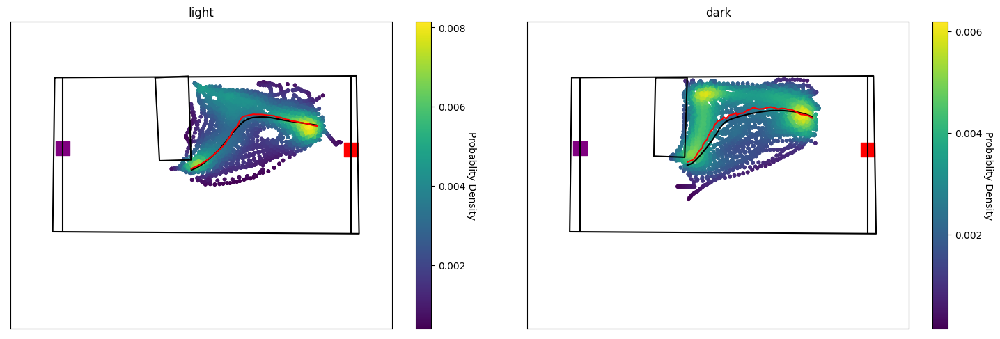

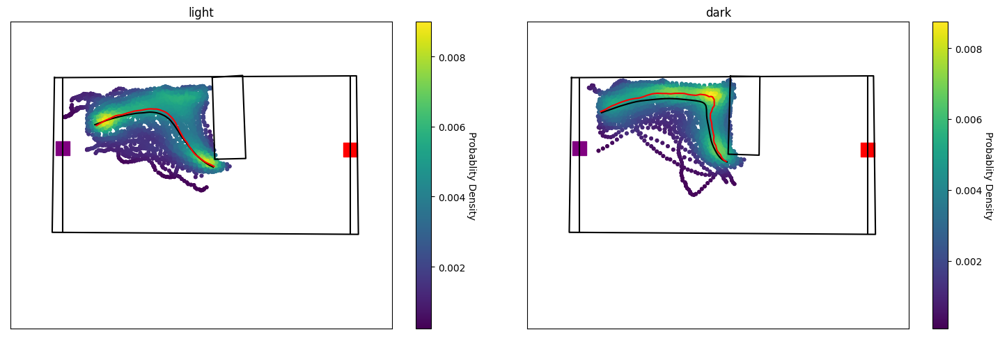

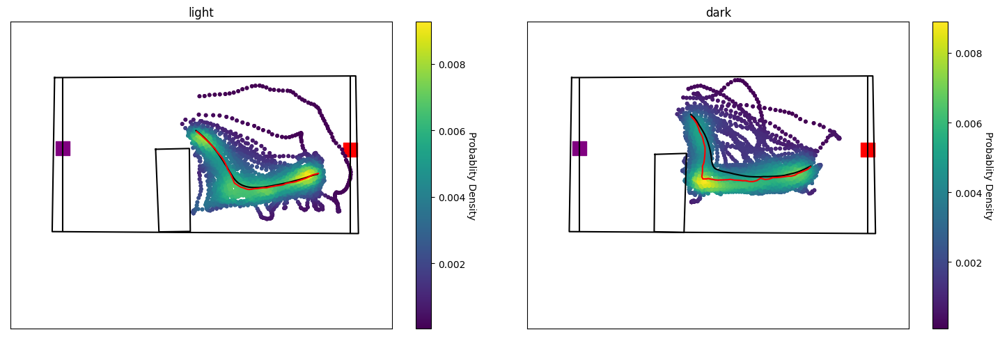

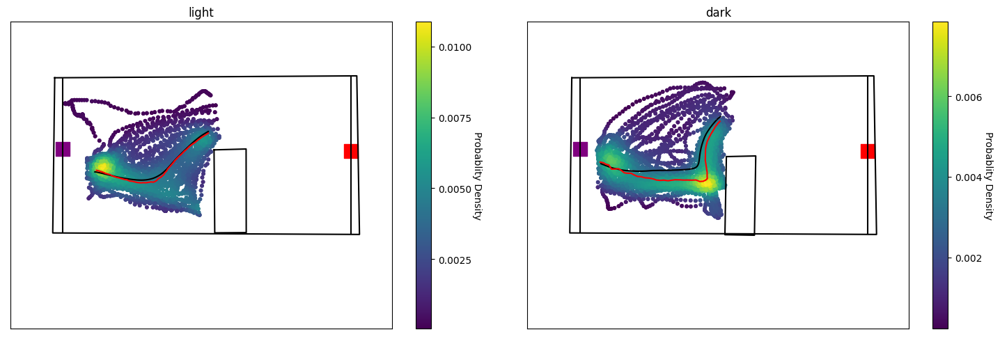

In [15]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)&(dark_long['distance_from_mean_center']<=2)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)&(oa_long['distance_from_mean_center']<=2)&(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5) )
    fig.tight_layout()
    ax[0].set_title('light')
    ax[1].set_title('dark')
    ax[0].set_xticks([])
    ax[0].set_yticks([]) 
    ax[1].set_xticks([])
    ax[1].set_yticks([]) 
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    elif i in [0]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=1)
    elif i in [1]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=.5)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    cbar1 = fig.colorbar(ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10))
    cbar1.ax.locator_params(nbins=5 )
    

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')
    cbar2= fig.colorbar(ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)) 
    cbar2.ax.locator_params(nbins=5 )
    cbar1.set_label('Probablity Density',rotation = 270, labelpad =6,verticalalignment='center')
    cbar2.set_label('Probablity Density',rotation = 270, labelpad =6,verticalalignment='center')

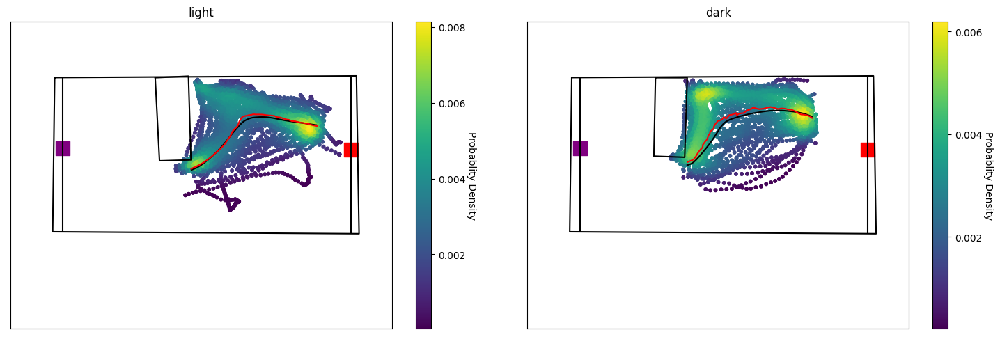

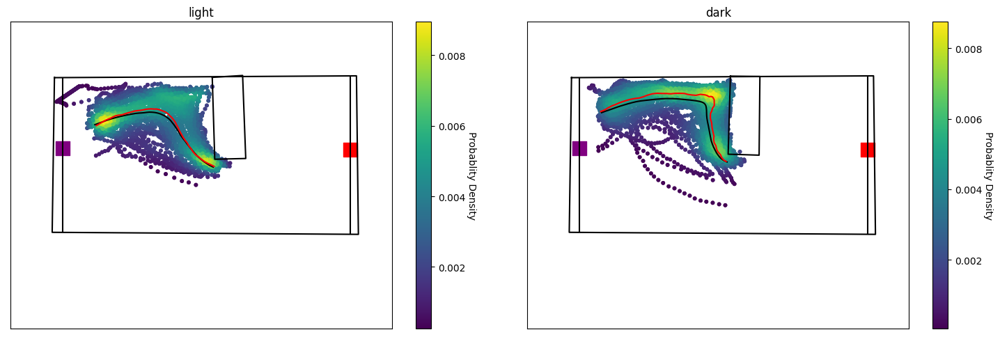

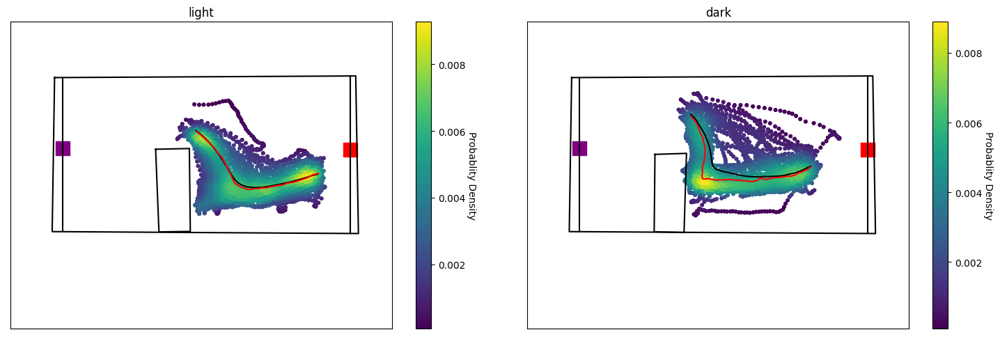

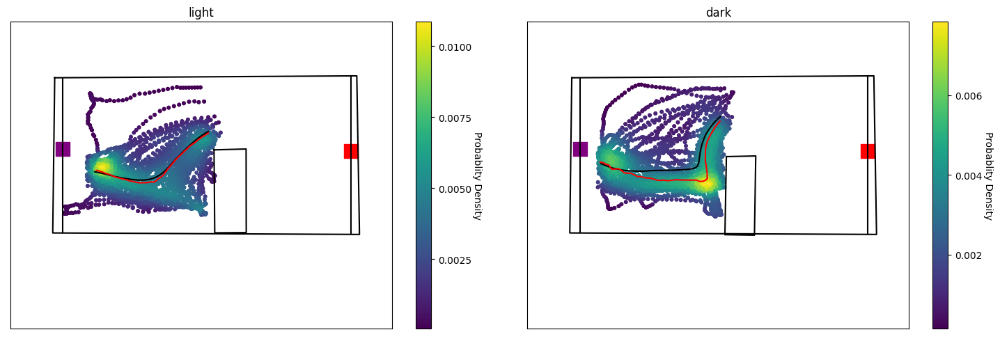

In [46]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)&(dark_long['distance_from_mean_center']<=2)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)&(oa_long['distance_from_mean_center']<=2)&(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5) )
    fig.tight_layout()
    ax[0].set_title('light')
    ax[1].set_title('dark')
    ax[0].set_xticks([])
    ax[0].set_yticks([]) 
    ax[1].set_xticks([])
    ax[1].set_yticks([]) 
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    elif i in [0]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=1)
    elif i in [1]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=.5)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    cbar1 = fig.colorbar(ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10))
    cbar1.ax.locator_params(nbins=5 )
    

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')
    cbar2= fig.colorbar(ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)) 
    cbar2.ax.locator_params(nbins=5 )
    cbar1.set_label('Probablity Density',rotation = 270, labelpad =6,verticalalignment='center')
    cbar2.set_label('Probablity Density',rotation = 270, labelpad =6,verticalalignment='center')

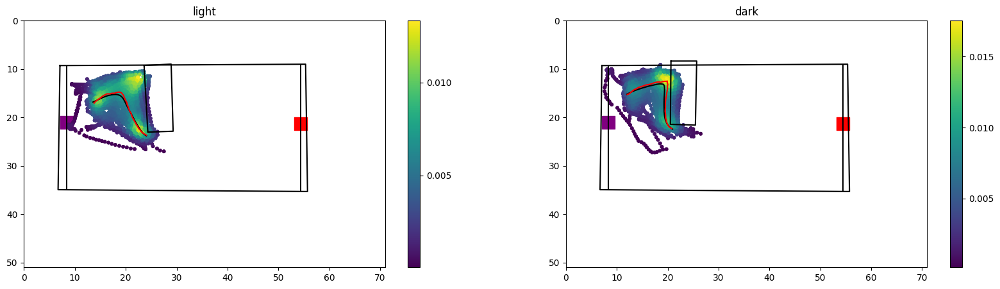

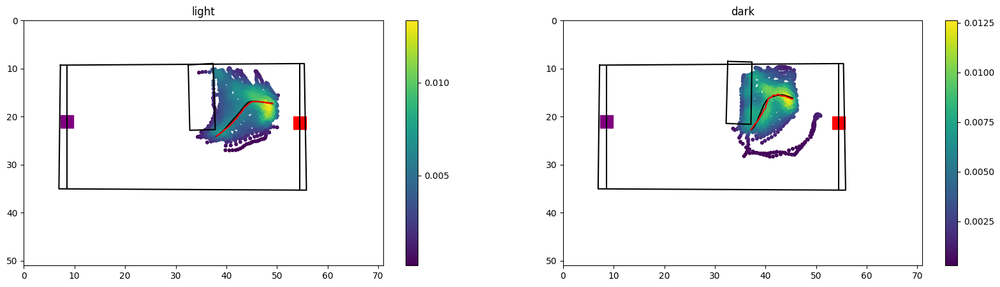

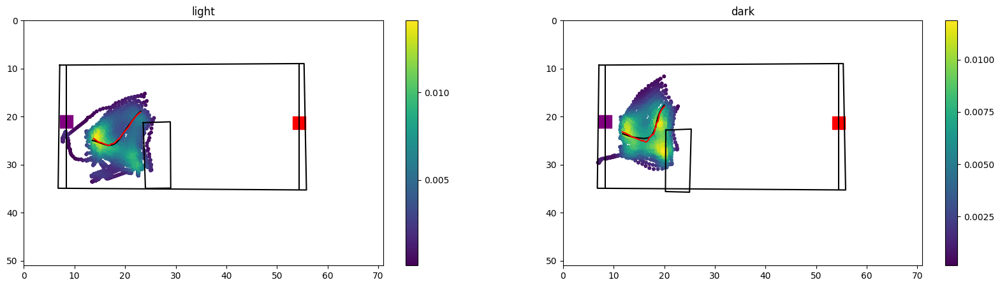

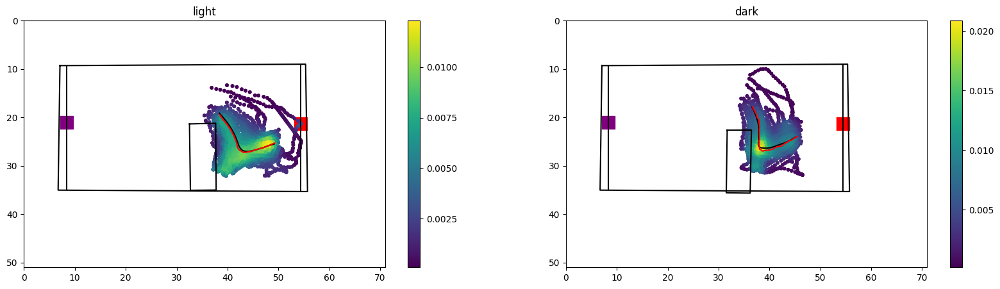

In [80]:
for i in oa_short.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_short[(dark_short['date']!='071323')&(dark_short['obstacle_cluster']==cluster)&(dark_short['distance_from_mean_center']<=3)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_short[(oa_short['obstacle_cluster']==cluster)&(oa_short['distance_from_mean_center']<=3)&(oa_short['date']!='072323')
    &(oa_short['date']!='072623')&(oa_short['date']!='072823')]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (20,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    cbar1 = fig.colorbar(ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10))
    cbar1.ax.locator_params(tight=True,nbins=5 )
    

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')
    cbar2= fig.colorbar(ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)) 
    cbar2.ax.locator_params(tight=True,nbins=5 )

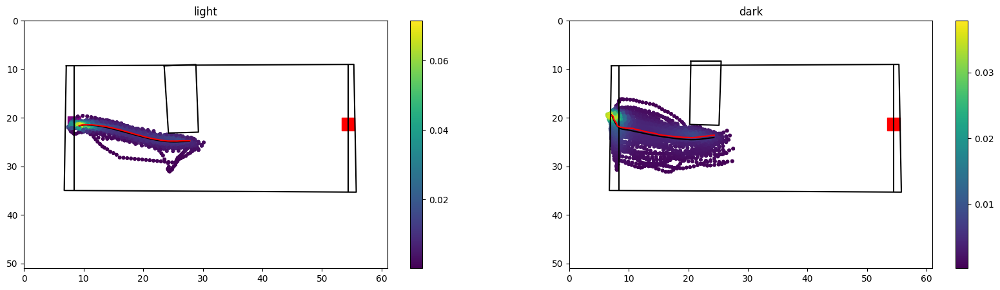

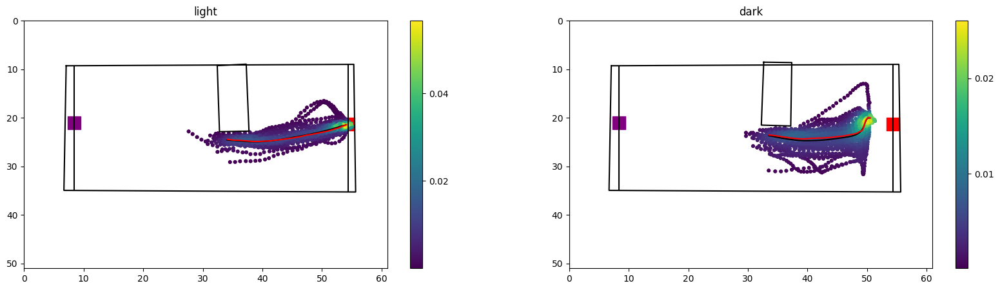

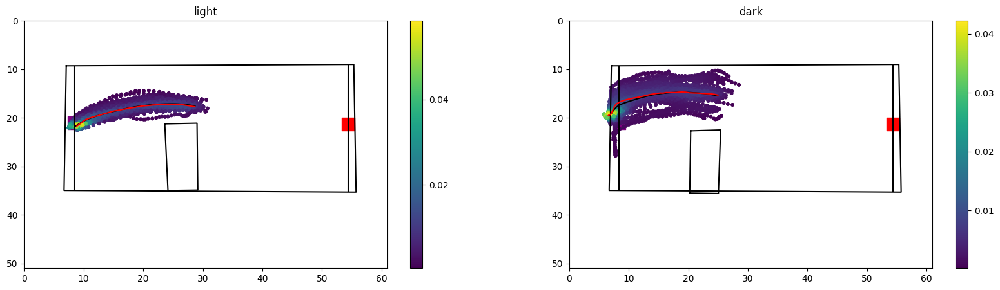

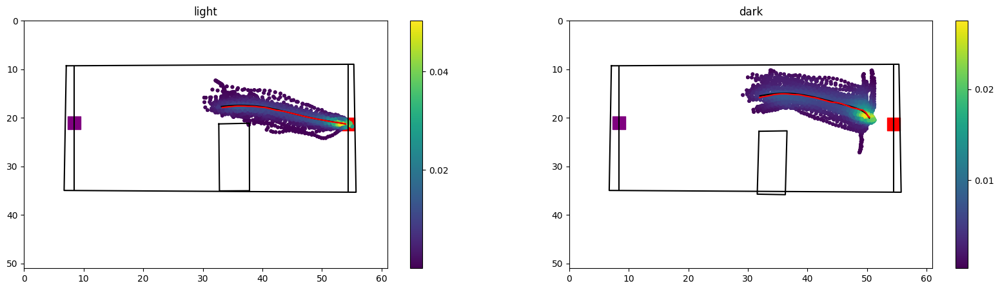

In [110]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)&(dark_long['distance_from_mean_center']<=3)]
    df_dark = drop_nans_in_columns(df_dark,'goal_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)&(oa_long['distance_from_mean_center']<=3)&(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
    df_light = drop_nans_in_columns(df_light,'goal_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (20,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'goal_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'goal_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'goal_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'goal_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.goal_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.goal_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    cbar1 = fig.colorbar(ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10))
    cbar1.ax.locator_params(tight=True,nbins=5 )
    

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.goal_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.goal_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')
    cbar2= fig.colorbar(ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)) 
    cbar2.ax.locator_params(tight=True,nbins=5 )

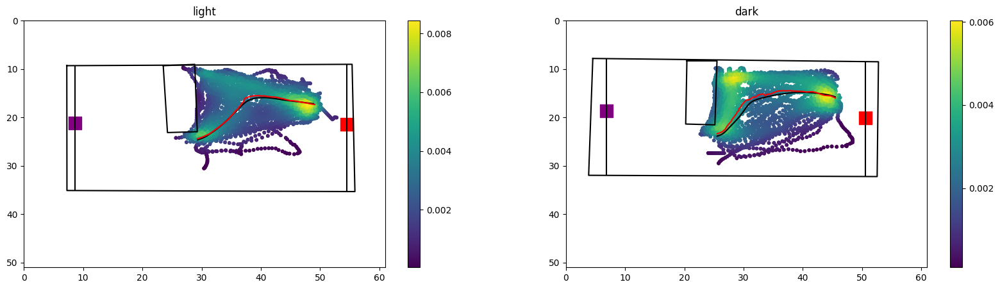

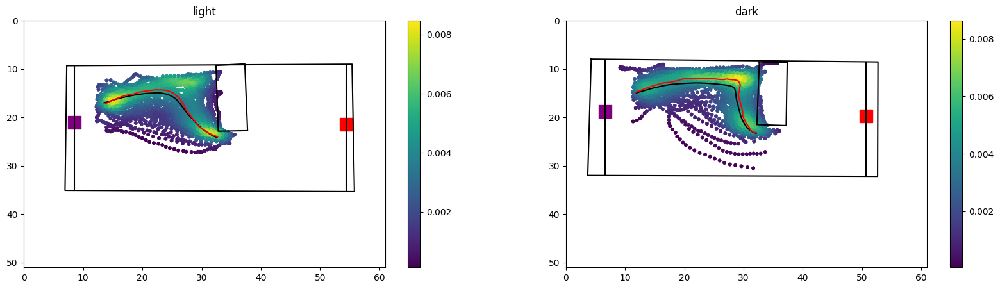

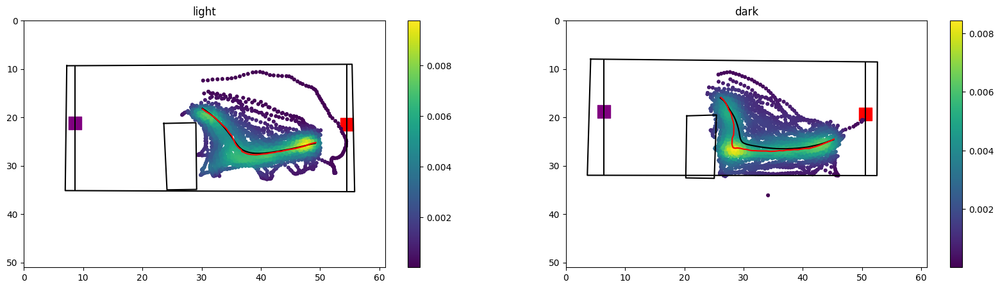

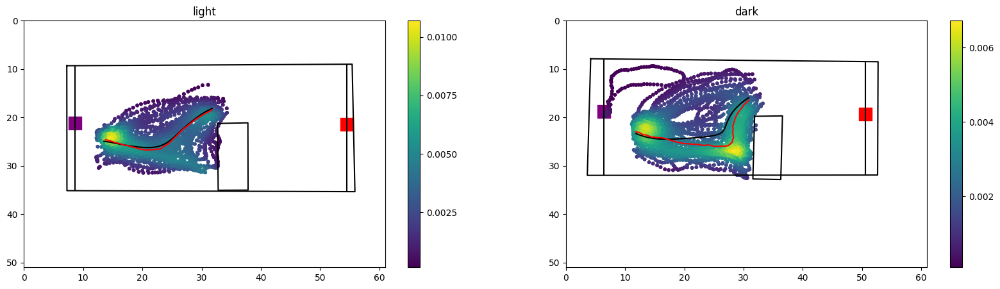

In [51]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)&(dark_long['distance_from_mean_center']<=3)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)&(oa_long['distance_from_mean_center']<=3)&(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (20,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(df_light,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(df_dark,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    cbar1 = fig.colorbar(ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10))
    cbar1.ax.locator_params(tight=True,nbins=5 )
    

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')
    cbar2= fig.colorbar(ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)) 
    cbar2.ax.locator_params(tight=True,nbins=5 )

In [ ]:
list_columns()

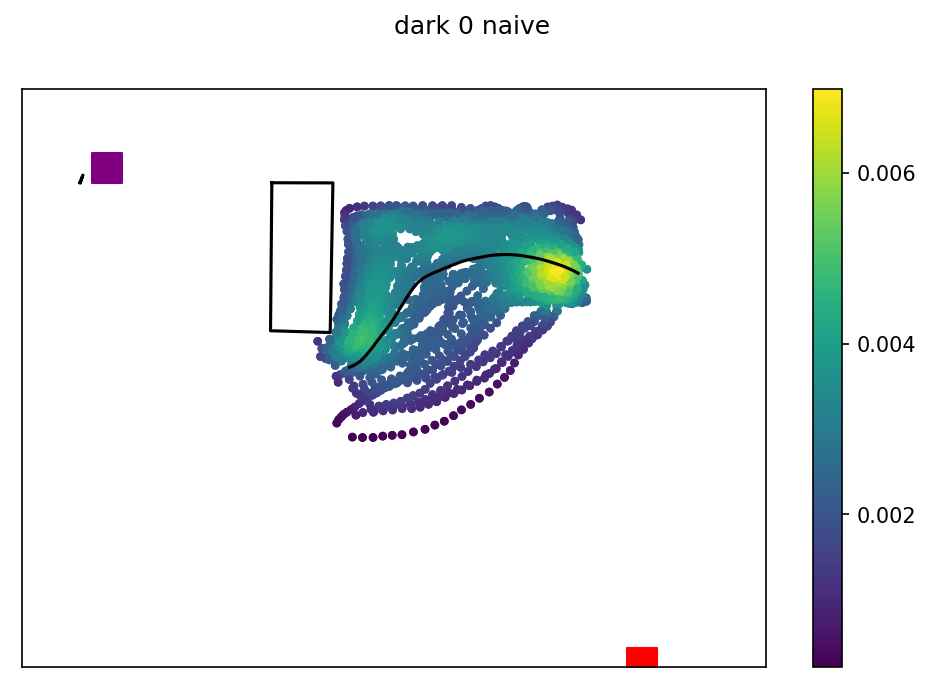

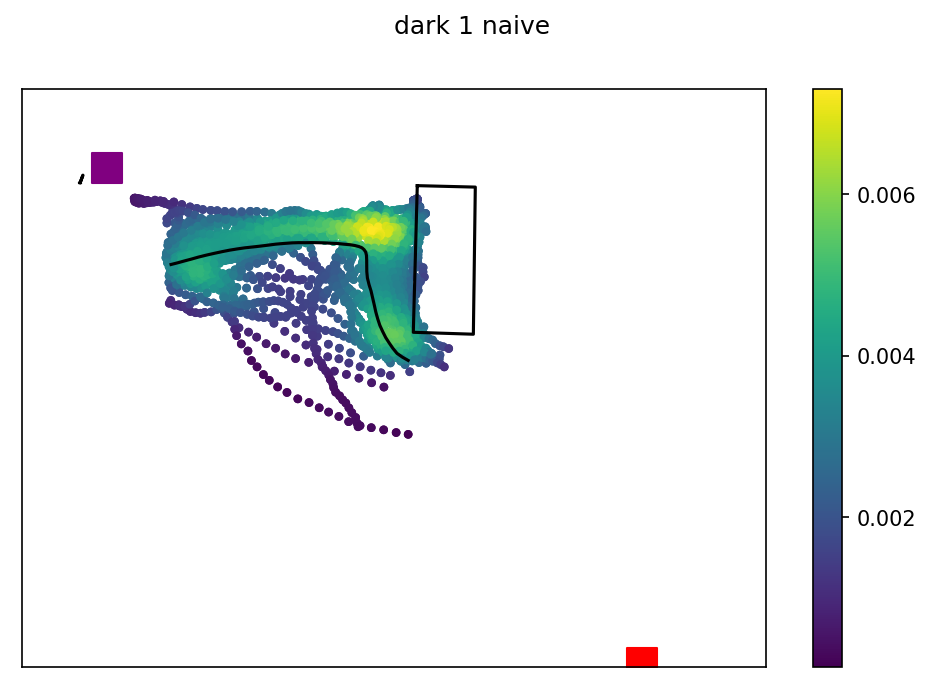

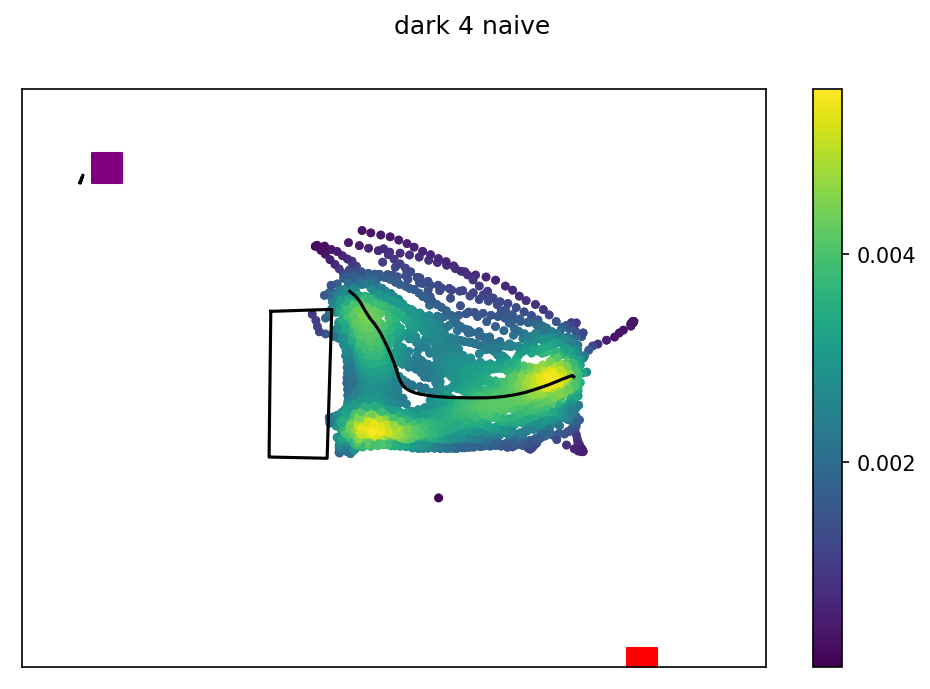

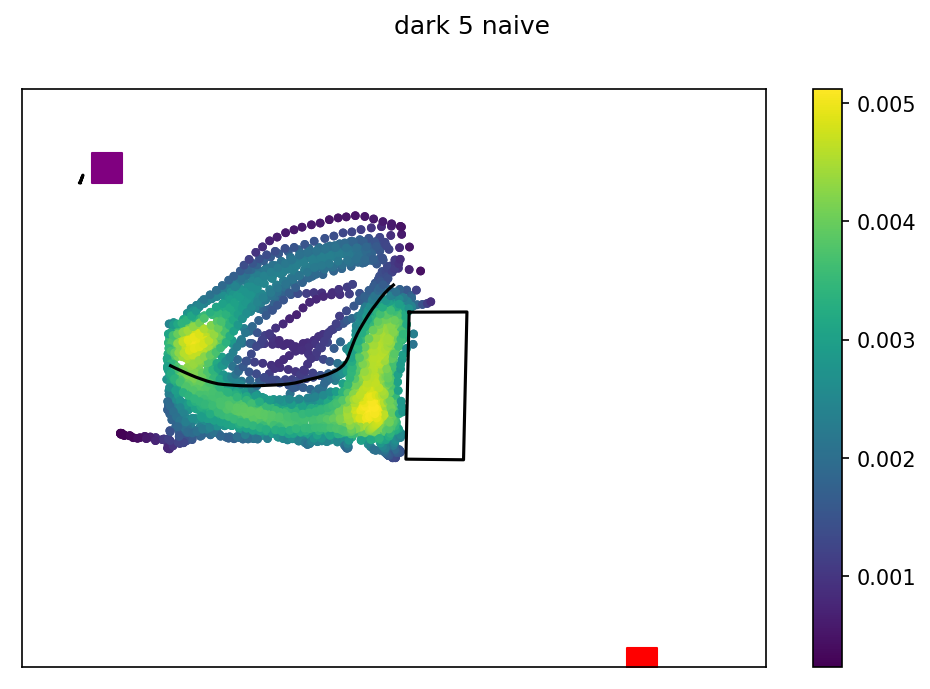

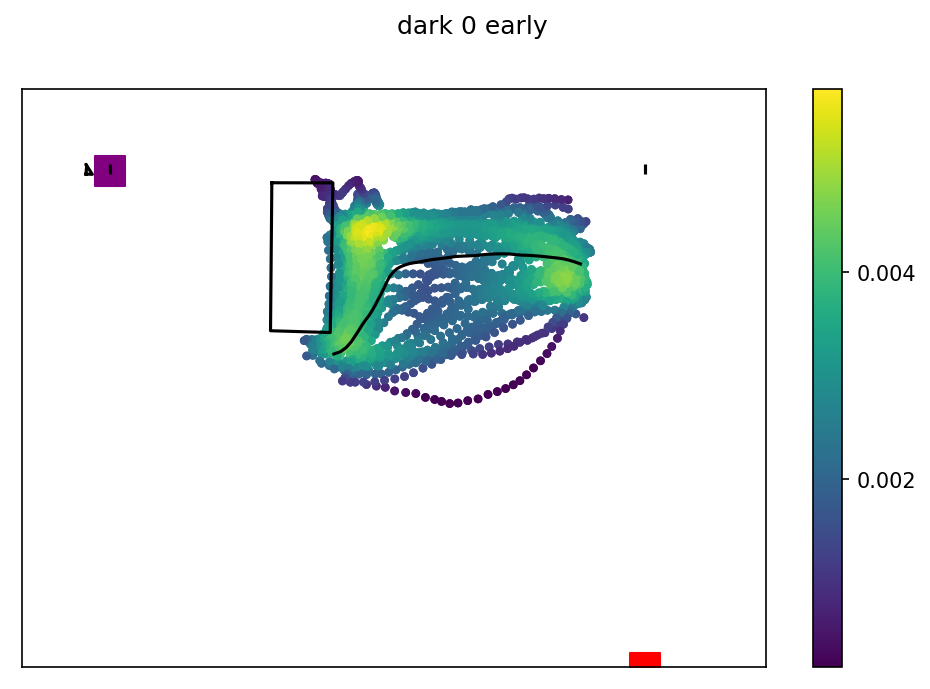

...

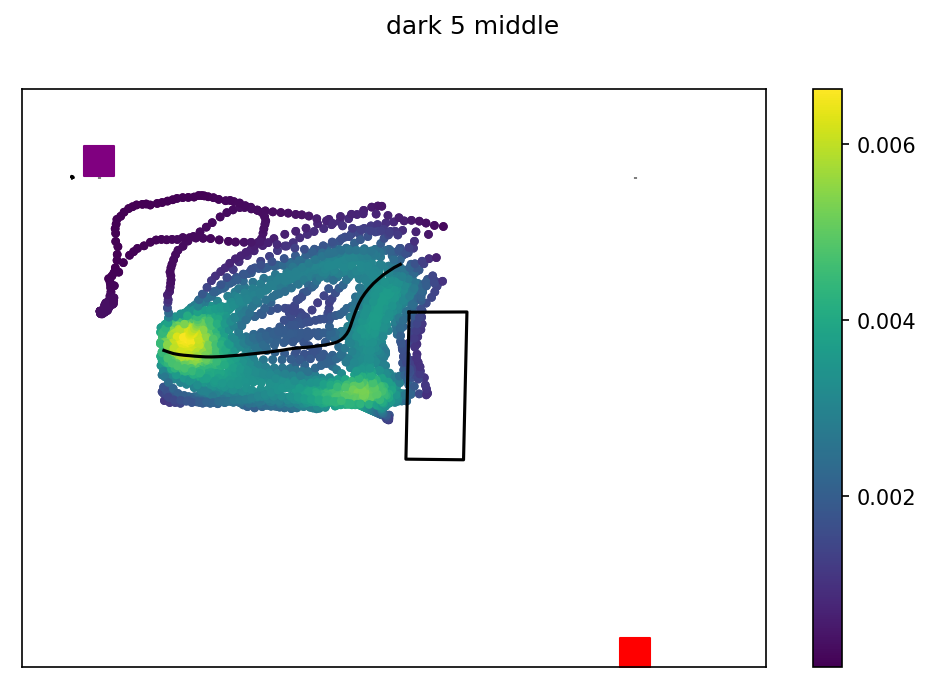

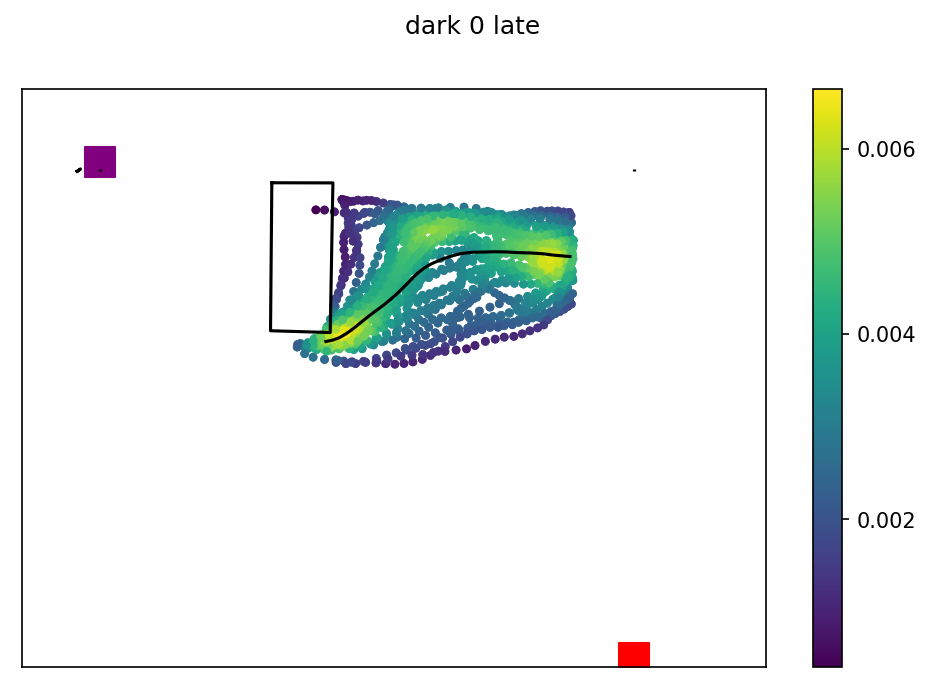

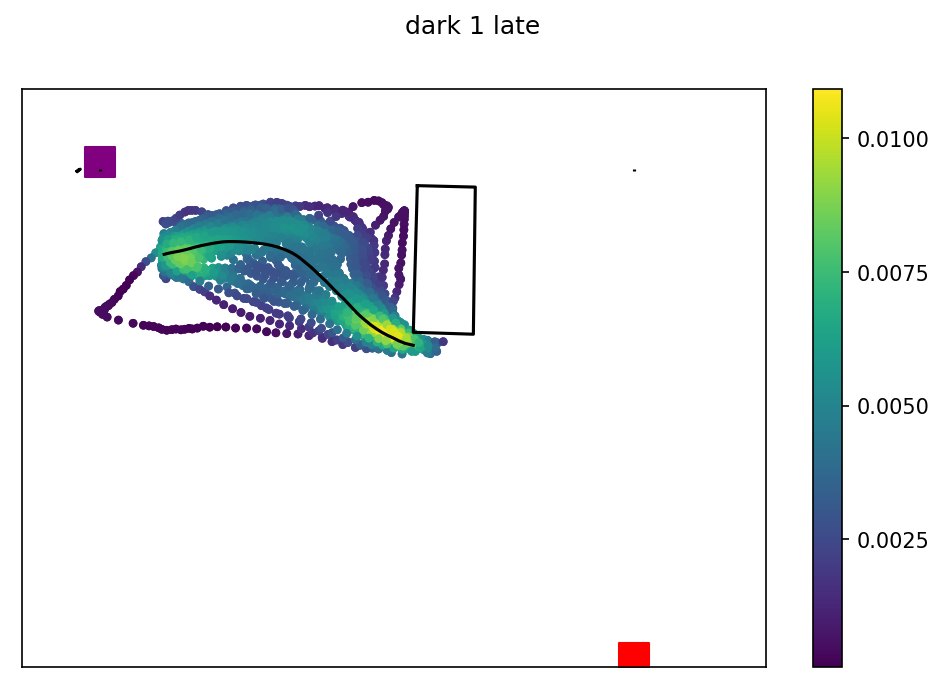

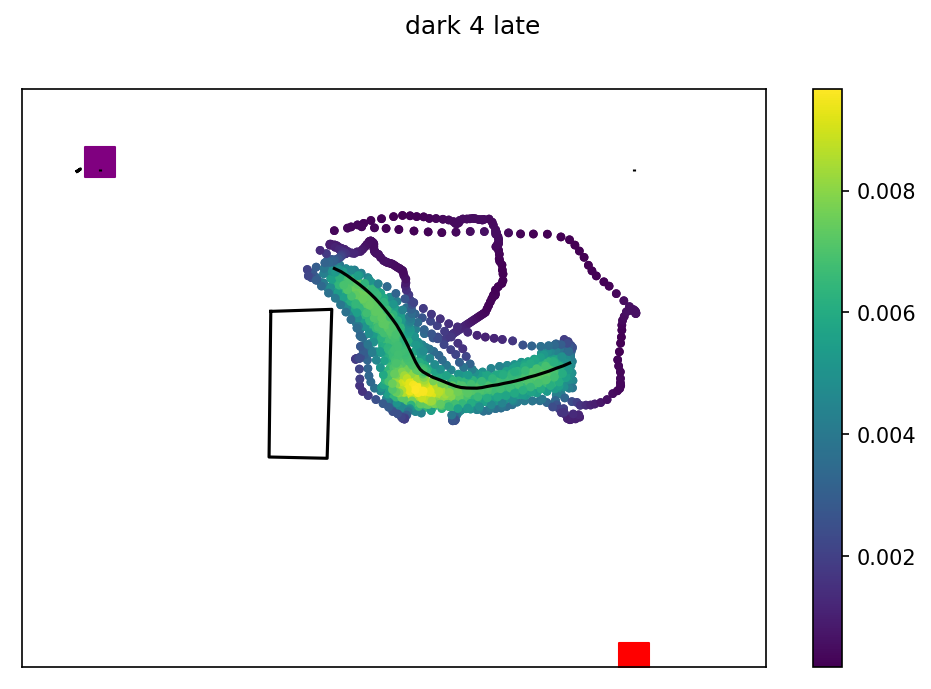

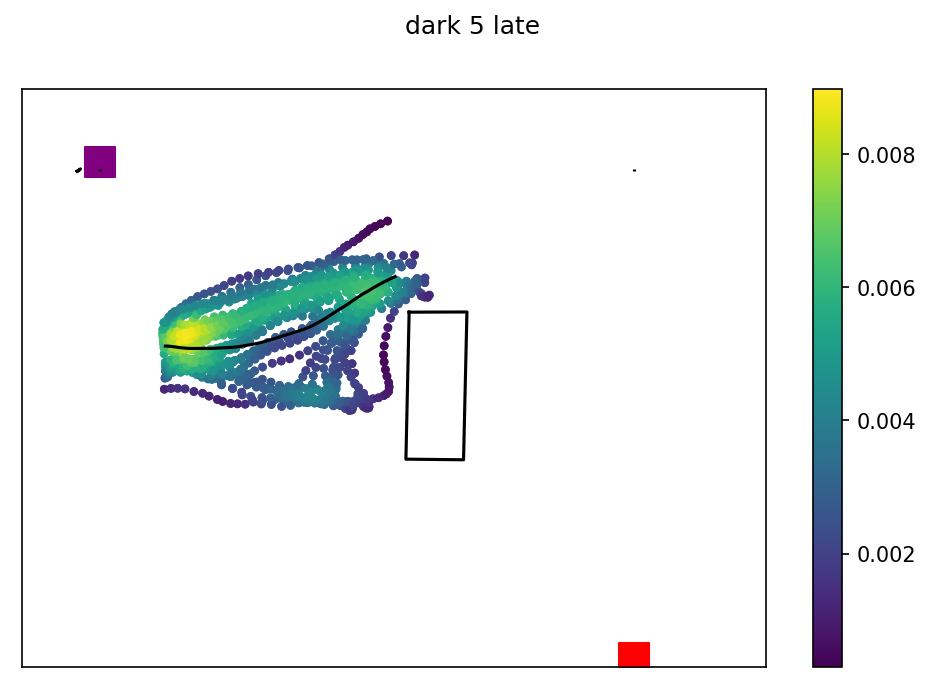

In [55]:
df = drop_nans_in_columns(dark_long,'skill')
for skill in df.skill.unique():
    for i in df.obstacle_cluster.unique():
        data = df[(df['obstacle_cluster']==i)&(df['skill']==skill)]
        df_sample = data
        fig,ax = plt.subplots(figsize = (8,5),dpi=150)
        plot_arena_single(data ,ax,obstacle = False)
        plot_obstacle(data,ax,i)
        

        interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
        interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
        x_sample = interpolate_array(flatten_list_of_arrays(df_sample.obstacle_nose_x.to_list()))
        y_sample = interpolate_array(flatten_list_of_arrays(df_sample.obstacle_nose_y.to_list()))
        xy_sample = np.vstack([x_sample,y_sample])
        fig.suptitle('dark ' + str(i) + ' ' + str(skill))
        #ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
        #ax[0].plot(interp_x,interp_y)
        x = interpolate_array(matx.flatten())
        y = interpolate_array(maty.flatten())
        xy = np.vstack([x,y])
        z = gaussian_kde(xy)(xy_sample)

        ax.scatter(x_sample, y_sample, c=z, s=10)
        ax.plot(interp_x,interp_y,c = 'black')
        cbar1 = fig.colorbar(ax.scatter(x_sample, y_sample, c=z, s=10))
        cbar1.ax.locator_params(nbins=5 )
        ax.set_xticks([])
        ax.set_yticks([])

In [ ]:
for i in ow_oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = ow_dark_long[(ow_dark_long['date']!='071323')&(ow_dark_long['obstacle_cluster']==cluster)&(ow_dark_long['distance_from_mean_center']<=3)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(25)
    df_light = ow_oa_long[(ow_oa_long['obstacle_cluster']==cluster)&(ow_oa_long['distance_from_mean_center']<=3)&(ow_oa_long['date']!='072323')
    &(ow_oa_long['date']!='072623')&(ow_oa_long['date']!='072823')]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(25)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (20,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    cbar1 = fig.colorbar(ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10))
    cbar1.ax.locator_params(tight=True,nbins=5 )
    

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')
    cbar2= fig.colorbar(ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)) 
    cbar2.ax.locator_params(tight=True,nbins=5 )

In [ ]:
for i in ns_oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = ns_dark_long[(ns_dark_long['date']!='071323')&(ns_dark_long['obstacle_cluster']==cluster)&(ns_dark_long['distance_from_mean_center']<=2)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = ns_oa_long[(ns_oa_long['obstacle_cluster']==cluster)&(ns_oa_long['distance_from_mean_center']<=2)]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'goal_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'goal_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'goal_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'goal_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.goal_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.goal_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.goal_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.goal_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

In [ ]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)&(dark_long['distance_from_mean_center']<=2)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)&(oa_long['distance_from_mean_center']<=2)]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(df_light,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    if i in [4,5]:
        plot_orginal_obstacle(df_dark,ax[1],i,correct=True,corect_y=3)
    else:
         plot_orginal_obstacle(df_dark,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'goal_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'goal_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'goal_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'goal_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.goal_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.goal_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.goal_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.goal_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

In [ ]:
oa_long.

In [ ]:
test = dark[dark.distance_from_mean_center<=3]
plot_trials_sample(test,50)

In [ ]:
test = light[light.distance_from_mean_center<=2]
plot_trials_sample(test,50)

In [ ]:
df = pd.concat([dark_long])
gt_label = df['obstacle_cluster'].astype(int).tolist()
#create obstacle_xypos array 
obstacle_xpos = np.array(df.loc[:,'gt_obstacle_cen_x_cm'])
obstacle_ypos = np.array(df.loc[:,'gt_obstacle_cen_y_cm'])
obstacle_xypos_ar = np.stack((obstacle_xpos, obstacle_ypos))
plt.figure()
for i in range(len(df['obstacle_cluster'])):
    obstacle_xypos = obstacle_xypos_ar[:,i] 
    plt.plot(obstacle_xypos[0], obstacle_xypos[1], '*', color=list(mcolors.TABLEAU_COLORS)[gt_label[i]])
    plt.ylim([52,0]); plt.xlim([0, 72])

In [ ]:
get_ob_distance_from_mean_center(light)

In [ ]:
df = pd.concat([light,dark])
df['mean_center'] = np.nan

In [ ]:
df.gt_obstacle_cen_x_cm

In [ ]:
def get_ob_distance_from_mean_center(df):
    df['mean_center_x'] = np.nan
    df['mean_center_y'] = np.nan
    for cluster,cluter_df in df.groupby(['obstacle_cluster']):
        gt_label = cluter_df['obstacle_cluster'].astype(int).tolist()
        obstacle_xpos = np.array(cluter_df.loc[:,'gt_obstacle_cen_x_cm'])
        obstacle_ypos = np.array(cluter_df.loc[:,'gt_obstacle_cen_y_cm'])
        obstacle_xypos_ar = np.stack((obstacle_xpos, obstacle_ypos))
        mean_x =np.nanmean(obstacle_xpos)
        mean_y = np.nanmean(obstacle_ypos)
        df['mean_center_x'][df['obstacle_cluster']==cluster]  = mean_x
        df['mean_center_y'][df['obstacle_cluster']==cluster]  = mean_y
    for ind,row in df.iterrows():
        distance_from_mean_center = calculate_distances(np.array(row.gt_obstacle_cen_x_cm),
                                                        np.array(row.gt_obstacle_cen_y_cm),row.mean_center_x,row.mean_center_y)
        df.at[ind,'distance_from_mean_center'] = distance_from_mean_center

In [ ]:
df = dark
df['mean_center_x'] = np.nan
df['mean_center_y'] = np.nan
for cluster,cluter_df in df.groupby(['obstacle_cluster']):
    gt_label = cluter_df['obstacle_cluster'].astype(int).tolist()
    obstacle_xpos = np.array(cluter_df.loc[:,'gt_obstacle_cen_x_cm'])
    obstacle_ypos = np.array(cluter_df.loc[:,'gt_obstacle_cen_y_cm'])
    obstacle_xypos_ar = np.stack((obstacle_xpos, obstacle_ypos))
    mean_x =np.nanmean(obstacle_xpos)
    mean_y = np.nanmean(obstacle_ypos)
    df['mean_center_x'][df['obstacle_cluster']==cluster]  = mean_x
    df['mean_center_y'][df['obstacle_cluster']==cluster]  = mean_y
for ind,row in df.iterrows():
    distance_from_mean_center = calculate_distances(np.array(row.gt_obstacle_cen_x_cm),
                                                    np.array(row.gt_obstacle_cen_y_cm),row.mean_center_x,row.mean_center_y)
    df.at[ind,'distance_from_mean_center'] = distance_from_mean_center

In [ ]:
std_error_obstacle = np.nanstd(goal_array,axis=0)
ax[1,1].fill_between(xnew, 
np.nanmean(goal_array,axis = 0)-std_error_obstacle, 
np.nanmean(goal_array,axis = 0)+std_error_obstacle,) 

In [ ]:
df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==4)]

df_light = oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')&(oa_long['obstacle_cluster']==4)]
data = pd.concat([df_dark,df_light])
data = drop_nans_in_columns(data,'obstacle_devations')

In [ ]:
dark_long.date.unique

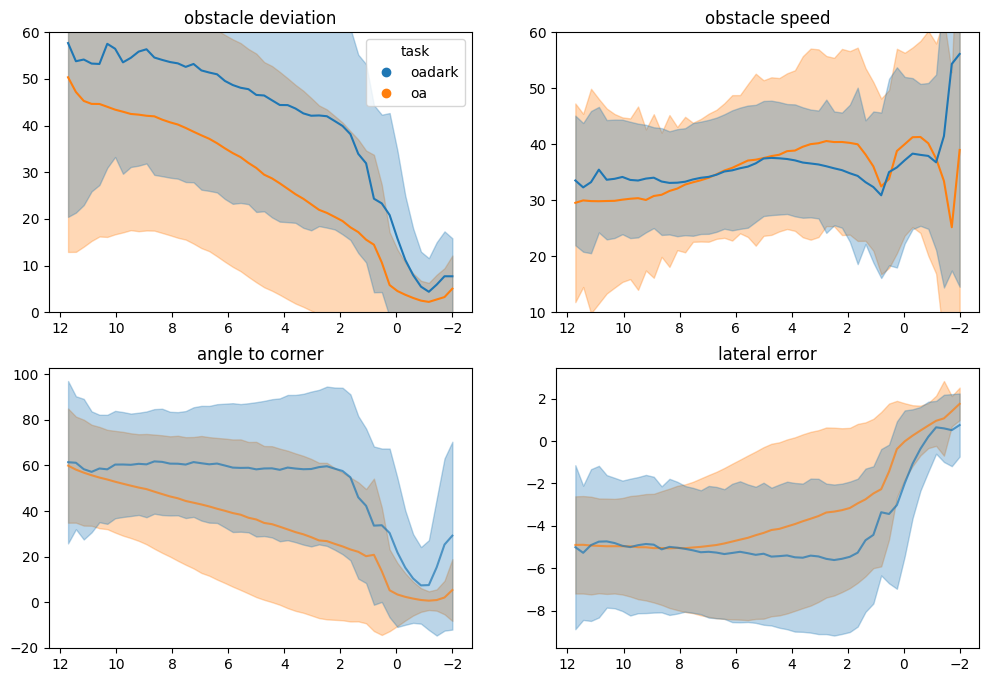

In [48]:
df_dark = dark_short[(dark_short['date']!='071323')]

df_light = oa_short[(oa_short['date']!='072323')
    &(oa_short['date']!='072623')&(oa_short['date']!='072823')]
data = pd.concat([df_dark,df_light])

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')

#data = drop_nans_in_columns(data,'skill')
#oa_short[oa_short['animal']!=[i for i in oa_short.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 12, .28)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    std_error_obstacle = np.nanstd(dev_array,axis=0)
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_obstacle, 
    date_dev+std_error_obstacle,color =color,alpha = .3) 
    



#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)
    std_error_obstacle = np.nanstd(speed_array,axis=0)
    ax[0,1].fill_between(xnew, 
    date_speed-std_error_obstacle, 
    date_speed+std_error_obstacle,color =color,alpha = .3) 

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)
    std_error_obstacle = np.nanstd(angle_array,axis=0)
    ax[1,0].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color =color,alpha = .3) 


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)
    std_error_obstacle = np.nanstd(angle_array,axis=0)
    ax[1,1].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color =color,alpha = .3) 

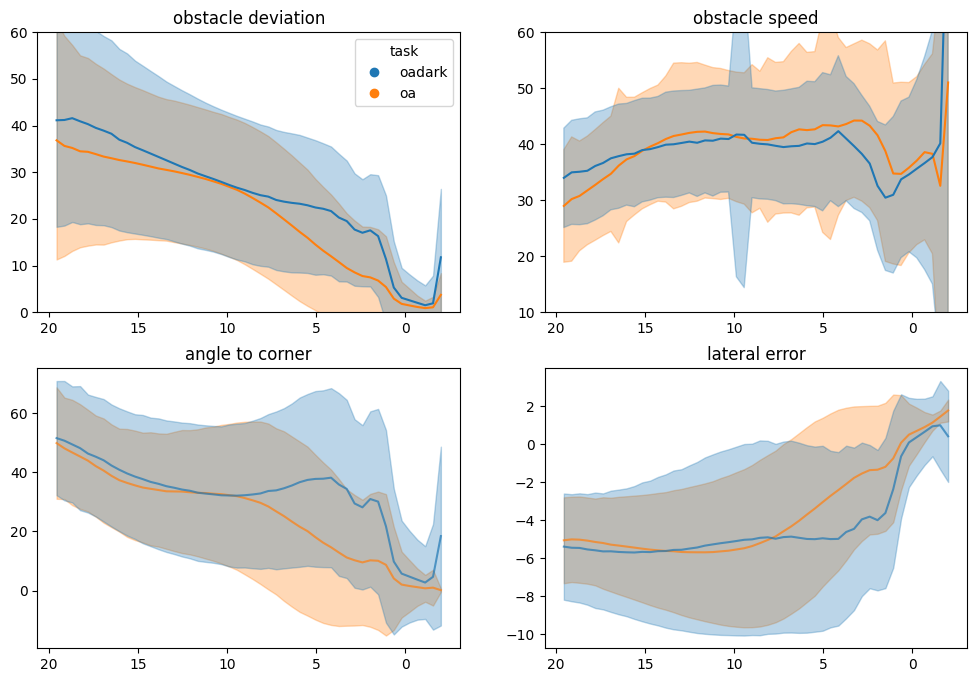

In [76]:
df_dark = dark_long[(dark_long['date']!='071323')]

df_light = oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
data = pd.concat([df_dark,df_light])

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    std_error_obstacle = np.nanstd(dev_array,axis=0)
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_obstacle, 
    date_dev+std_error_obstacle,color =color,alpha = .3) 
    



#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)
    std_error_obstacle = np.nanstd(speed_array,axis=0)
    ax[0,1].fill_between(xnew, 
    date_speed-std_error_obstacle, 
    date_speed+std_error_obstacle,color =color,alpha = .3) 

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)
    std_error_obstacle = np.nanstd(angle_array,axis=0)
    ax[1,0].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color =color,alpha = .3) 


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)
    std_error_obstacle = np.nanstd(angle_array,axis=0)
    ax[1,1].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color =color,alpha = .3) 

In [44]:
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    samples_array =  np.empty(date_dev.shape)
    samples_array[:] =np.nan
    std_error_obstacle = np.nanstd(date_dev,axis=0)
    #for i in list(range(len(samples_array))):
    #    samples_array[i]= np.sqrt(date_dev.T[i][~np.isnan(date_dev.T[i])].shape[0])
    #std_error_obstacle = std_error_obstacle/samples_array
    #ax[0,0].fill_between(xnew, 
    #date_dev-std_error_obstacle, 
    #date_dev+std_error_obstacle,color =color,alpha = .3) 

In [92]:
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    samples_array =  np.empty(dev_array.shape)
    samples_array[:] =np.nan
    std_error_obstacle = np.nanstd(dev_array,axis=0)
    for i in list(range(len(samples_array))):
        samples_array[i]= np.sqrt(dev_array.T[i][~np.isnan(dev_array.T[i])].shape[0])
    std_error_obstacle = std_error_obstacle/samples_array
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_obstacle, 
    date_dev+std_error_obstacle,color =color,alpha = .3) 

IndexError: index 50 is out of bounds for axis 0 with size 50

In [96]:
dark_long[(dark_long['date']!='071323')]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,ts_head_body_angle,mean_center_x,mean_center_y,distance_from_mean_center,ts_lateral_error_to_target_port,ob_tortuosity_10,ob_linearity_10,percent_change_ob_tortuosity_10,percent_change_ob_linearity_10,skill
49,54,62,65087.872499,65090.281088,"[65087.887705, 65087.904448, 65087.921984, 650...","[[10878, 10879, 10880, 10881, 10882, 10883, 10...","[678.2339477539062, 678.366943359375, 678.2045...","[276.7120056152344, 276.9984436035156, 276.189...","[664.118896484375, 664.8569946289062, 665.8886...","[272.12457275390625, 271.18548583984375, 271.4...",...,"[178.37307043268987, 176.84967681907116, 178.1...",22.961090,14.840085,3.043319,"[5.169434530875863, 5.720023532900823, 6.25207...",1.213196,0.824269,-21.367823,12.343643,naive
53,58,66,65097.199846,65099.960704,"[65097.207782, 65097.224345, 65097.240947, 650...","[[11437, 11438, 11439, 11440, 11441, 11442, 11...","[678.9861450195312, 679.6188354492188, 681.046...","[277.9176330566406, 279.289306640625, 280.8138...","[664.2655029296875, 665.99169921875, 666.56518...","[271.77880859375, 270.9521179199219, 271.41848...",...,"[165.50981903663984, 171.20779627145728, 168.8...",22.961090,14.840085,3.044505,"[2.451677606873556, 2.9797013363482083, 3.3407...",1.080670,0.925352,-36.965942,23.585328,naive
54,59,68,65105.384243,65107.653619,"[65105.393574, 65105.410547, 65105.427865, 651...","[[11928, 11929, 11930, 11931, 11932, 11933, 11...","[678.6814575195312, 679.3626708984375, 679.288...","[277.408447265625, 276.91046142578125, 277.014...","[667.6397705078125, 668.9232177734375, 669.221...","[268.30743408203125, 267.869140625, 267.996795...",...,"[162.9722040898211, 164.15168471834355, 169.84...",22.961090,14.840085,3.065702,"[4.470938548481234, 5.098224167772361, 5.63484...",1.017970,0.982348,-19.369887,15.703932,naive
102,111,126,65250.034355,65252.934464,"[65250.043571, 65250.060441, 65250.078195, 652...","[[20604, 20605, 20606, 20607, 20608, 20609, 20...","[675.2449340820312, 677.4585571289062, 677.907...","[274.2185363769531, 276.8466491699219, 277.667...","[659.5665893554688, 662.8560791015625, 663.970...","[272.2059631347656, 271.63519287109375, 271.34...",...,"[165.11865354502515, 169.21089289651806, 169.5...",22.961090,14.840085,1.743232,"[1.167535427197361, 1.4701561050278222, 1.9456...",1.312191,0.762084,-39.548925,17.649439,naive
104,113,128,65254.802496,65257.100441,"[65254.811904, 65254.82967, 65254.845337, 6525...","[[20890, 20891, 20892, 20893, 20894, 20895, 20...","[678.9105224609375, 679.2843627929688, 679.790...","[279.708984375, 279.2736511230469, 279.5119018...","[668.1917114257812, 668.8549194335938, 669.192...","[269.84759521484375, 269.7736511230469, 269.70...",...,"[171.89422385734414, 167.95713502211964, 167.5...",22.961090,14.840085,1.736308,"[7.343665242854655, 7.779919578405352, 8.19926...",1.342545,0.744854,-0.529189,0.292445,naive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2783,52,59,58284.241510,58286.769433,"[58284.250803, 58284.267686, 58284.284518, 582...","[10663, 10664, 10665, 10666, 10667, 10668, 106...","[87.75959014892578, 86.99541473388672, 86.5253...","[260.9606018066406, 261.192138671875, 260.8676...","[101.29974365234375, 99.75284576416016, 98.431...","[256.0437316894531, 256.8573913574219, 257.122...",...,"[148.99701958135583, 153.86807991700607, 158.1...",33.950149,26.215164,2.654083,"[4.521980946107469, 4.973358234864445, 5.44476...",1.406920,0.710772,-10.944782,5.130184,middle
2786,55,65,58310.359923,58312.854592,"[58310.360256, 58310.376601, 58310.39406, 5831...","[12229, 12230, 12231, 12232, 12233, 12234, 122...","[86.841064453125, 86.9388427734375, 86.4898529...","[257.9836730957031, 258.0146179199219, 257.881...","[104.91130065917969, 103.79759979248047, 102.6...","[253.5960235595703, 253.80740356445312, 254.47...",...,"[146.52039055943388, 151.5578265761529, 157.42...",33.950149,2

In [95]:
oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,skill,ts_head_body_angle,mean_center_x,mean_center_y,distance_from_mean_center,ts_lateral_error_to_target_port,ob_tortuosity_10,ob_linearity_10,percent_change_ob_tortuosity_10,percent_change_ob_linearity_10
18,19,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,naive,"[157.03191035768336, 160.6752657827071, 155.26...",25.643248,15.862820,0.997439,"[7.053168420527934, 7.313772759461646, 7.51374...",1.166560,0.857221,-48.186364,25.058111
29,30,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,naive,"[100.49752401897445, 111.18866325786432, 132.7...",25.643248,15.862820,1.033280,"[5.418002339556118, 5.666461405809718, 5.77270...",1.008053,0.992011,-64.792768,38.813956
40,41,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,naive,"[133.78762360590784, 131.58603159981288, 136.6...",25.643248,15.862820,0.496675,"[0.6689760986460023, 0.6631478828115931, 0.663...",1.032358,0.968656,-79.217029,42.056934
42,43,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,naive,"[154.00533502169654, 152.60534413942756, 155.6...",25.643248,15.862820,0.474120,"[6.982522017137882, 7.137387559696453, 7.30714...",1.086644,0.920264,1.050195,-0.898076
55,56,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,naive,"[146.88197706409758, 152.67478768193592, 154.4...",25.643248,15.862820,0.487887,"[7.168966925752924, 7.251540813091665, 7.29835...",1.618867,0.617716,6.654267,-2.647932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9566,98,104.0,52597.282777,52599.621696,"[52597.298764, 52597.314688, 52597.331225, 525...","[15768, 15769, 15770, 15771, 15772, 15773, 157...","[116.65120697021484, 115.97724914550781, 115.1...","[280.4170227050781, 280.15838623046875, 279.86...","[130.9514923095703, 128.7559051513672, 127.534...","[275.4634704589844, 274.94384765625, 274.00384...",...,NaN,"[142.56689475639206, 143.6837180531536, 143.36...",35.034987,27.467456,1.236278,"[5.334744835616682, 5.518331392744937, 5.59109...",1.416700,0.705866,-5.173145,2.486697
9568,100,108.0,52615.945587,52619.464422,"[52615.954342, 52615.971123, 52615.98839, 5261...","[16887, 16888, 16889, 16890, 16891, 16892, 168...","[115.83245849609375, nan, nan, nan, nan, nan, ...","[279.62969970703125, nan, nan, nan, nan, nan, ...","[128.25897216796875, 126.95210266113281, 126.1...","[274.4521789550781, 274.6102294921875, 274.143...",...,NaN,"[105.79679075716456, 102.04955136943693, 99.19...",35

In [189]:
ax.shape.reshape(-1)

AttributeError: 'tuple' object has no attribute 'reshape'

In [1]:
df_dark = dark_long[(dark_long['date']!='071323')]

df_light = oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')].sample(500)
data = pd.concat([df_dark,df_light])

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(14,10))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('Deviation angle')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')
ax[0,0].set(ylabel = 'Degrees')

ax[0,1].set_title('Speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)
ax[0,1].set(ylabel = 'cm/sec^-1')


ax[1,0].set_title('Angle to edge')
ax[1,0].set_ylim(0,90)
ax[1,0].invert_xaxis()
ax[1,0].set(ylabel = 'Degrees')

ax[1,1].set_title('Lateral error')
ax[1,1].invert_xaxis()
ax[1,1].set(ylabel = 'cm')

for subplot in ax.reshape(-1):
    subplot.yaxis.set_major_locator(plt.MaxNLocator(5))
    subplot.set(xlabel = 'Distance to obstacle (cm)')






by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    #ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    samples_array =  np.empty(dev_array.T.shape[0])
    samples_array[:] =np.nan
    std_deveation_obstacle = np.nanstd(dev_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(dev_array.T[i][~np.isnan(dev_array.T[i])].shape[0])
    std_error_obstacle = std_deveation_obstacle/samples_array
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_obstacle, 
    date_dev+std_error_obstacle,color ='red',alpha = .5)  

    ax[0,0].fill_between(xnew, 
    date_dev-std_deveation_obstacle, 
    date_dev+std_deveation_obstacle,color =color,alpha = .3)  

     
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    



#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)

    #ax[0,0].plot(xnew,date_speed,c = color,alpha = 1)
    samples_array =  np.empty(speed_array.T.shape[0])
    samples_array[:] =np.nan
    std_speedeation_obstacle = np.nanstd(speed_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(speed_array.T[i][~np.isnan(speed_array.T[i])].shape[0])
    std_error_obstacle = std_speedeation_obstacle/samples_array
    ax[0,1].fill_between(xnew, 
    date_speed-std_error_obstacle, 
    date_speed+std_error_obstacle,color ='red',alpha = .5)  

    ax[0,1].fill_between(xnew, 
    date_speed-std_speedeation_obstacle, 
    date_speed+std_speedeation_obstacle,color =color,alpha = .3)  

    
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)



for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
        
    #ax[0,0].plot(xnew,date_angle,c = color,alpha = 1)
    samples_array =  np.empty(angle_array.T.shape[0])
    samples_array[:] =np.nan
    std_angleeation_obstacle = np.nanstd(angle_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(angle_array.T[i][~np.isnan(angle_array.T[i])].shape[0])
    std_error_obstacle = std_angleeation_obstacle/samples_array
    ax[1,0].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color ='red',alpha = .5)  

    ax[1,0].fill_between(xnew, 
    date_angle-std_angleeation_obstacle, 
    date_angle+std_angleeation_obstacle,color =color,alpha = .3)  


    ax[1,0].plot(xnew,date_angle,c = color,alpha = 1)


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
        
    #ax[0,0].plot(xnew,date_angle,c = color,alpha = 1)
    samples_array =  np.empty(angle_array.T.shape[0])
    samples_array[:] =np.nan
    std_angleeation_obstacle = np.nanstd(angle_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(angle_array.T[i][~np.isnan(angle_array.T[i])].shape[0])
    std_error_obstacle = std_angleeation_obstacle/samples_array
    ax[1,1].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color ='red',alpha = .5)  

    ax[1,1].fill_between(xnew, 
    date_angle-std_angleeation_obstacle, 
    date_angle+std_angleeation_obstacle,color =color,alpha = .3)  


    ax[1,1].plot(xnew,date_angle,c = color,alpha = 1)

 





NameError: name 'dark_long' is not defined

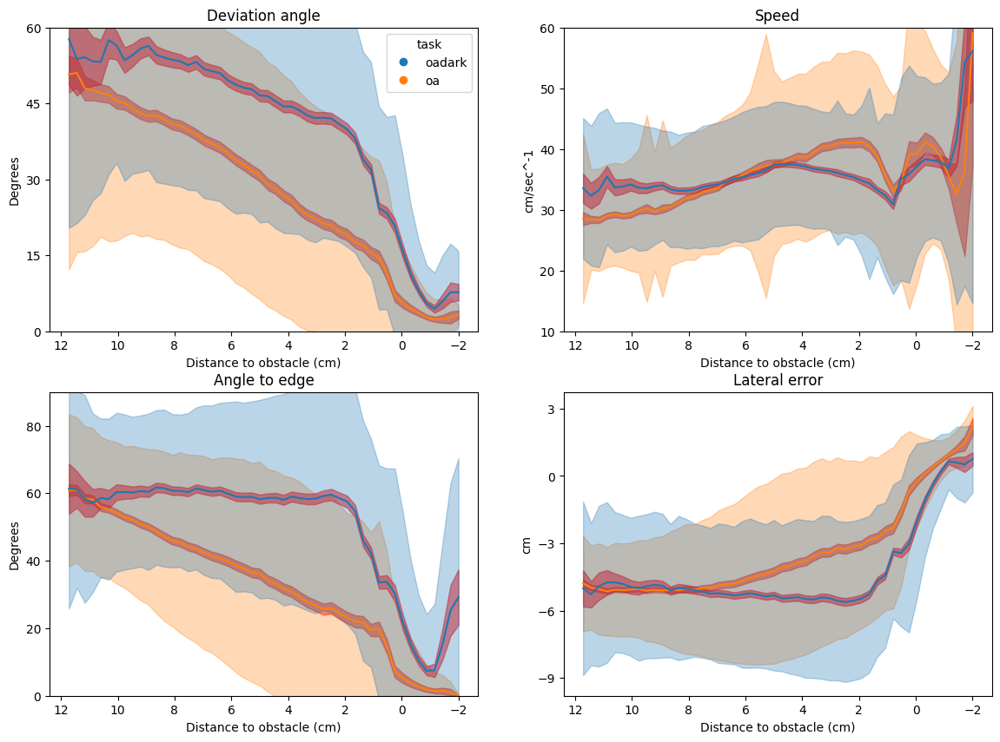

In [49]:
df_dark = dark_short[(dark_short['date']!='071323')]

df_light = oa_short[(oa_short['date']!='072323')
    &(oa_short['date']!='072623')&(oa_short['date']!='072823')].sample(500)
data = pd.concat([df_dark,df_light])

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

#data = drop_nans_in_columns(data,'skill')
#oa_short[oa_short['animal']!=[i for i in oa_short.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 12, .28)
fig,ax = plt.subplots(2,2,figsize=(14,10))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('Deviation angle')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')
ax[0,0].set(ylabel = 'Degrees')

ax[0,1].set_title('Speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)
ax[0,1].set(ylabel = 'cm/sec^-1')


ax[1,0].set_title('Angle to edge')
ax[1,0].set_ylim(0,90)
ax[1,0].invert_xaxis()
ax[1,0].set(ylabel = 'Degrees')

ax[1,1].set_title('Lateral error')
ax[1,1].invert_xaxis()
ax[1,1].set(ylabel = 'cm')

for subplot in ax.reshape(-1):
    subplot.yaxis.set_major_locator(plt.MaxNLocator(5))
    subplot.set(xlabel = 'Distance to obstacle (cm)')






by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    #ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    samples_array =  np.empty(dev_array.T.shape[0])
    samples_array[:] =np.nan
    std_deveation_obstacle = np.nanstd(dev_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(dev_array.T[i][~np.isnan(dev_array.T[i])].shape[0])
    std_error_obstacle = std_deveation_obstacle/samples_array
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_obstacle, 
    date_dev+std_error_obstacle,color ='red',alpha = .5)  

    ax[0,0].fill_between(xnew, 
    date_dev-std_deveation_obstacle, 
    date_dev+std_deveation_obstacle,color =color,alpha = .3)  

     
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    



#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)

    #ax[0,0].plot(xnew,date_speed,c = color,alpha = 1)
    samples_array =  np.empty(speed_array.T.shape[0])
    samples_array[:] =np.nan
    std_speedeation_obstacle = np.nanstd(speed_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(speed_array.T[i][~np.isnan(speed_array.T[i])].shape[0])
    std_error_obstacle = std_speedeation_obstacle/samples_array
    ax[0,1].fill_between(xnew, 
    date_speed-std_error_obstacle, 
    date_speed+std_error_obstacle,color ='red',alpha = .5)  

    ax[0,1].fill_between(xnew, 
    date_speed-std_speedeation_obstacle, 
    date_speed+std_speedeation_obstacle,color =color,alpha = .3)  

    
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)



for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
        
    #ax[0,0].plot(xnew,date_angle,c = color,alpha = 1)
    samples_array =  np.empty(angle_array.T.shape[0])
    samples_array[:] =np.nan
    std_angleeation_obstacle = np.nanstd(angle_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(angle_array.T[i][~np.isnan(angle_array.T[i])].shape[0])
    std_error_obstacle = std_angleeation_obstacle/samples_array
    ax[1,0].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color ='red',alpha = .5)  

    ax[1,0].fill_between(xnew, 
    date_angle-std_angleeation_obstacle, 
    date_angle+std_angleeation_obstacle,color =color,alpha = .3)  


    ax[1,0].plot(xnew,date_angle,c = color,alpha = 1)


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows())
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
        
    #ax[0,0].plot(xnew,date_angle,c = color,alpha = 1)
    samples_array =  np.empty(angle_array.T.shape[0])
    samples_array[:] =np.nan
    std_angleeation_obstacle = np.nanstd(angle_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(angle_array.T[i][~np.isnan(angle_array.T[i])].shape[0])
    std_error_obstacle = std_angleeation_obstacle/samples_array
    ax[1,1].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color ='red',alpha = .5)  

    ax[1,1].fill_between(xnew, 
    date_angle-std_angleeation_obstacle, 
    date_angle+std_angleeation_obstacle,color =color,alpha = .3)  


    ax[1,1].plot(xnew,date_angle,c = color,alpha = 1)

 


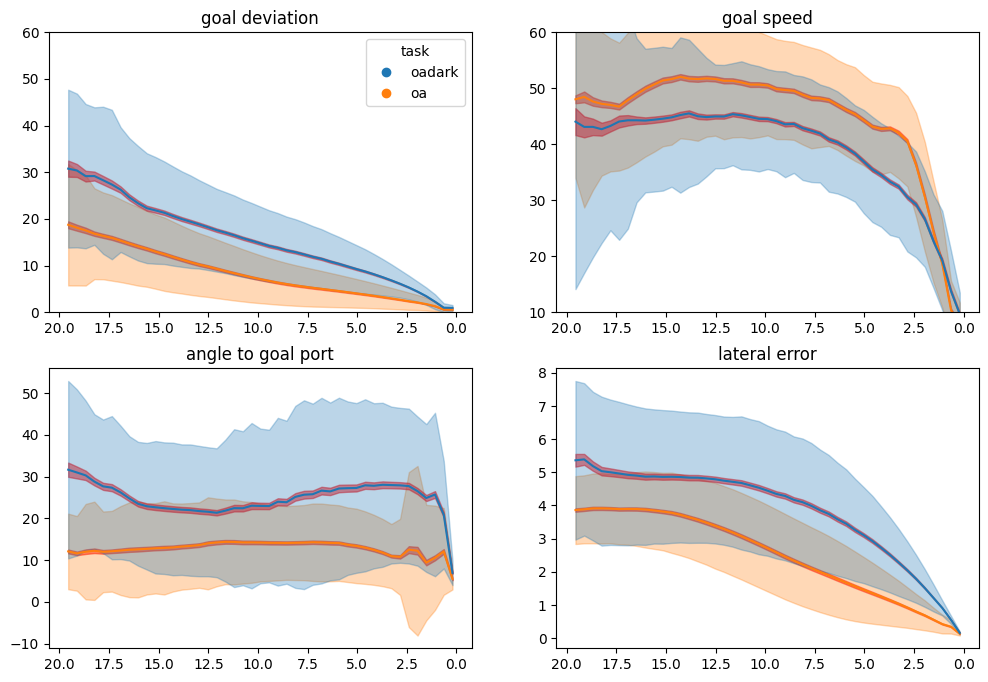

In [100]:
df_dark = dark_long[(dark_long['date']!='071323')]

df_light = oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')].sample(500)
data = pd.concat([df_dark,df_light])

data = drop_nans_in_columns(data,'goal_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'goal_ind')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('goal deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')

ax[0,1].set_title('goal speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to goal port')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    #ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    samples_array =  np.empty(dev_array.T.shape[0])
    samples_array[:] =np.nan
    std_deveation_obstacle = np.nanstd(dev_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(dev_array.T[i][~np.isnan(dev_array.T[i])].shape[0])
    std_error_obstacle = std_deveation_obstacle/samples_array
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_obstacle, 
    date_dev+std_error_obstacle,color ='red',alpha = .5)  

    ax[0,0].fill_between(xnew, 
    date_dev-std_deveation_obstacle, 
    date_dev+std_deveation_obstacle,color =color,alpha = .3)  

     
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    



#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):-1].astype(float),row[1]['ts_speed'][int(row[1]['goal_ind']):].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)

    #ax[0,0].plot(xnew,date_speed,c = color,alpha = 1)
    samples_array =  np.empty(speed_array.T.shape[0])
    samples_array[:] =np.nan
    std_speedeation_obstacle = np.nanstd(speed_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(speed_array.T[i][~np.isnan(speed_array.T[i])].shape[0])
    std_error_obstacle = std_speedeation_obstacle/samples_array
    ax[0,1].fill_between(xnew, 
    date_speed-std_error_obstacle, 
    date_speed+std_error_obstacle,color ='red',alpha = .5)  

    ax[0,1].fill_between(xnew, 
    date_speed-std_speedeation_obstacle, 
    date_speed+std_speedeation_obstacle,color =color,alpha = .3)  

    
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)



for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['ts_angle_to_target_port'][int(row[1]['goal_ind']):].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
        
    #ax[0,0].plot(xnew,date_angle,c = color,alpha = 1)
    samples_array =  np.empty(angle_array.T.shape[0])
    samples_array[:] =np.nan
    std_angleeation_obstacle = np.nanstd(angle_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(angle_array.T[i][~np.isnan(angle_array.T[i])].shape[0])
    std_error_obstacle = std_angleeation_obstacle/samples_array
    ax[1,0].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color ='red',alpha = .5)  

    ax[1,0].fill_between(xnew, 
    date_angle-std_angleeation_obstacle, 
    date_angle+std_angleeation_obstacle,color =color,alpha = .3)  


    ax[1,0].plot(xnew,date_angle,c = color,alpha = 1)


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['ts_lateral_error_to_target_port'][int(row[1]['goal_ind']):].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
        
    #ax[0,0].plot(xnew,date_angle,c = color,alpha = 1)
    samples_array =  np.empty(angle_array.T.shape[0])
    samples_array[:] =np.nan
    std_angleeation_obstacle = np.nanstd(angle_array,axis=0)
    for i in list(range(samples_array.shape[0])):
        samples_array[i]= np.sqrt(angle_array.T[i][~np.isnan(angle_array.T[i])].shape[0])
    std_error_obstacle = std_angleeation_obstacle/samples_array
    ax[1,1].fill_between(xnew, 
    date_angle-std_error_obstacle, 
    date_angle+std_error_obstacle,color ='red',alpha = .5)  

    ax[1,1].fill_between(xnew, 
    date_angle-std_angleeation_obstacle, 
    date_angle+std_angleeation_obstacle,color =color,alpha = .3)  


    ax[1,1].plot(xnew,date_angle,c = color,alpha = 1)

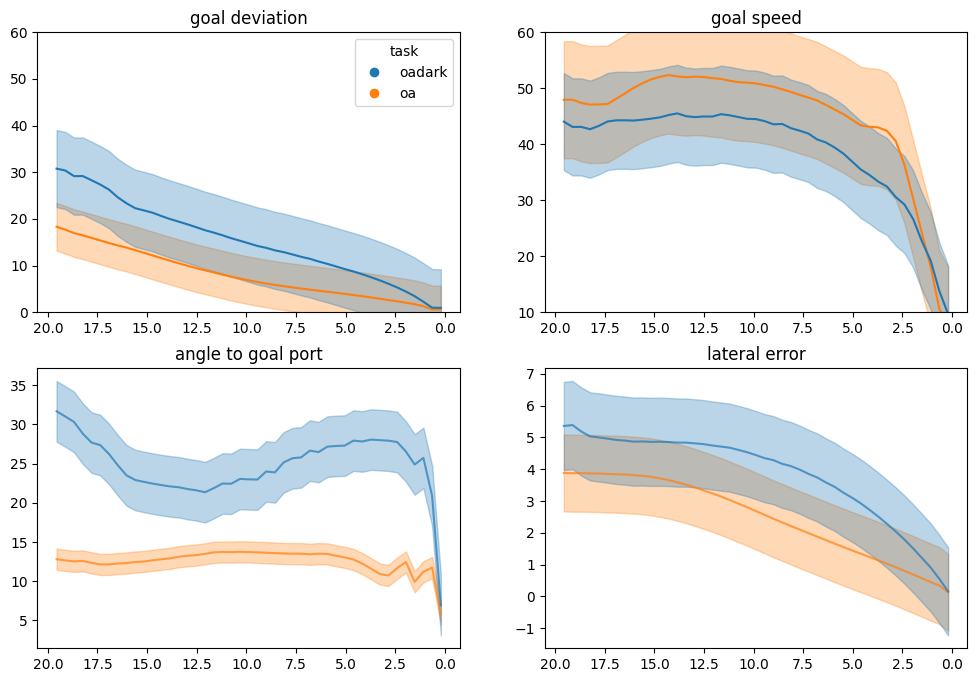

In [8]:
df_dark = dark_long[(dark_long['date']!='071323')]

df_light = oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
data = pd.concat([df_dark,df_light])

data = drop_nans_in_columns(data,'goal_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'goal_ind')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('goal deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')

ax[0,1].set_title('goal speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to goal port')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][int(row[1]['goal_ind']):],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)
    std_error_goal = np.nanstd(date_dev,axis=0)
    ax[0,0].fill_between(xnew, 
    date_dev-std_error_goal, 
    date_dev+std_error_goal,color =color,alpha = .3) 
    



#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):-1].astype(float),row[1]['ts_speed'][int(row[1]['goal_ind']):].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][int(row[1]['goal_ind']):],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)
    std_error_goal = np.nanstd(date_speed,axis=0)
    ax[0,1].fill_between(xnew, 
    date_speed-std_error_goal, 
    date_speed+std_error_goal,color =color,alpha = .3) 

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['ts_angle_to_target_port'][int(row[1]['goal_ind']):].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][int(row[1]['goal_ind']):],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)
    std_error_goal = np.nanstd(date_angle,axis=0)
    ax[1,0].fill_between(xnew, 
    date_angle-std_error_goal, 
    date_angle+std_error_goal,color =color,alpha = .3) 



for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['ts_lateral_error_to_target_port'][int(row[1]['goal_ind']):].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][int(row[1]['goal_ind']):],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)
    std_error_goal = np.nanstd(date_angle,axis=0)
    ax[1,1].fill_between(xnew, 
    date_angle-std_error_goal, 
    date_angle+std_error_goal,color =color,alpha = .3) 





In [ ]:
data.ts_distance_from_edge

49      [17.256718057463203, 17.093465555663897, 16.89...
53      [17.202083442716905, 16.953754858525137, 16.64...
54      [17.23100447757956, 16.852799884246643, 16.511...
102     [18.583814885296768, 18.29835215986777, 17.953...
104     [18.63177113375479, 18.30511108154976, 17.8827...
                              ...                        
3513    [19.354479235509146, 19.020761829294273, 18.63...
891     [18.377952051352153, 18.15935498632119, 17.962...
4778    [18.964420823179168, 18.475361021918438, 18.07...
2857    [20.57911168075372, 20.056255760648682, 19.538...
1079    [18.85630594556065, 18.517628699541348, 18.261...
Name: ts_distance_from_edge, Length: 1081, dtype: object

In [ ]:
flatten_list
sns.kdeplot(x=)

In [ ]:
df_dark = dark_long[(dark_long['date']!='071323')]

df_light = oa_long[(oa_long['date']!='072323')
    &(oa_long['date']!='072623')&(oa_long['date']!='072823')]
data = pd.concat([df_dark,df_light])

sns.kdeplot(x=)

In [ ]:
def ts_lateral_error_to_target_port(df):
    for direction, direction_frame in df.groupby(['odd']):
        for ind,row in direction_frame.iterrows():
            if direction == 'right':
                nose_y = row['ts_nose_y_cm'].astype(float)
                port_y = np.nanmean([np.nanmean(row['leftportB_y_cm']),row['leftportT_y_cm']])
                lateral_error = []
                for i in nose_y:
                    err = np.abs(i -port_y)
                    lateral_error.append(err)
                lateral_error = np.array(lateral_error)        
                df.at[ind,'ts_lateral_error_to_target_port'] = lateral_error.astype(object) 
            else:
                nose_y = row['ts_nose_y_cm'].astype(float)
                port_y = np.nanmean([np.nanmean(row['rightportB_y_cm']),row['rightportT_y_cm']])
                lateral_error = []
                for i in nose_y:
                    err = np.abs(i -port_y)
                    lateral_error.append(err)
                lateral_error = np.array(lateral_error)        
                df.at[ind,'ts_lateral_error_to_target_port'] = lateral_error.astype(object) 
                
def compute_obstacle_tortuosity_distance_threshold(df,thresh):
    df = drop_nans_in_columns(df,'obstacle_ind')
    for ind,row in df.iterrows():
        nose_x = row.ts_nose_x_cm
        nose_y = row.ts_nose_y_cm
        try:
            distance_thresh = np.argwhere(row.ts_distance_from_edge>=thresh).max()
            obstacle_ind = int(row.obstacle_ind)
        except ValueError:
            continue
        try:
            thresh_tor, thresh_lin = compute_tortuosity(nose_x[distance_thresh:obstacle_ind],nose_y[distance_thresh:obstacle_ind])
            df.at[ind,'ob_tortuosity'+'_'+str(thresh)] =thresh_tor
            df.at[ind,'ob_linearity'+'_'+str(thresh)] = thresh_lin
            df.at[ind,'percent_change_ob_tortuosity'+'_'+str(thresh)] =(thresh_tor - row.ob_tortuosity) * 100
            df.at[ind,'percent_change_ob_linearity'+'_'+str(thresh)] = (thresh_lin - row.ob_linearity) * 100
        except IndexError:
            df.at[ind,'ob_tortuosity'+'_'+str(thresh)] =np.nan
            df.at[ind,'ob_linearity'+'_'+str(thresh)] = np.nan
            df.at[ind,'percent_change_ob_tortuosity'+'_'+str(thresh)] =np.nan
            df.at[ind,'percent_change_ob_linearity'+'_'+str(thresh)] = np.nan
    return df
                
        

In [ ]:

data= pd.concat([oa_long,dark_long])
data = compute_obstacle_tortuosity_distance_threshold(data,15)
data = compute_obstacle_tortuosity_distance_threshold(data,10)
data = compute_obstacle_tortuosity_distance_threshold(data,5)



In [ ]:
oa_long

In [ ]:

data= oa_long
data = compute_obstacle_tortuosity_distance_threshold(data,10)
dat = data.sample(1)
fig,ax = plt.subplots()
plot_arena_single(dat,ax,obstacle=True)
nose_x = dat.ts_nose_x_cm.to_numpy()[0]
nose_y = dat.ts_nose_y_cm.to_numpy()[0]
distance_thresh = np.argwhere(dat.ts_distance_from_edge.to_numpy()[0]>=10).max()
obstacle_ind = int(dat.obstacle_ind)
ax.plot(dat.obstacle_nose_x.to_numpy()[0],dat.obstacle_nose_y.to_numpy()[0])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][0],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][0],dat.obstacle_nose_y.to_numpy()[0][-1]])
ax.plot(nose_x[distance_thresh:obstacle_ind],nose_y[distance_thresh:obstacle_ind])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][distance_thresh],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][distance_thresh],dat.obstacle_nose_y.to_numpy()[0][-1]])

print(dat.ob_linearity_10,dat.skill,dat.task)
print(dat.ob_linearity,oa_long.ob_linearity.mean())

In [ ]:
dat.date

In [ ]:

data= dark_long
data = compute_obstacle_tortuosity_distance_threshold(data,10)
dat = data.sample(1)
fig,ax = plt.subplots()
plot_arena_single(dat,ax,obstacle=True)
nose_x = dat.ts_nose_x_cm.to_numpy()[0]
nose_y = dat.ts_nose_y_cm.to_numpy()[0]
distance_thresh = np.argwhere(dat.ts_distance_from_edge.to_numpy()[0]>=10).max()
obstacle_ind = int(dat.obstacle_ind)
ax.plot(dat.obstacle_nose_x.to_numpy()[0],dat.obstacle_nose_y.to_numpy()[0])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][0],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][0],dat.obstacle_nose_y.to_numpy()[0][-1]])
ax.plot(nose_x[distance_thresh:obstacle_ind],nose_y[distance_thresh:obstacle_ind])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][distance_thresh],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][distance_thresh],dat.obstacle_nose_y.to_numpy()[0][-1]])

print(dat.ob_linearity_10,dat.skill,dat.task)
print(dat.ob_linearity,oa_long.ob_linearity.mean())

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity",hue='skill',common_norm=True)

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity_10",hue='skill',common_norm=True)

In [ ]:
data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="go_linearity",common_norm=False)

In [ ]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="ob_linearity",common_norm=False)

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity",common_norm=True)

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

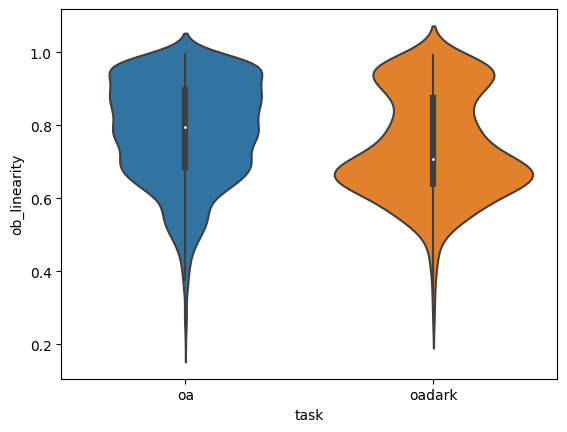

In [125]:
sns.violinplot(data=data, x="task", y="ob_linearity",common_norm=True)

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity_15",common_norm=True,)

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

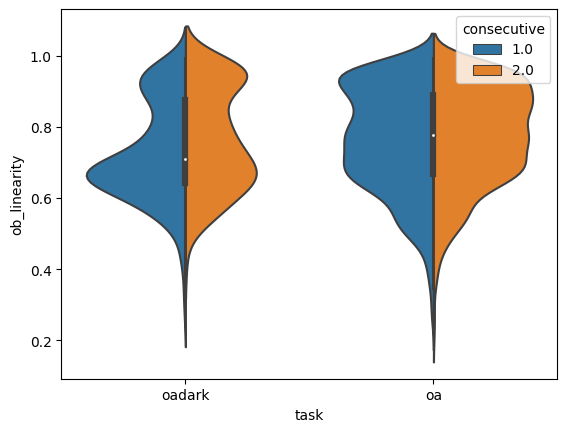

In [128]:
sns.violinplot(data=data, x="task", y="ob_linearity",hue = 'consecutive',common_norm=True,split = True)

<AxesSubplot: xlabel='task', ylabel='ob_linearity_10'>

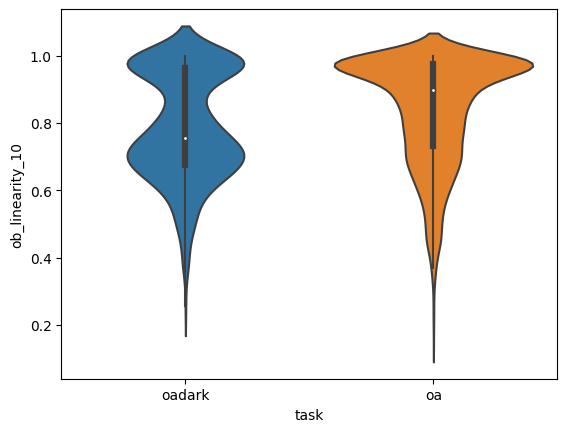

In [134]:
sns.violinplot(data=data, x="task", y="ob_linearity_10",common_norm=True,split = True)

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity_10",hue = 'consecutive',common_norm=True,split = True)

In [ ]:
sns.violinplot(data=data, x="task", y="percent_change_ob_linearity_10",hue = 'consecutive',common_norm=True,split = True)

In [ ]:
sns.violinplot(data=data, x="task", y="percent_change_ob_linearity_10",common_norm=True)

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity_5",common_norm=True)

In [ ]:
sns.violinplot(data=data, x="task", y="ob_linearity_10",common_norm=True)

<AxesSubplot: xlabel='task', ylabel='percent_change_ob_linearity_10'>

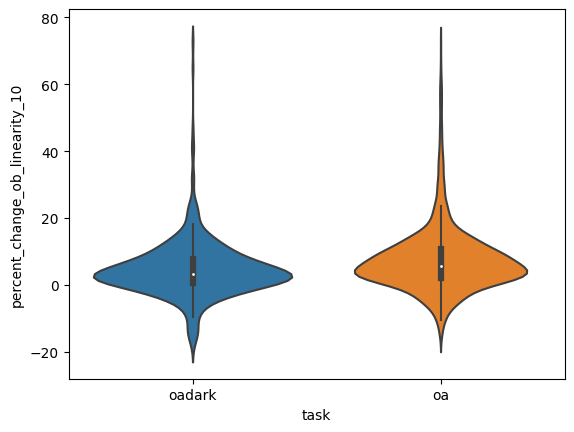

In [11]:
sns.violinplot(data=data, x="task", y="percent_change_ob_linearity_10",common_norm=True)

In [ ]:
sns.violinplot(data=df, x="task", y="ob_linearity",hue='skill',common_norm=True)

In [ ]:
sns.violinplot(data=df, x="task", y="ob_linearity_10",hue='skill',common_norm=True)

In [ ]:
int(dat.obstacle_ind)

In [ ]:
 for ind,row in df.iterrows():
        nose_x = row.ts_nose_x_cm
        nose_y = row.ts_nose_y_cm
        distance_thresh = np.argwhere(row.ts_distance_from_edge>=10).max()
        obstacle_ind = int(row.obstacle_ind)
        try:
            thresh_tor, thresh_lin = compute_tortuosity(nose_x[distance_thresh:obstacle_ind],nose_y[distance_thresh:obstacle_ind])

In [ ]:
100* (.97 - .87)

456    0.887177
Name: ob_linearity_10, dtype: float64 456    naive
Name: skill, dtype: object 456    oa
Name: task, dtype: object
456    0.728336
Name: ob_linearity, dtype: float64 0.7804658330815285


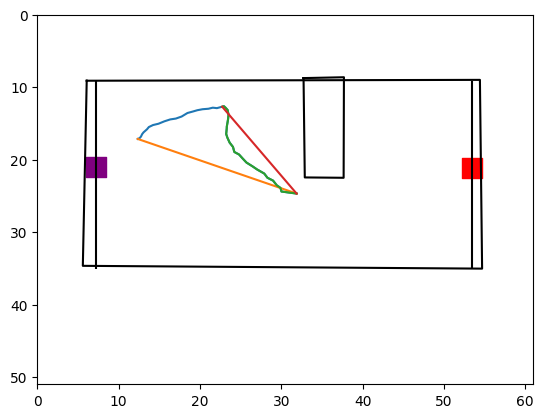

In [12]:
dat = oa_long.sample(1)
fig,ax = plt.subplots()
plot_arena_single(dat,ax,obstacle=True)
nose_x = dat.ts_nose_x_cm.to_numpy()[0]
nose_y = dat.ts_nose_y_cm.to_numpy()[0]
distance_thresh = np.argwhere(dat.ts_distance_from_edge.to_numpy()[0]>=10).max()
obstacle_ind = int(dat.obstacle_ind)
ax.plot(dat.obstacle_nose_x.to_numpy()[0],dat.obstacle_nose_y.to_numpy()[0])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][0],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][0],dat.obstacle_nose_y.to_numpy()[0][-1]])
ax.plot(nose_x[distance_thresh:obstacle_ind],nose_y[distance_thresh:obstacle_ind])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][distance_thresh],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][distance_thresh],dat.obstacle_nose_y.to_numpy()[0][-1]])

print(dat.ob_linearity_10,dat.skill,dat.task)
print(dat.ob_linearity,oa_long.ob_linearity.mean())

In [ ]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="ob_linearity",common_norm=True)

In [ ]:
data = pd.concat([oa_long,dark_long])
compute_obstacle_tortuosity_distance_threshold(data,10)

In [ ]:

fig,ax = plt.subplots()
plot_arena_single(dat,ax,obstacle=True)
ax.plot(dat.obstacle_nose_x.to_numpy()[0],dat.obstacle_nose_y.to_numpy()[0])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][0],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][0],dat.obstacle_nose_y.to_numpy()[0][-1]])
print(dat.ob_linearity,dat.skill)
print(dat.ob_linearity,oa_long.ob_linearity.mean())

In [ ]:
row[1].obstacle_nose_x

In [ ]:
row[1].obstacle_ind

In [ ]:
data = pd.concat([oa_long,dark_long])

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 


#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)



symmetrize_y_axis(ax[1,1])